<a href="https://colab.research.google.com/github/yingzibu/MOL2ADMET/blob/main/results/Kp/Kp%2BM5%2BAD4%2BT3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
print(torch.__version__)
print('cuda: ', torch.cuda.is_available())

2.1.0+cu121
cuda:  True


In [ ]:
! pip install rdkit --quiet
! pip install PyTDC --quiet
! pip install mycolorpy --quiet
! pip install selfies  --quiet
! pip install pubchempy --quiet
! pip install dgllife --quiet
! pip install molvs --quiet
! pip install dgl -f https://data.dgl.ai/wheels/cu121/repo.html --quiet
! pip install dglgo -f https://data.dgl.ai/wheels-test/repo.html --quiet
! pip install DeepPurpose --quiet
! pip install git+https://github.com/bp-kelley/descriptastorus --quiet
! pip install pandas-flavor --quiet

In [ ]:
cd /content/drive/MyDrive/ADMET

/content/drive/MyDrive/ADMET


In [ ]:
from scripts.func_utils import make_path, convert_with_qed_sa, get_min, \
                                plot_loss, plot_performance

from scripts.eval_utils import *
from scripts.preprocess_mols import *
from scripts.model_architecture import *
from scripts.dataset import *
from scripts.train import *
import yaml
import pandas as pd
from scripts.get_vocab import *

from tdc.single_pred import ADME
from tdc.single_pred import Tox
from scripts.CONSTANT import *
from scripts.yaml_utils import *

from scripts.TRAIN import *

print('VOCAB TYPE:', VOCAB_TYPE)


DGL backend not selected or invalid.  Assuming PyTorch for now.


Setting the default backend to "pytorch". You can change it in the ~/.dgl/config.json file or export the DGLBACKEND environment variable.  Valid options are: pytorch, mxnet, tensorflow (all lowercase)
VOCAB TYPE: smiles


In [ ]:
names = names_M5 + names_AD + names_T3 + ['Kp']
names

['CYP2C19_Veith',
 'CYP2D6_Veith',
 'CYP3A4_Veith',
 'CYP1A2_Veith',
 'CYP2C9_Veith',
 'BBB_Martins',
 'PAMPA_NCATS',
 'Lipophilicity_AstraZeneca',
 'Solubility_AqSolDB',
 'hERG_Karim',
 'AMES',
 'LD50_Zhu',
 'Kp']

In [7]:
folder_name = 'Kp+M5+AD4+T3/'
for model_type in ['MLP', 'AttentiveFP', 'GIN', 'RNN']:
    print('\n','='*30, model_type, '='*30)
    perfs = []
    for i in range(3):
        file_name = folder_name + model_type + '_MT_' + str(i) + '.yml'
        p = yml_report(file_name)
        perfs.append(p)
    eval_perf_list(perfs, 'Kp', metrics_dict={})



 ============================== MLP ==============================
repeated num # 3 idx 1 has the lowest loss
******************** Kp ******************** 
	|       mae      |       mse      |       rmse      |       r2      
	&6.524$\pm$0.339  &142.138$\pm$8.274  &11.917$\pm$0.346  &0.247$\pm$0.044  
 idx 1: &7.003            &140.827            &11.867            &0.254            


 ============================== AttentiveFP ==============================
repeated num # 3 idx 2 has the lowest loss
******************** Kp ******************** 
	|       mae      |       mse      |       rmse      |       r2      
	&5.944$\pm$0.059  &132.100$\pm$10.644  &11.484$\pm$0.469  &0.301$\pm$0.056  
 idx 2: &5.864            &117.310            &10.831            &0.379            


 ============================== GIN ==============================
repeated num # 3 idx 2 has the lowest loss
******************** Kp ******************** 
	|       mae      |       mse      |       rmse      |  

Found local copy...
Loading...


path: Kp+M5+AD4+T3 is created

Run # 0 for MLP MT	 | save dir:  Kp+M5+AD4+T3/MLP_MT_0 | 	cannot open Kp+M5+AD4+T3/MLP_MT_0.yml, retrain
collect data for:  ['CYP2C19_Veith', 'CYP2D6_Veith', 'CYP3A4_Veith', 'CYP1A2_Veith', 'CYP2C9_Veith', 'BBB_Martins', 'PAMPA_NCATS', 'Lipophilicity_AstraZeneca', 'Solubility_AqSolDB', 'hERG_Karim', 'AMES', 'LD50_Zhu', 'Kp']


Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!



START scaling train valid test data set: 
---> scale Lipophilicity_AstraZeneca | min -1.500 | max 4.500

START scaling train valid test data set: 
---> scale Solubility_AqSolDB | min -13.172 | max 2.138

START scaling train valid test data set: 
---> scale LD50_Zhu | min -0.343 | max 10.207

START scaling train valid test data set: 
---> scale Kp | min 0.014 | max 135.460
Finished scaling process | dict_scale: {'Lipophilicity_AstraZeneca': [-1.5, 4.5], 'Solubility_AqSolDB': [-13.1719, 2.1376816201], 'LD50_Zhu': [-0.3429999999999999, 10.207], 'Kp': [0.0139545499259114, 135.4599736770797]} 

---> loader for ['CYP2C19_Veith', 'CYP2D6_Veith', 'CYP3A4_Veith', 'CYP1A2_Veith', 'CYP2C9_Veith', 'BBB_Martins', 'PAMPA_NCATS', 'Lipophilicity_AstraZeneca', 'Solubility_AqSolDB', 'hERG_Karim', 'AMES', 'LD50_Zhu', 'Kp']
--> preparing data loader for model type  MLP
---> converting SMILES to MACCS...
---> FINISHED
--> preparing data loader for model type  MLP
---> converting SMILES to MACCS...
---> FI

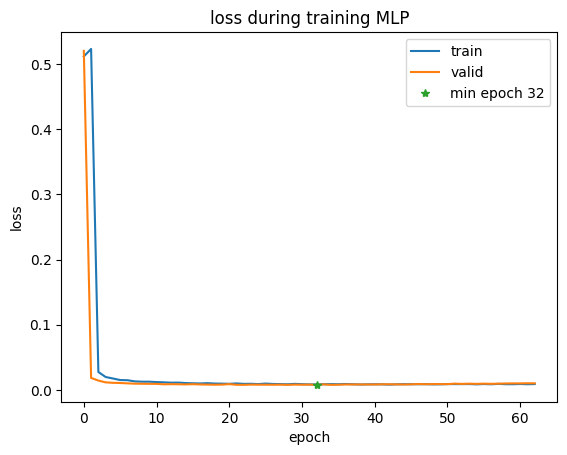

load pretrained model from  Kp+M5+AD4+T3/MLP_MT_0.pt
[Test] Loss: 0.130
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.659  &0.664  &0.606  &0.734  &0.594  &0.664 &0.725 &0.329 &0.659


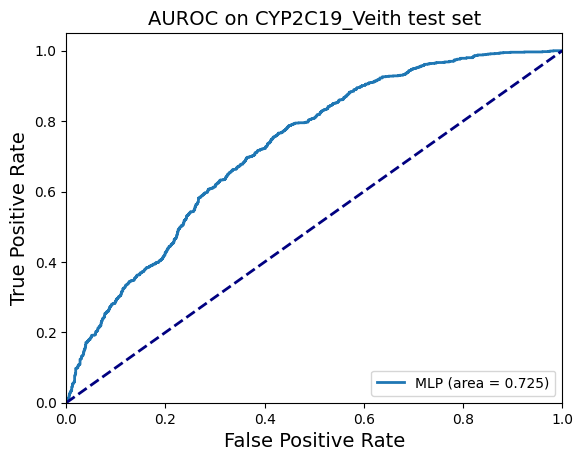

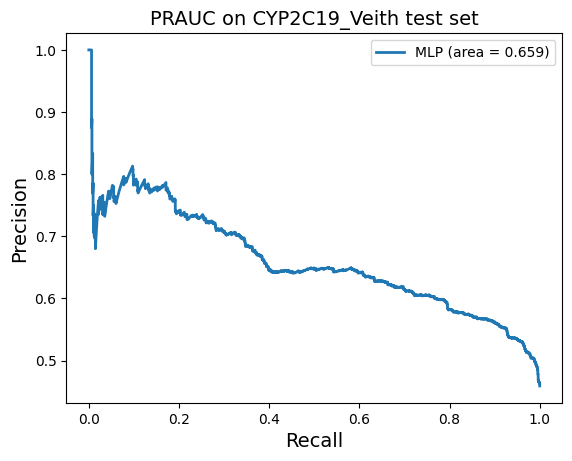


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.500  &  nan  &0.000  &1.000  &  nan &0.439 &  nan &0.167


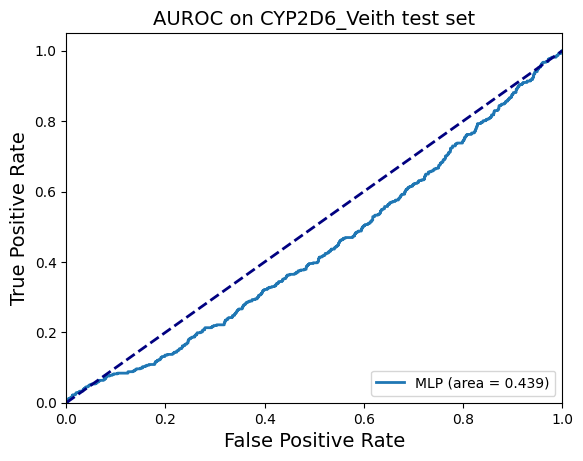

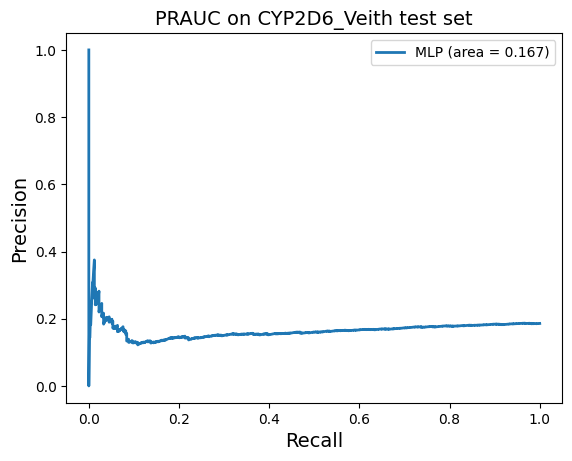


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.599  &0.515  &0.837  &0.035  &0.995  &0.068 &0.750 &0.115 &0.644


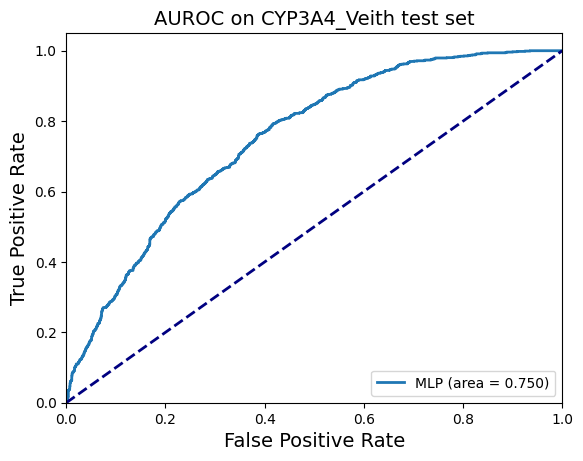

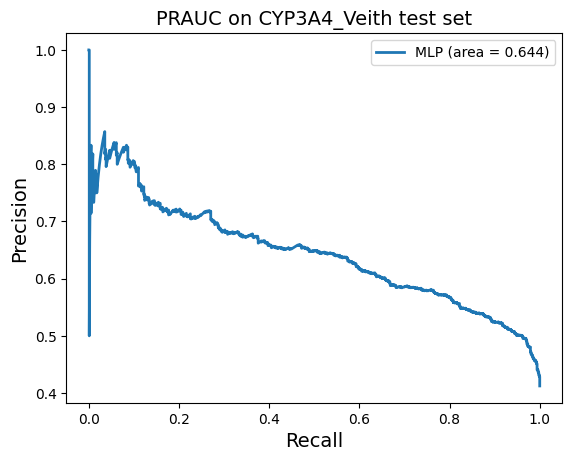


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.645  &0.645  &0.622  &0.635  &0.654  &0.628 &0.695 &0.289 &0.609


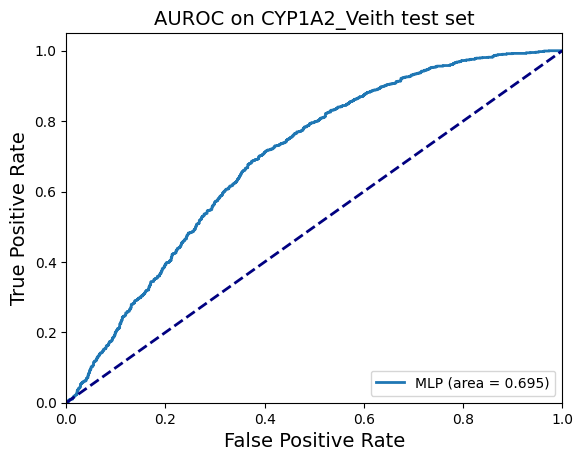

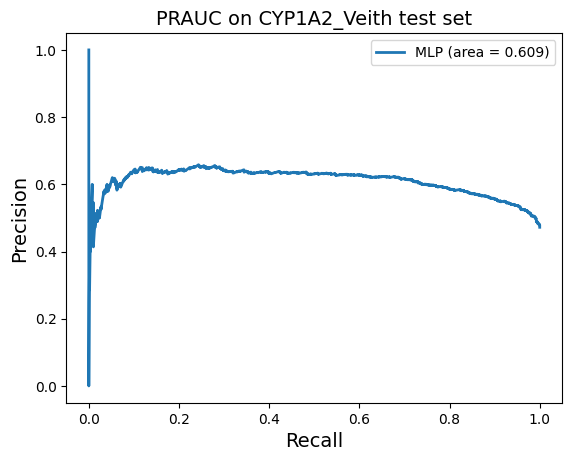


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.658  &0.497  &0.000  &0.000  &0.995  &  nan &0.439 &-0.041 &0.287


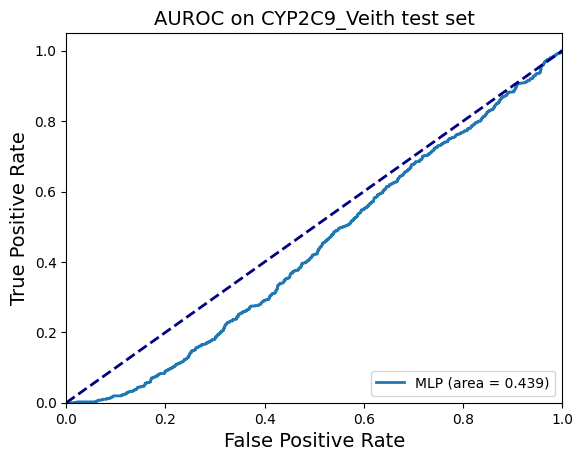

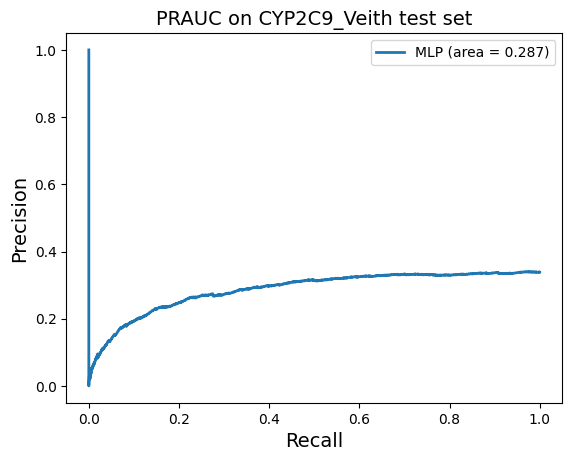


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.746  &0.500  &0.746  &1.000  &0.000  &0.855 &0.752 &  nan &0.874


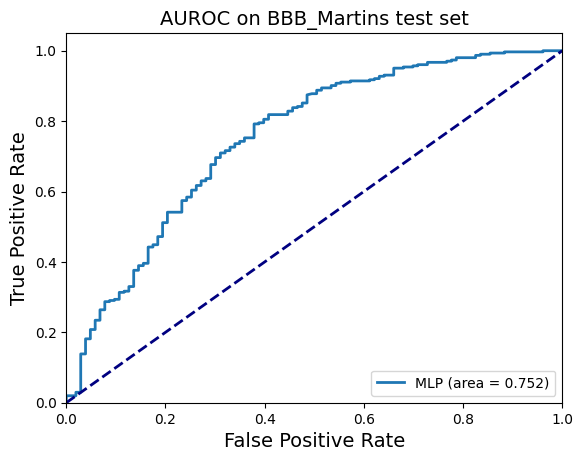

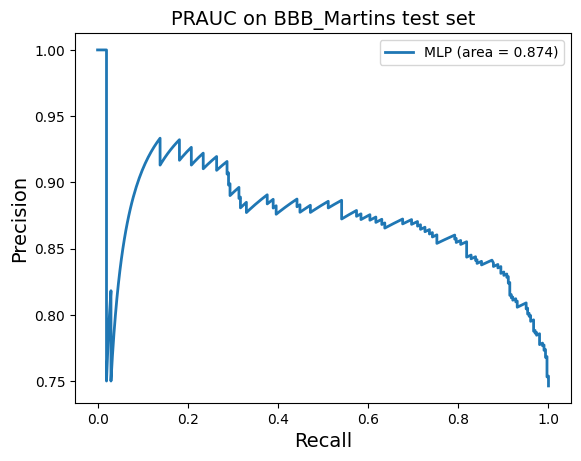


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.845  &0.500  &0.845  &1.000  &0.000  &0.916 &0.749 &  nan &0.916


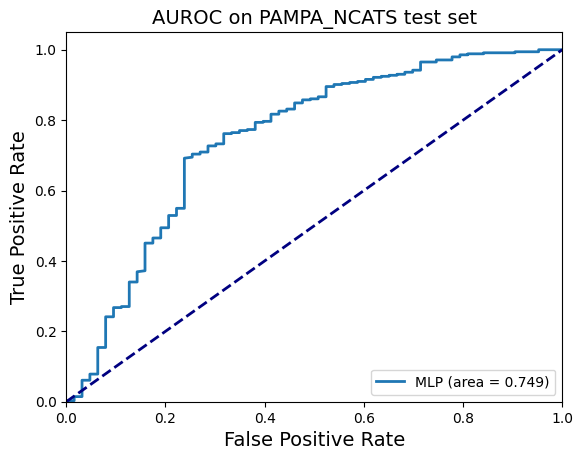

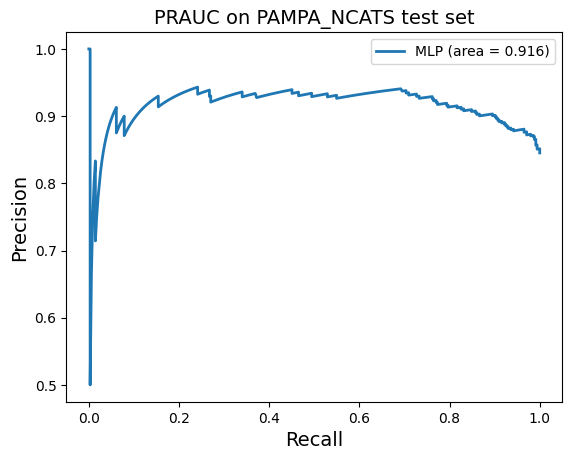


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.685  &0.768  &0.876  &0.482


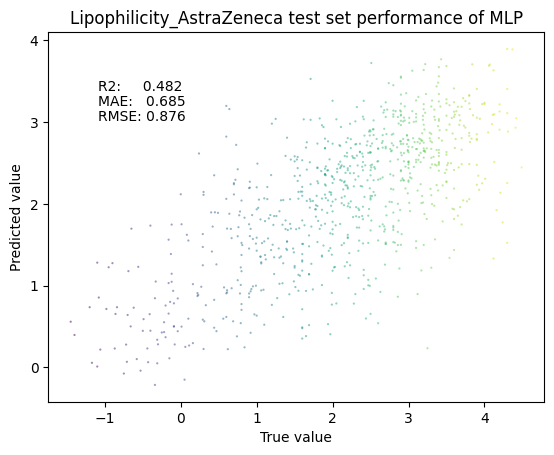


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&1.074  &2.009  &1.417  &0.630


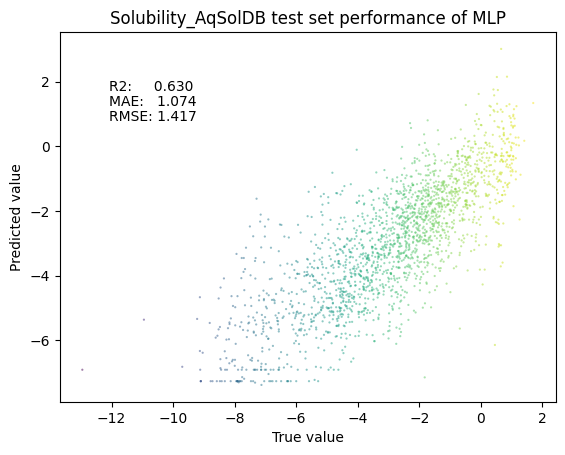


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.571  &0.571  &0.566  &0.611  &0.532  &0.587 &0.609 &0.143 &0.589


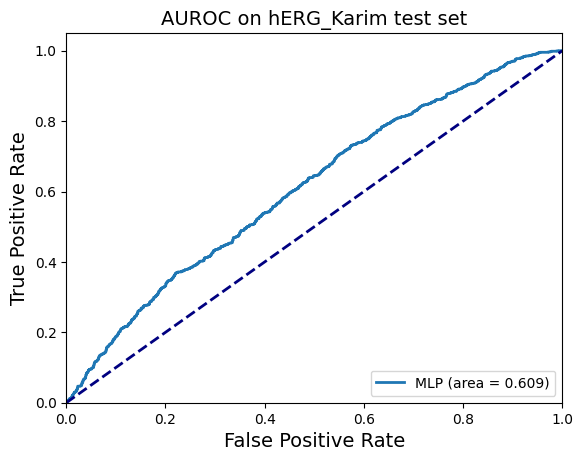

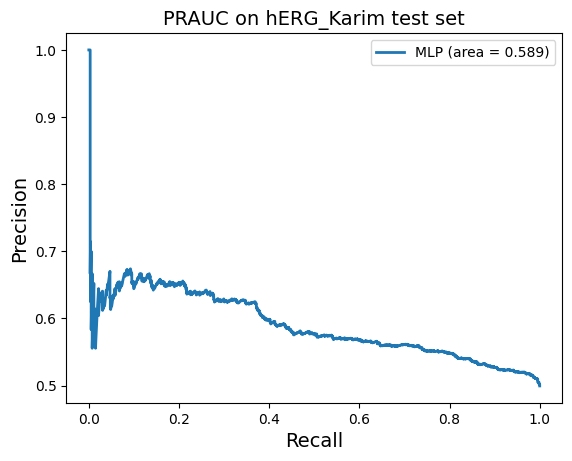


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.637  &0.610  &0.617  &0.893  &0.327  &0.730 &0.665 &0.271 &0.653


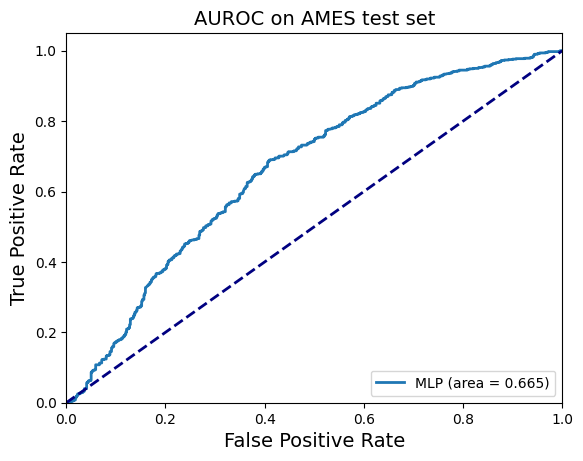

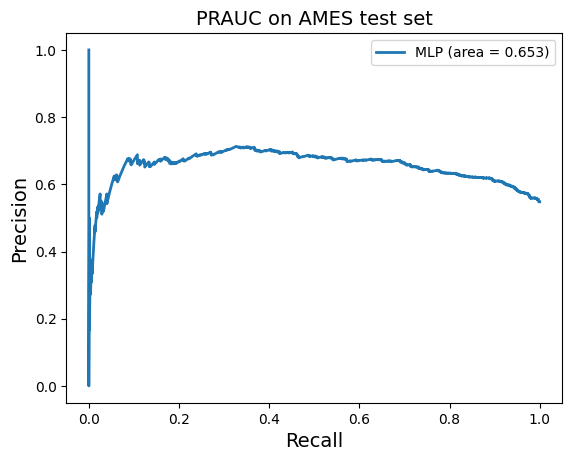


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.507  &0.464  &0.681  &0.481


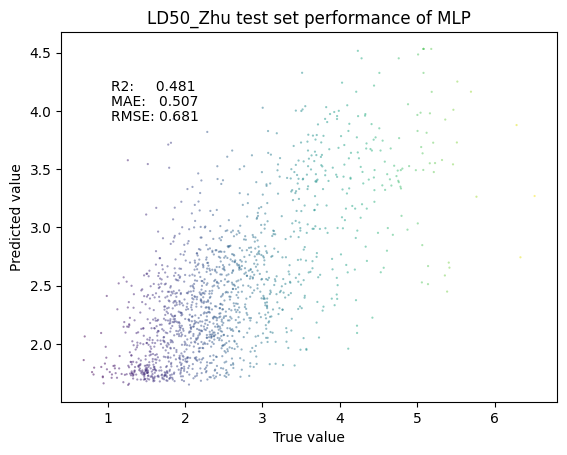


*************** Kp ***************
  MAE     MSE     RMSE    R2
&6.261  &152.863  &12.364  &0.191


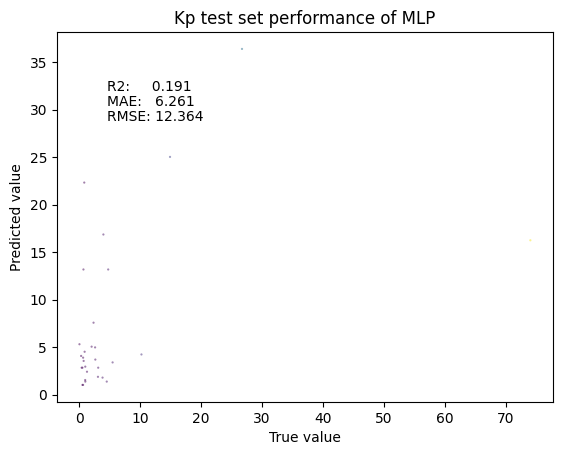



--> Train status saved at Kp+M5+AD4+T3/MLP_MT_0.yml
Finished evaluate test performance, outputs performance dict

Run # 1 for MLP MT	 | save dir:  Kp+M5+AD4+T3/MLP_MT_1 | 	cannot open Kp+M5+AD4+T3/MLP_MT_1.yml, retrain
Model type:  MLP | Model parameters:  32589
Start training MLP...
Epoch:0 [Train] Loss: 0.513 | [Valid] Loss: 0.535	SAVE MODEL: loss: inf -> 0.535 | runtime: 0.235 ms
Epoch:1 [Train] Loss: 0.537 | [Valid] Loss: 0.018	SAVE MODEL: loss: 0.535 -> 0.018 | runtime: 0.239 ms
Epoch:2 [Train] Loss: 0.028 | [Valid] Loss: 0.014	SAVE MODEL: loss: 0.018 -> 0.014 | runtime: 0.237 ms
Epoch:3 [Train] Loss: 0.021 | [Valid] Loss: 0.012	SAVE MODEL: loss: 0.014 -> 0.012 | runtime: 0.241 ms
Epoch:4 [Train] Loss: 0.017 | [Valid] Loss: 0.011	SAVE MODEL: loss: 0.012 -> 0.011 | runtime: 0.234 ms
Epoch:5 [Train] Loss: 0.016 | [Valid] Loss: 0.010	SAVE MODEL: loss: 0.011 -> 0.010 | runtime: 0.236 ms
Epoch:6 [Train] Loss: 0.015 | [Valid] Loss: 0.010	EarlyStopping counter: 1 out of 30
Epoch:7 [Tra

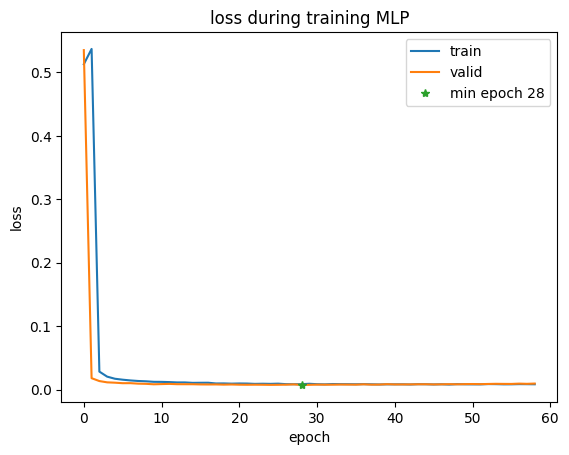

load pretrained model from  Kp+M5+AD4+T3/MLP_MT_1.pt
[Test] Loss: 0.130
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.582  &0.553  &0.645  &0.199  &0.907  &0.304 &0.658 &0.152 &0.585


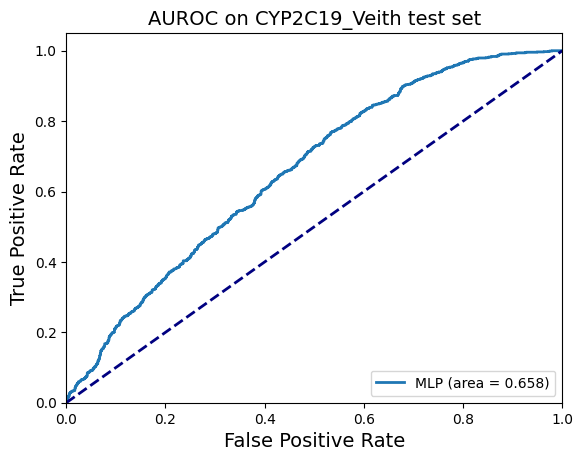

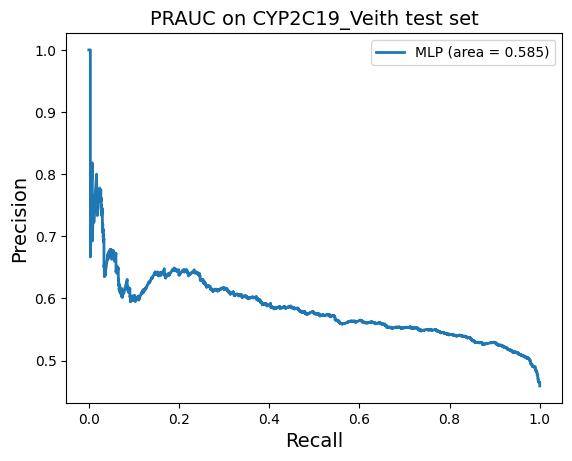


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.500  &  nan  &0.000  &1.000  &  nan &0.507 &  nan &0.184


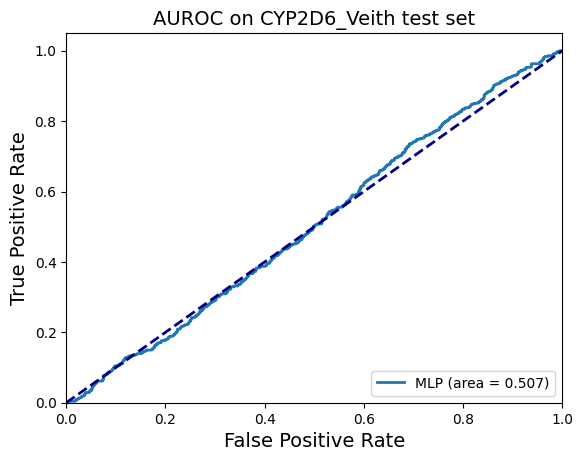

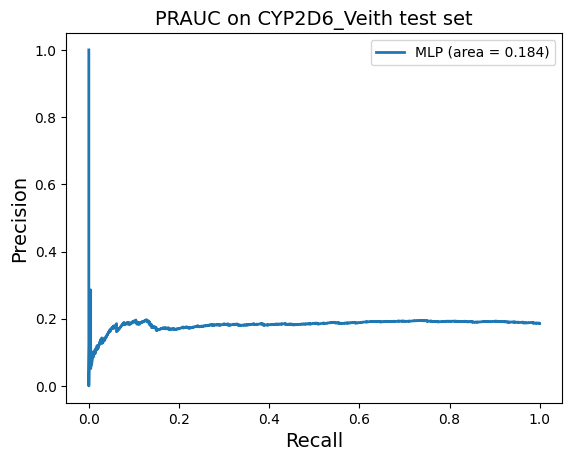


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.588  &0.500  &  nan  &0.000  &1.000  &  nan &0.678 &  nan &0.518


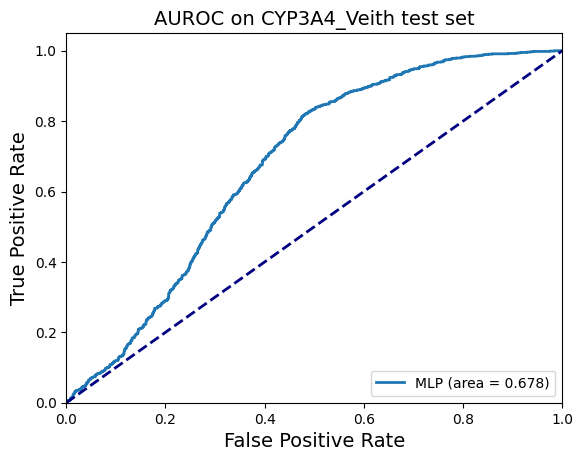

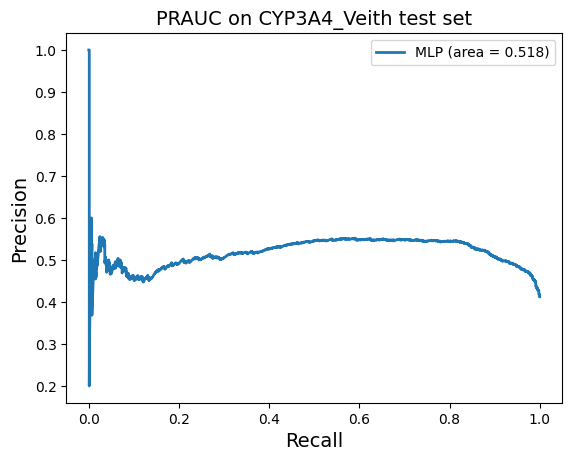


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.529  &0.503  &0.509  &0.050  &0.957  &0.090 &0.613 &0.016 &0.532


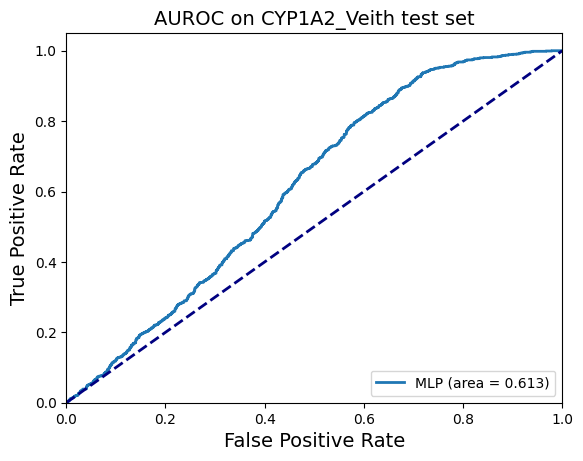

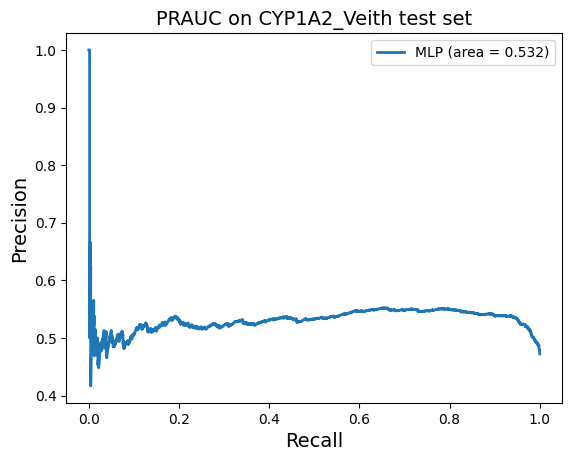


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.661  &0.500  &  nan  &0.000  &1.000  &  nan &0.645 &  nan &0.452


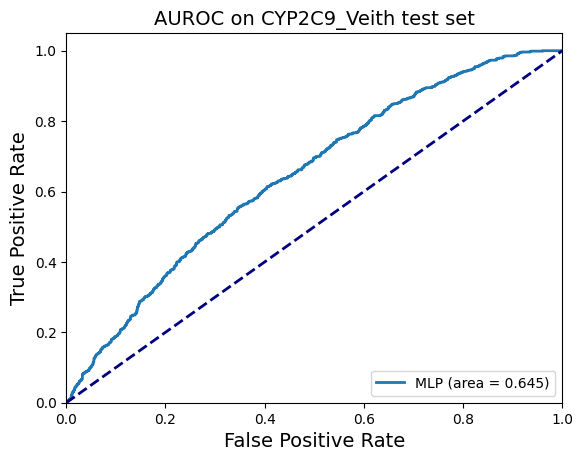

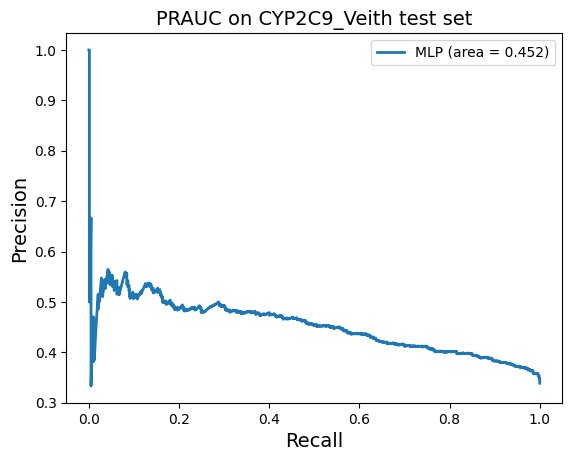


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.746  &0.500  &0.746  &1.000  &0.000  &0.855 &0.626 &  nan &0.815


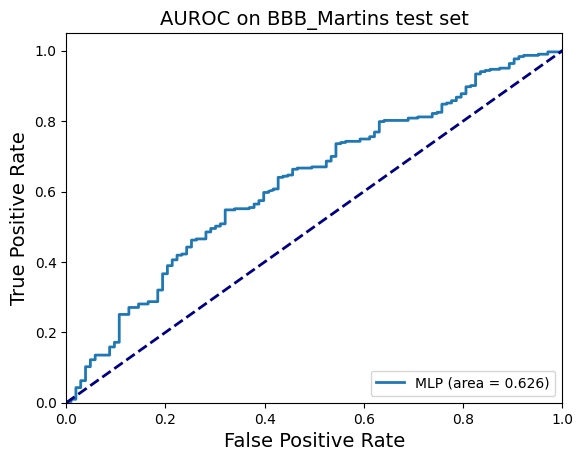

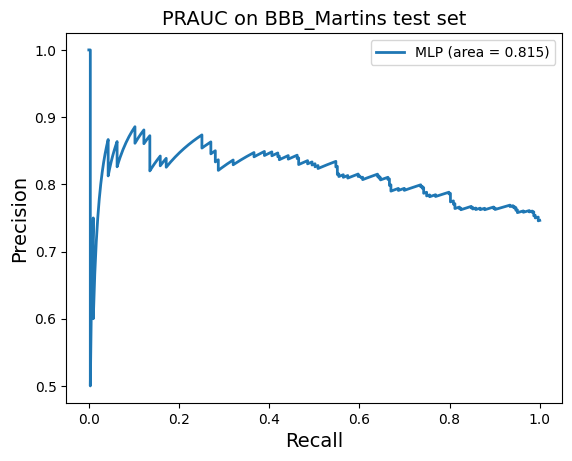


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.845  &0.500  &0.845  &1.000  &0.000  &0.916 &0.639 &  nan &0.892


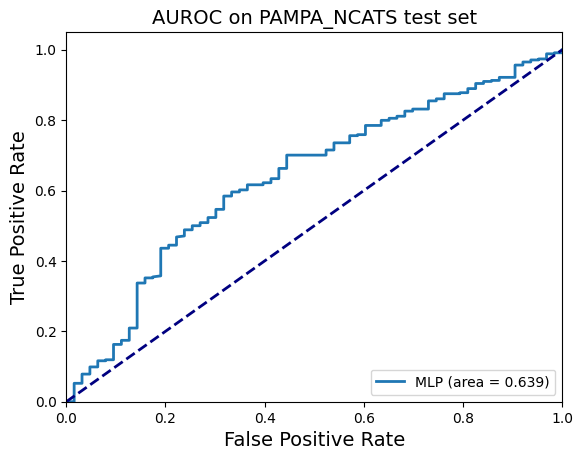

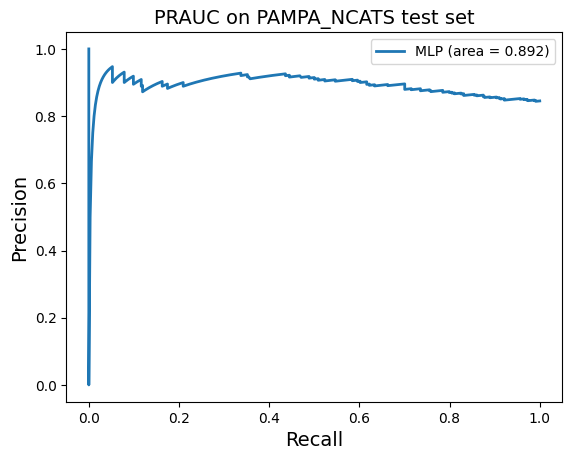


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.708  &0.820  &0.906  &0.446


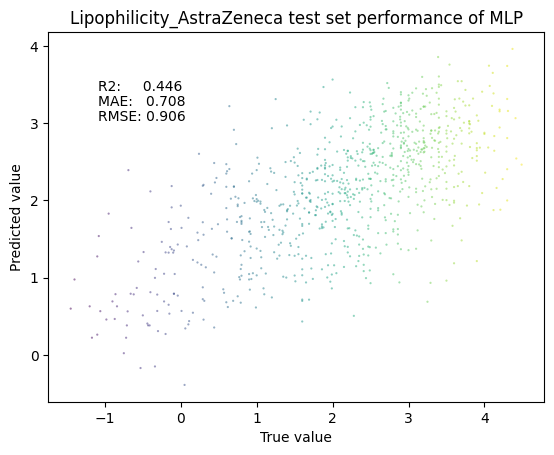


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&1.072  &1.997  &1.413  &0.632


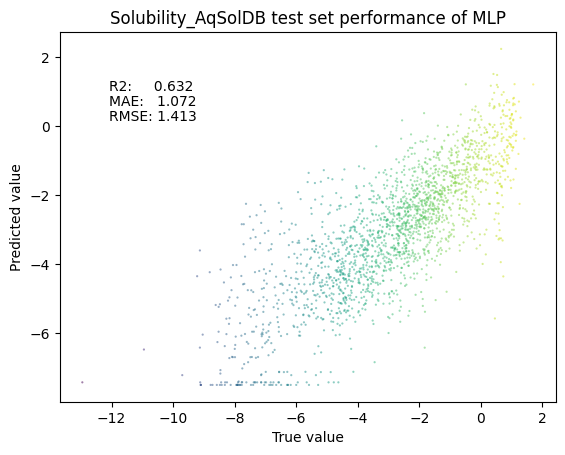


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.533  &0.533  &0.517  &0.967  &0.099  &0.674 &0.603 &0.133 &0.580


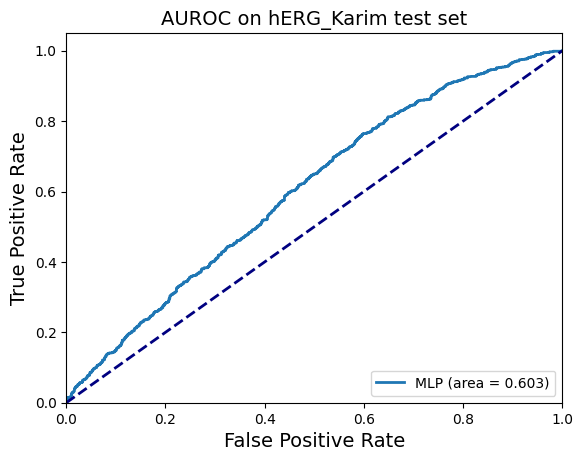

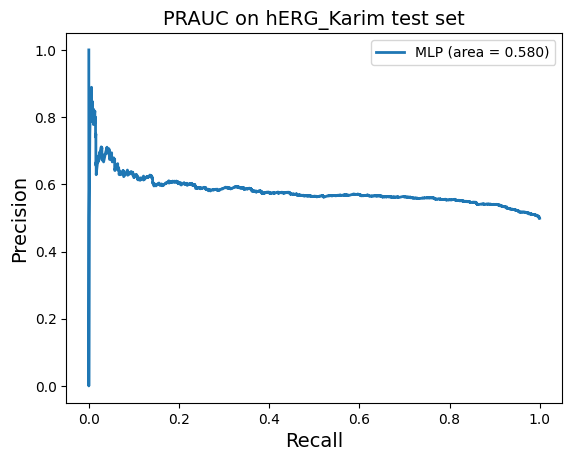


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.606  &0.586  &0.606  &0.803  &0.368  &0.691 &0.624 &0.191 &0.654


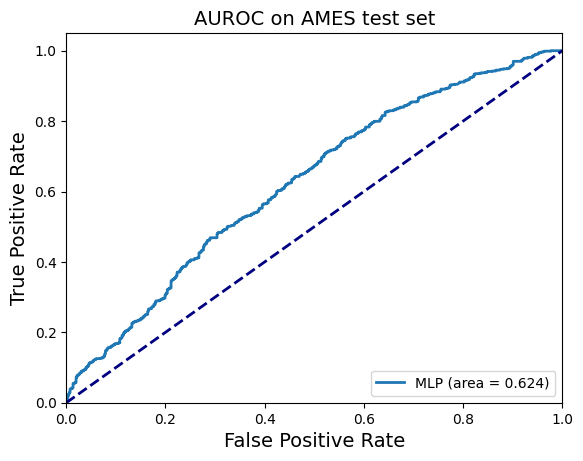

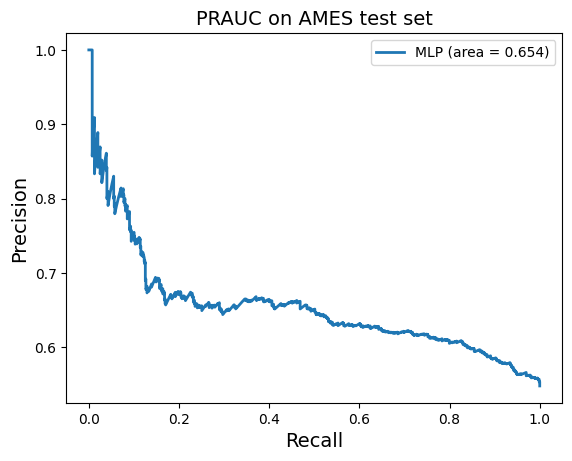


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.514  &0.461  &0.679  &0.484


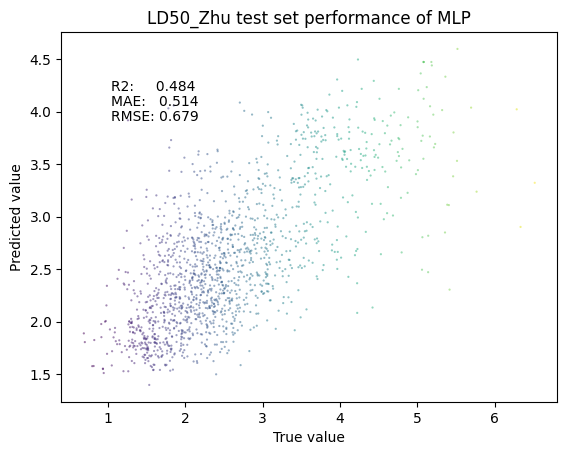


*************** Kp ***************
  MAE     MSE     RMSE    R2
&7.003  &140.827  &11.867  &0.254


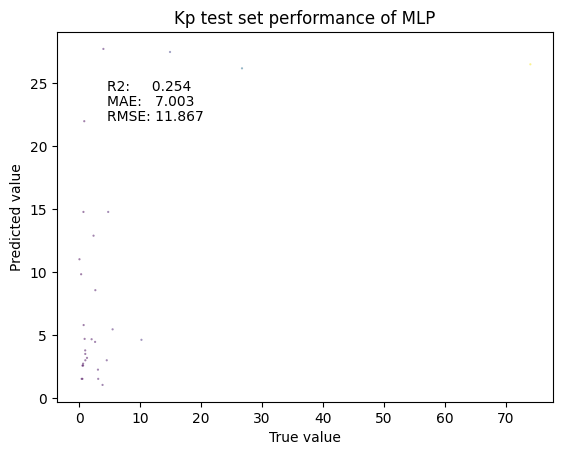



--> Train status saved at Kp+M5+AD4+T3/MLP_MT_1.yml
Finished evaluate test performance, outputs performance dict

Run # 2 for MLP MT	 | save dir:  Kp+M5+AD4+T3/MLP_MT_2 | 	cannot open Kp+M5+AD4+T3/MLP_MT_2.yml, retrain
Model type:  MLP | Model parameters:  32589
Start training MLP...
Epoch:0 [Train] Loss: 0.578 | [Valid] Loss: 0.596	SAVE MODEL: loss: inf -> 0.596 | runtime: 0.233 ms
Epoch:1 [Train] Loss: 0.576 | [Valid] Loss: 0.017	SAVE MODEL: loss: 0.596 -> 0.017 | runtime: 0.235 ms
Epoch:2 [Train] Loss: 0.021 | [Valid] Loss: 0.010	SAVE MODEL: loss: 0.017 -> 0.010 | runtime: 0.237 ms
Epoch:3 [Train] Loss: 0.015 | [Valid] Loss: 0.009	SAVE MODEL: loss: 0.010 -> 0.009 | runtime: 0.238 ms
Epoch:4 [Train] Loss: 0.013 | [Valid] Loss: 0.008	SAVE MODEL: loss: 0.009 -> 0.008 | runtime: 0.238 ms
Epoch:5 [Train] Loss: 0.012 | [Valid] Loss: 0.007	SAVE MODEL: loss: 0.008 -> 0.007 | runtime: 0.238 ms
Epoch:6 [Train] Loss: 0.011 | [Valid] Loss: 0.008	EarlyStopping counter: 1 out of 30
Epoch:7 [Tra

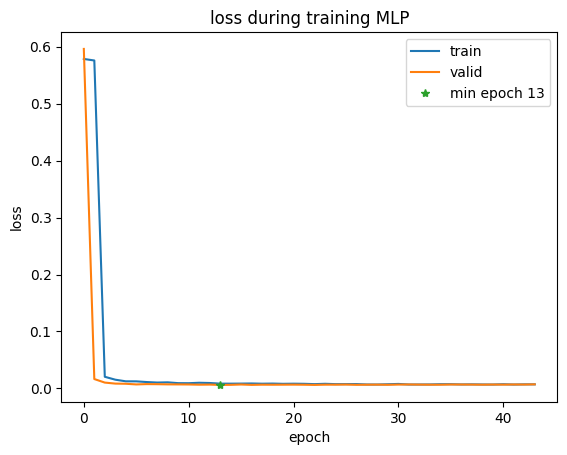

load pretrained model from  Kp+M5+AD4+T3/MLP_MT_2.pt
[Test] Loss: 0.140
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.486  &0.519  &0.470  &0.929  &0.109  &0.624 &0.568 &0.066 &0.525


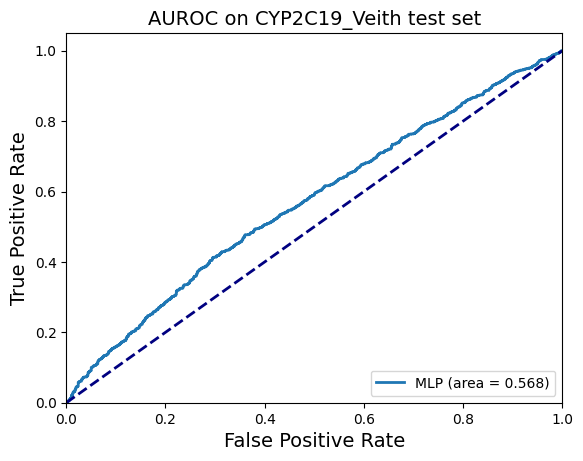

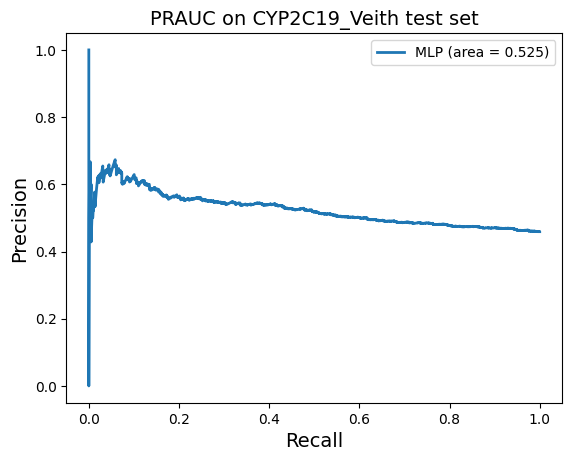


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.212  &0.507  &0.188  &0.975  &0.038  &0.315 &0.506 &0.029 &0.201


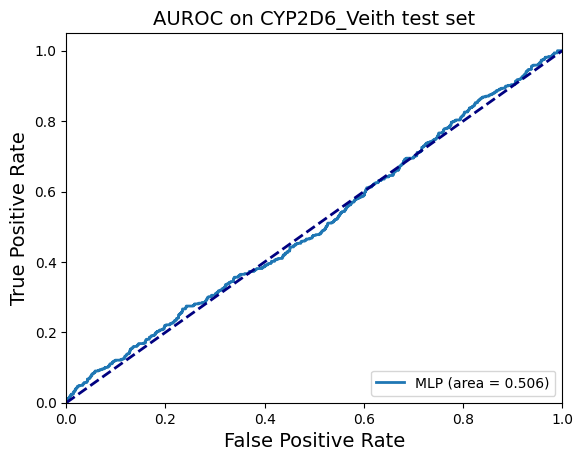

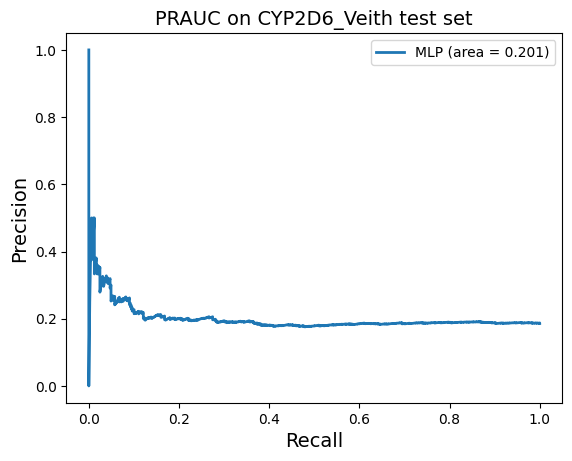


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.588  &0.500  &  nan  &0.000  &1.000  &  nan &0.569 &  nan &0.456


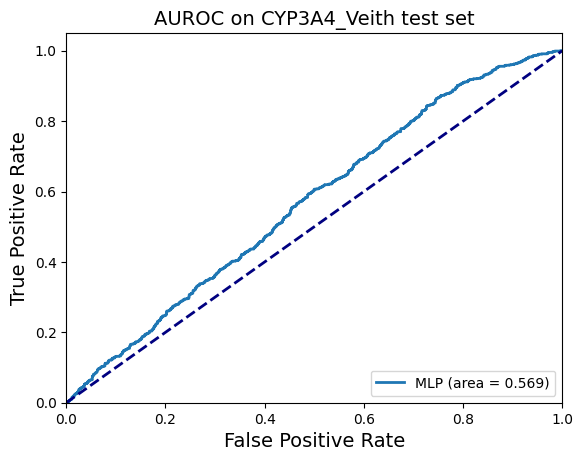

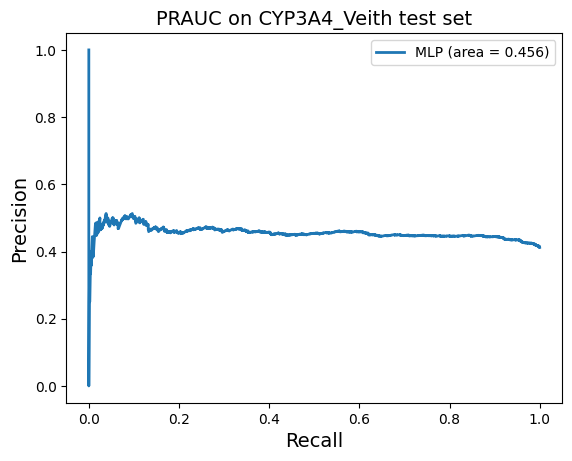


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.528  &0.500  &  nan  &0.000  &1.000  &  nan &0.380 &  nan &0.389


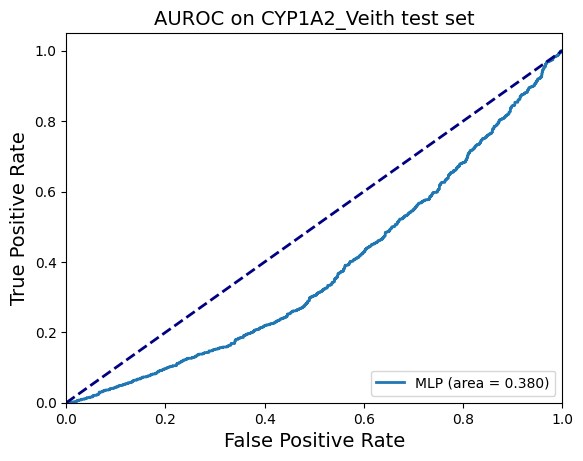

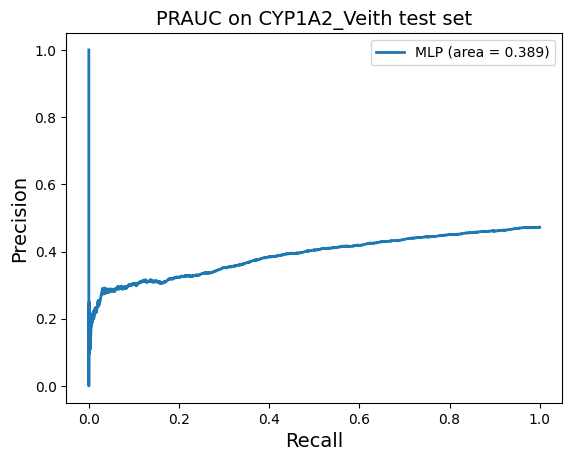


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.339  &0.500  &0.339  &1.000  &0.001  &0.506 &0.655 &0.015 &0.445


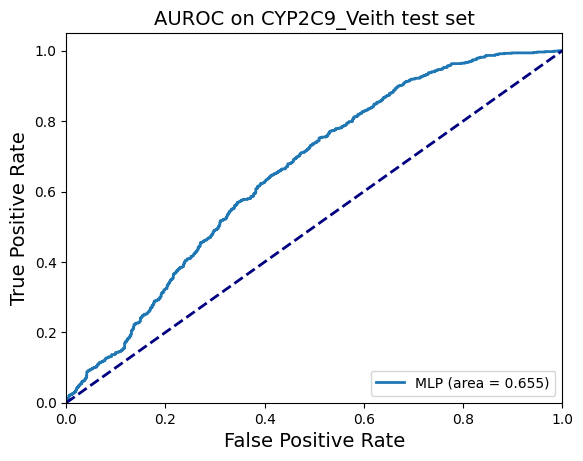

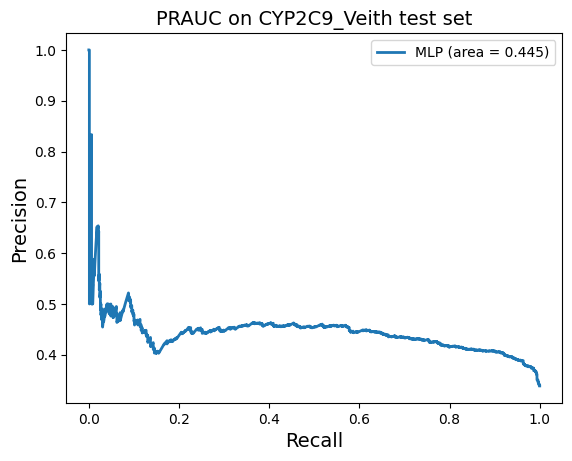


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.246  &0.473  &0.364  &0.013  &0.932  &0.025 &0.414 &-0.147 &0.675


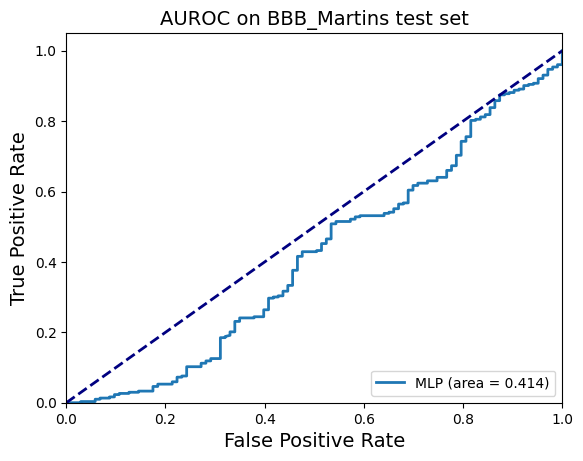

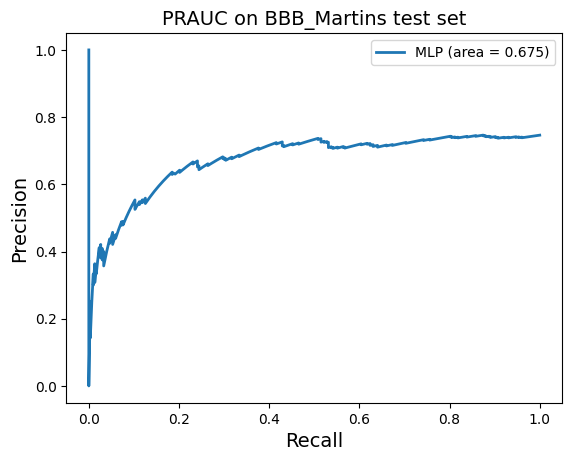


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.845  &0.500  &0.845  &1.000  &0.000  &0.916 &0.765 &  nan &0.937


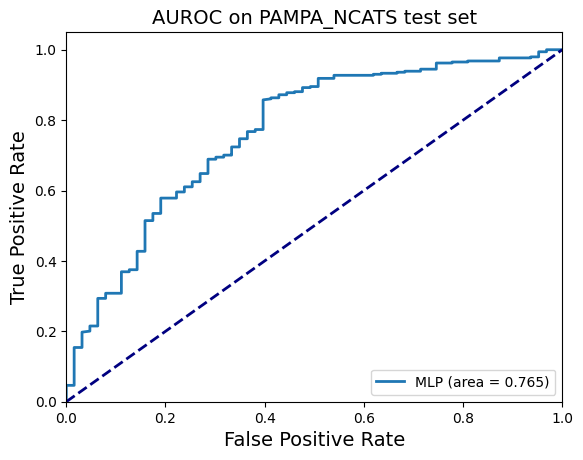

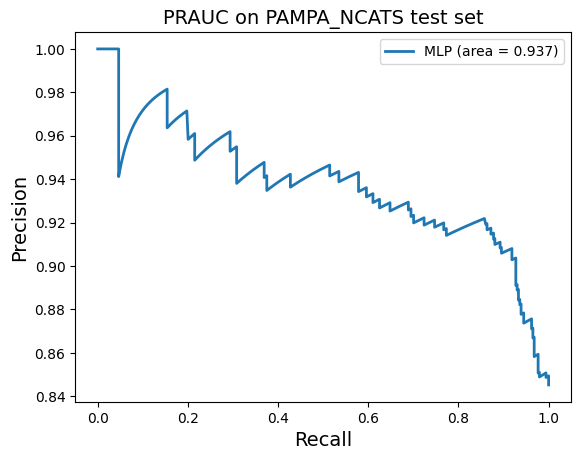


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.879  &1.157  &1.075  &0.219


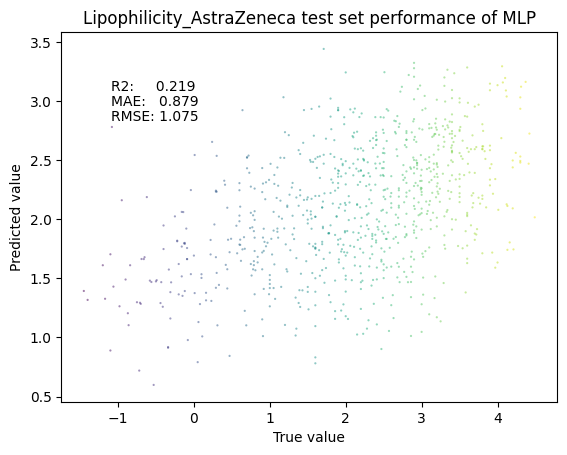


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&2.106  &6.699  &2.588  &-0.234


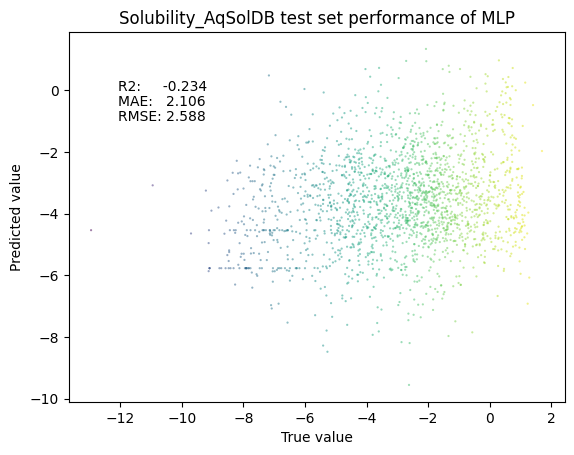


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.501  &0.500  &  nan  &0.000  &1.000  &  nan &0.502 &  nan &0.485


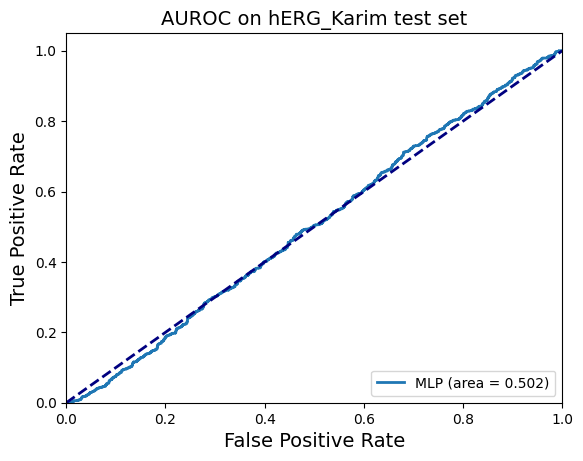

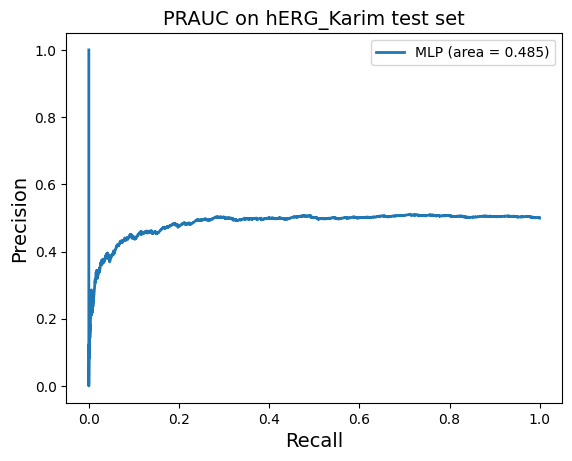


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.548  &0.500  &0.548  &1.000  &0.000  &0.708 &0.610 &  nan &0.638


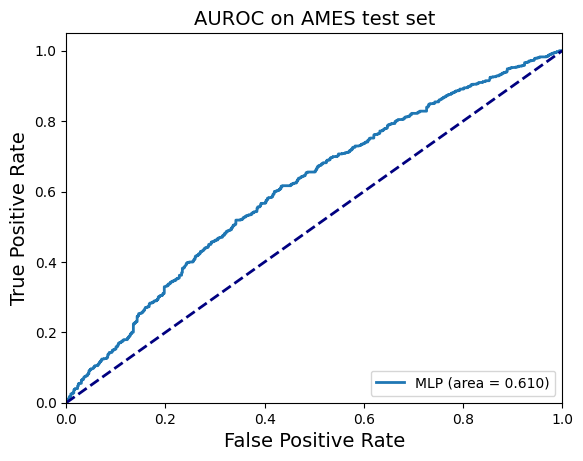

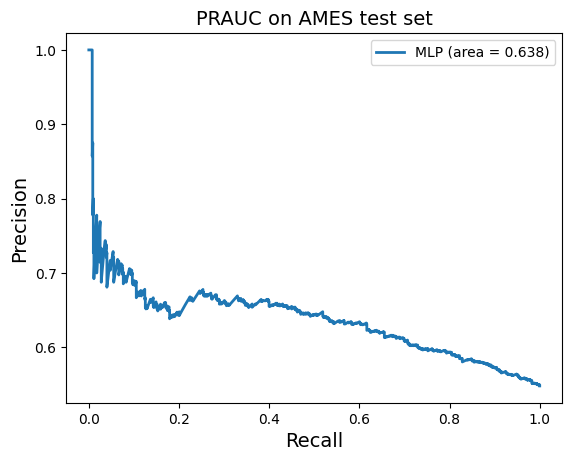


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.540  &0.514  &0.717  &0.425


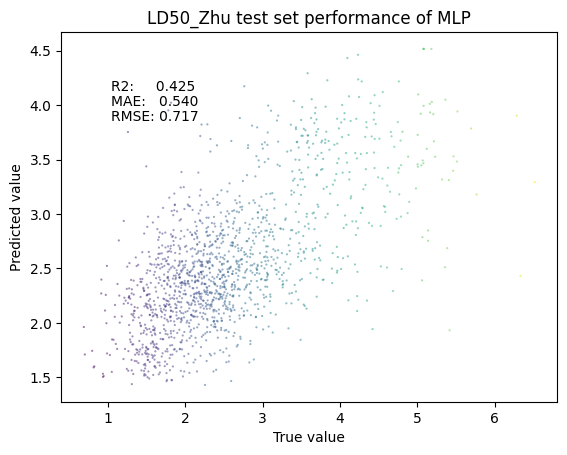


*************** Kp ***************
  MAE     MSE     RMSE    R2
&6.308  &132.724  &11.521  &0.297


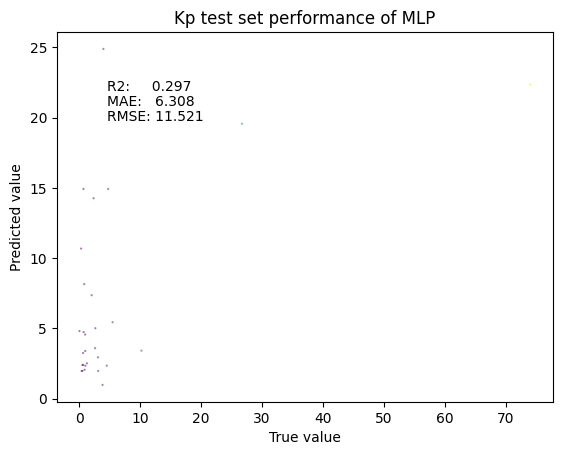

Found local copy...
Loading...
Done!
Found local copy...
Loading...




--> Train status saved at Kp+M5+AD4+T3/MLP_MT_2.yml
Finished evaluate test performance, outputs performance dict
repeated num # 3 idx 1 has the lowest loss
******************** CYP2C19_Veith ******************** 
	|       acc      |       w_acc      |       prec      |       recall      |       sp      |       f1      |       auc      |       mcc      |       ap      
	&0.575$\pm$0.071  &0.579$\pm$0.062  &0.573$\pm$0.075  &0.621$\pm$0.309  &0.537$\pm$0.328  &0.530$\pm$0.161  &0.650$\pm$0.064  &0.182$\pm$0.110  &0.590$\pm$0.055  
 idx 1: &0.582            &0.553            &0.645            &0.199            &0.907            &0.304            &0.658            &0.152            &0.585            

******************** CYP2D6_Veith ******************** 
	|       acc      |       w_acc      |       prec      |       recall      |       sp      |       f1      |       auc      |       mcc      |       ap      
	&0.614$\pm$0.284  &0.502$\pm$0.003  &nan$\pm$nan  &0.325$\pm$0.460  &0.679$\

Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!



START scaling train valid test data set: 
---> scale Lipophilicity_AstraZeneca | min -1.500 | max 4.500

START scaling train valid test data set: 
---> scale Solubility_AqSolDB | min -13.172 | max 2.138

START scaling train valid test data set: 
---> scale LD50_Zhu | min -0.343 | max 10.207

START scaling train valid test data set: 
---> scale Kp | min 0.014 | max 135.460
Finished scaling process | dict_scale: {'Lipophilicity_AstraZeneca': [-1.5, 4.5], 'Solubility_AqSolDB': [-13.1719, 2.1376816201], 'LD50_Zhu': [-0.3429999999999999, 10.207], 'Kp': [0.0139545499259114, 135.4599736770797]} 

---> loader for ['CYP2C19_Veith', 'CYP2D6_Veith', 'CYP3A4_Veith', 'CYP1A2_Veith', 'CYP2C9_Veith', 'BBB_Martins', 'PAMPA_NCATS', 'Lipophilicity_AstraZeneca', 'Solubility_AqSolDB', 'hERG_Karim', 'AMES', 'LD50_Zhu', 'Kp']
--> preparing data loader for model type  AttentiveFP
Processing dgl graphs from scratch...


[Parallel(n_jobs=26)]: Using backend LokyBackend with 26 concurrent workers.
[Parallel(n_jobs=26)]: Done 156 tasks      | elapsed:   11.6s
[Parallel(n_jobs=26)]: Done 649 tasks      | elapsed:   13.7s
[Parallel(n_jobs=26)]: Done 2656 tasks      | elapsed:   18.1s
[Parallel(n_jobs=26)]: Done 6256 tasks      | elapsed:   21.2s
[Parallel(n_jobs=26)]: Done 10656 tasks      | elapsed:   25.1s
[Parallel(n_jobs=26)]: Done 15856 tasks      | elapsed:   29.4s
[Parallel(n_jobs=26)]: Done 21856 tasks      | elapsed:   34.4s
[Parallel(n_jobs=26)]: Done 28656 tasks      | elapsed:   40.1s
[Parallel(n_jobs=26)]: Done 36256 tasks      | elapsed:   46.8s
[Parallel(n_jobs=26)]: Done 44656 tasks      | elapsed:   54.0s
[Parallel(n_jobs=26)]: Done 45130 out of 45181 | elapsed:   54.4s remaining:    0.1s
[Parallel(n_jobs=26)]: Done 45181 out of 45181 | elapsed:   54.4s finished


--> preparing data loader for model type  AttentiveFP
Processing dgl graphs from scratch...


[Parallel(n_jobs=26)]: Using backend LokyBackend with 26 concurrent workers.
[Parallel(n_jobs=26)]: Done 336 tasks      | elapsed:    0.4s
[Parallel(n_jobs=26)]: Done 3820 tasks      | elapsed:    3.2s
[Parallel(n_jobs=26)]: Done 9420 tasks      | elapsed:    8.4s
[Parallel(n_jobs=26)]: Done 9928 out of 9928 | elapsed:    9.0s finished


--> preparing data loader for model type  AttentiveFP
Processing dgl graphs from scratch...


[Parallel(n_jobs=26)]: Using backend LokyBackend with 26 concurrent workers.
[Parallel(n_jobs=26)]: Done 336 tasks      | elapsed:    0.4s
[Parallel(n_jobs=26)]: Done 3820 tasks      | elapsed:    3.2s
[Parallel(n_jobs=26)]: Done 9420 tasks      | elapsed:    7.4s
[Parallel(n_jobs=26)]: Done 14828 tasks      | elapsed:   12.8s
[Parallel(n_jobs=26)]: Done 18184 out of 18184 | elapsed:   15.5s finished


Model type:  AttentiveFP | Model parameters:  3827119
Start training AttentiveFP...
Epoch:0 [Train] Loss: 0.448 | [Valid] Loss: 0.480	SAVE MODEL: loss: inf -> 0.480 | runtime: 0.405 ms
Epoch:1 [Train] Loss: 0.467 | [Valid] Loss: 0.023	SAVE MODEL: loss: 0.480 -> 0.023 | runtime: 0.346 ms
Epoch:2 [Train] Loss: 0.026 | [Valid] Loss: 0.015	SAVE MODEL: loss: 0.023 -> 0.015 | runtime: 0.338 ms
Epoch:3 [Train] Loss: 0.020 | [Valid] Loss: 0.015	EarlyStopping counter: 1 out of 30
Epoch:4 [Train] Loss: 0.018 | [Valid] Loss: 0.015	SAVE MODEL: loss: 0.015 -> 0.015 | runtime: 0.343 ms
Epoch:5 [Train] Loss: 0.016 | [Valid] Loss: 0.013	SAVE MODEL: loss: 0.015 -> 0.013 | runtime: 0.343 ms
Epoch:6 [Train] Loss: 0.016 | [Valid] Loss: 0.013	SAVE MODEL: loss: 0.013 -> 0.013 | runtime: 0.343 ms
Epoch:7 [Train] Loss: 0.016 | [Valid] Loss: 0.012	SAVE MODEL: loss: 0.013 -> 0.012 | runtime: 0.342 ms
Epoch:8 [Train] Loss: 0.014 | [Valid] Loss: 0.011	SAVE MODEL: loss: 0.012 -> 0.011 | runtime: 0.343 ms
Epoch:9 [

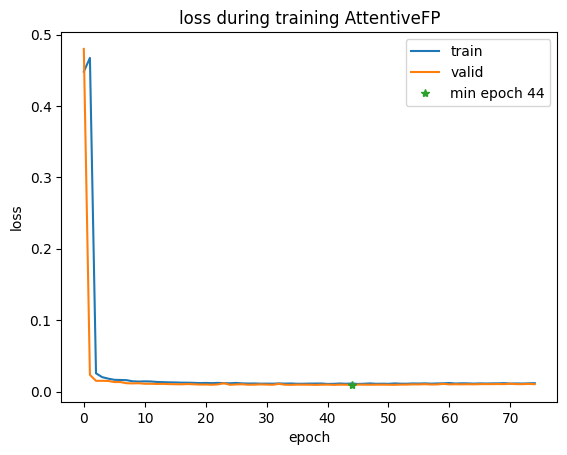

load pretrained model from  Kp+M5+AD4+T3/AttentiveFP_MT_0.pt
[Test] Loss: 0.110
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.728  &0.735  &0.668  &0.813  &0.657  &0.733 &0.802 &0.471 &0.732


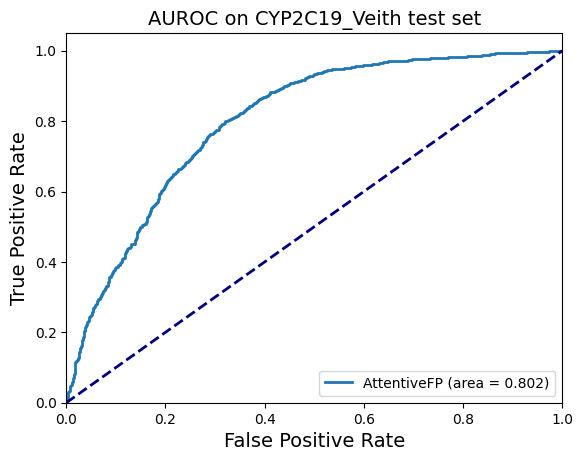

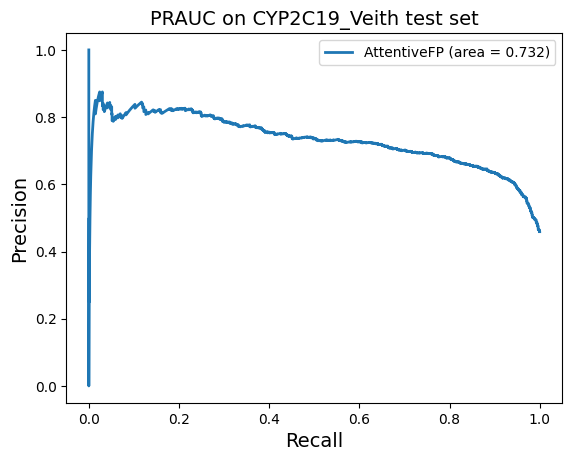


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.823  &0.530  &0.795  &0.064  &0.996  &0.118 &0.771 &0.192 &0.489


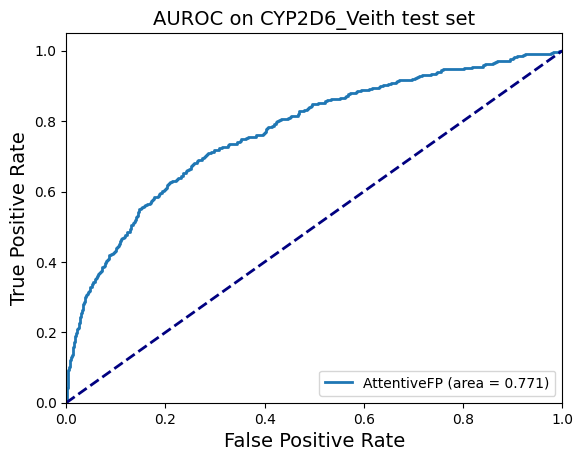

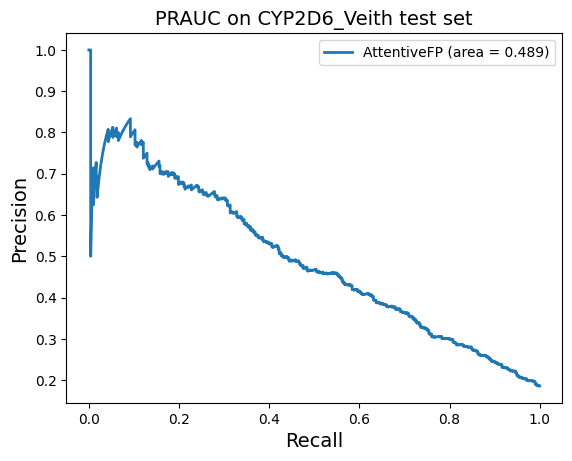


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.704  &0.703  &0.627  &0.698  &0.708  &0.660 &0.771 &0.401 &0.625


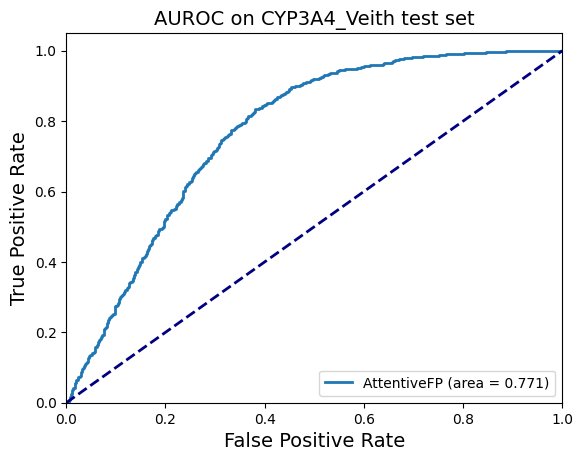

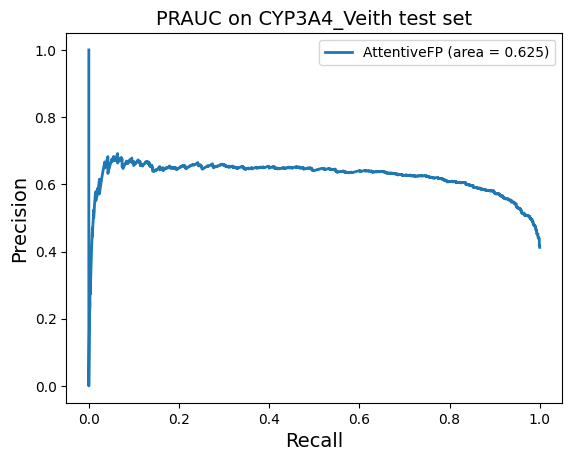


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.789  &0.790  &0.758  &0.812  &0.768  &0.784 &0.869 &0.580 &0.845


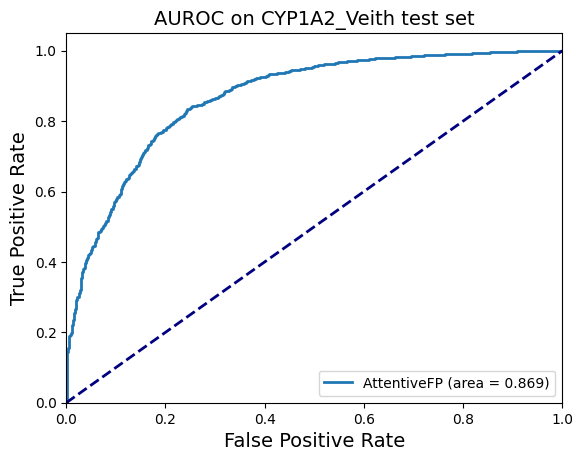

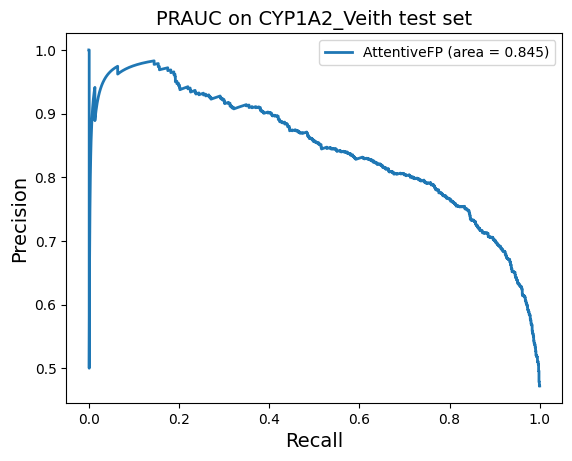


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.765  &0.738  &0.652  &0.656  &0.821  &0.654 &0.824 &0.475 &0.648


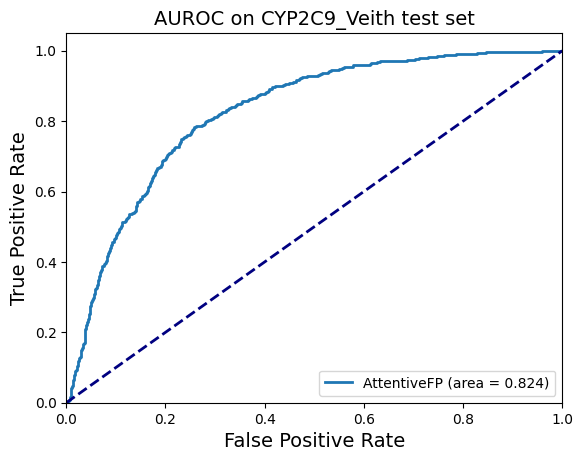

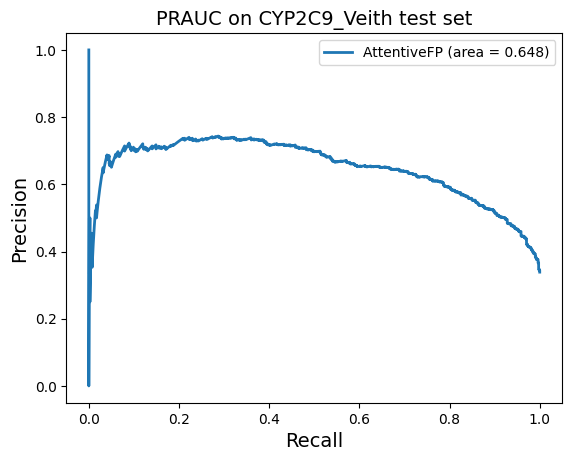


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.815  &0.678  &0.824  &0.957  &0.398  &0.885 &0.834 &0.455 &0.920


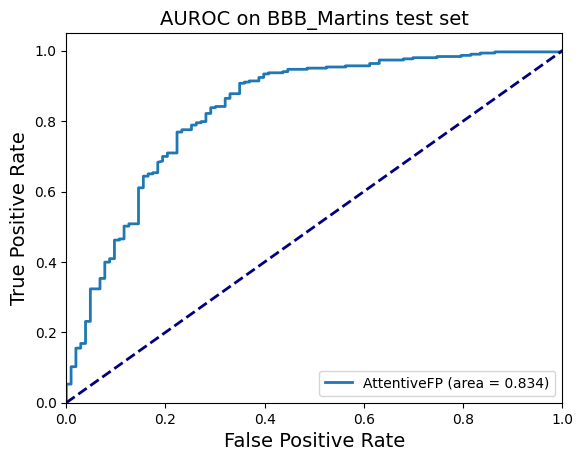

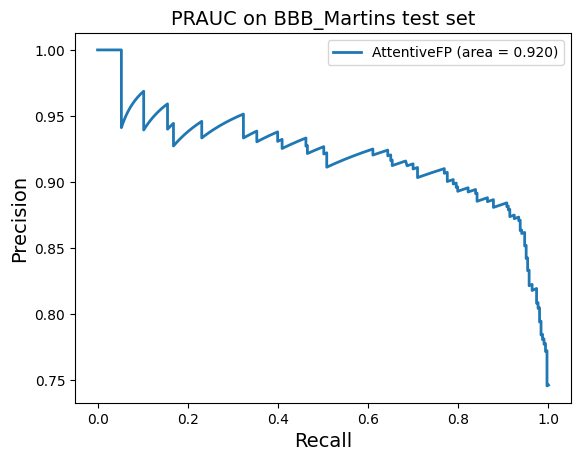


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.855  &0.532  &0.854  &1.000  &0.063  &0.921 &0.766 &0.233 &0.930


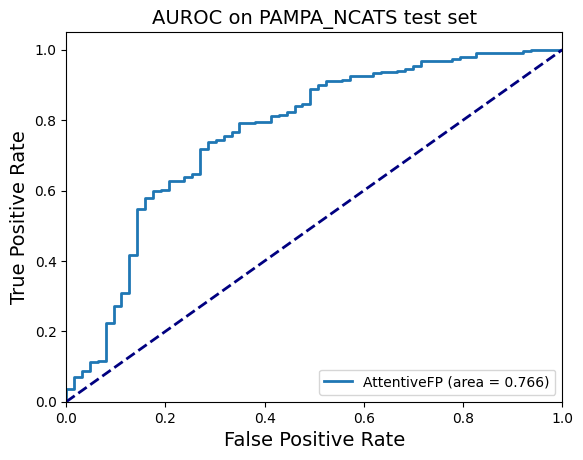

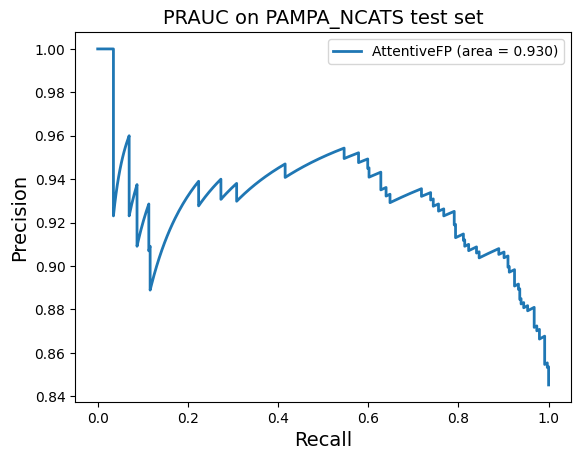


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.556  &0.510  &0.714  &0.656


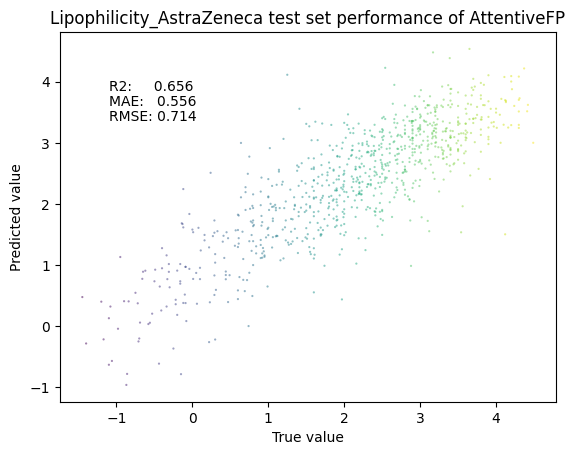


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&0.738  &1.084  &1.041  &0.800


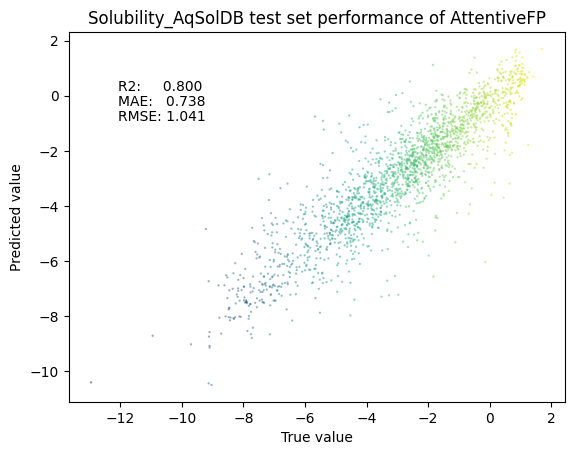


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.674  &0.674  &0.651  &0.748  &0.600  &0.696 &0.743 &0.352 &0.724


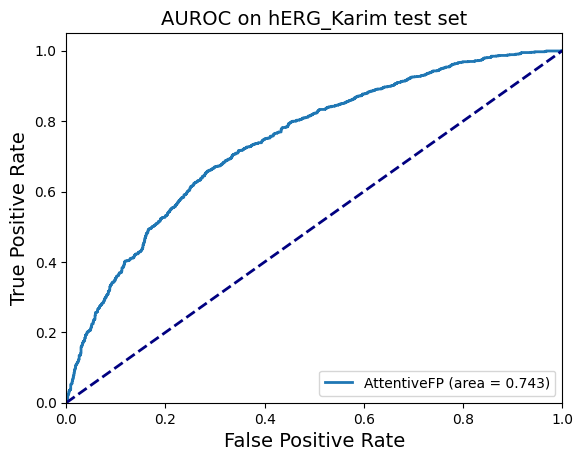

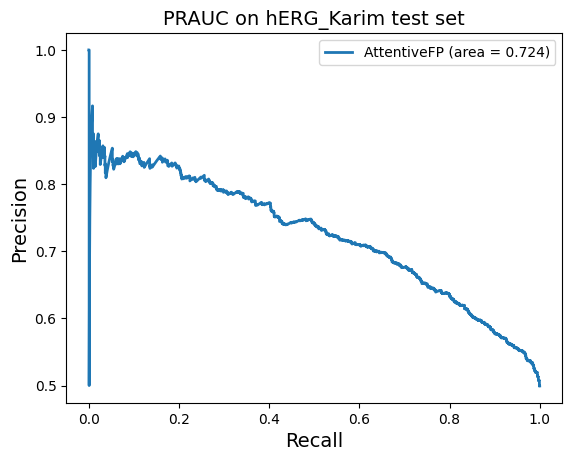


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.667  &0.656  &0.672  &0.767  &0.546  &0.716 &0.731 &0.321 &0.777


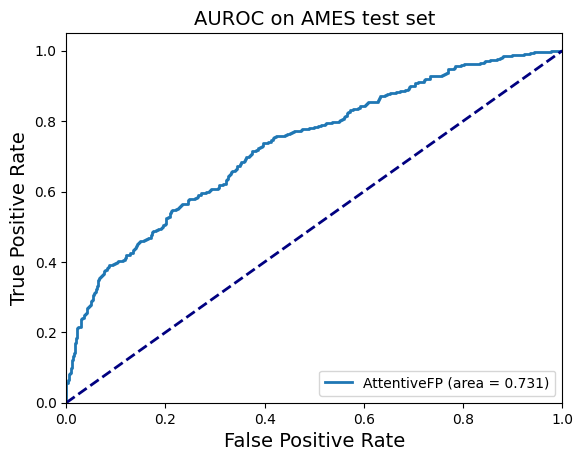

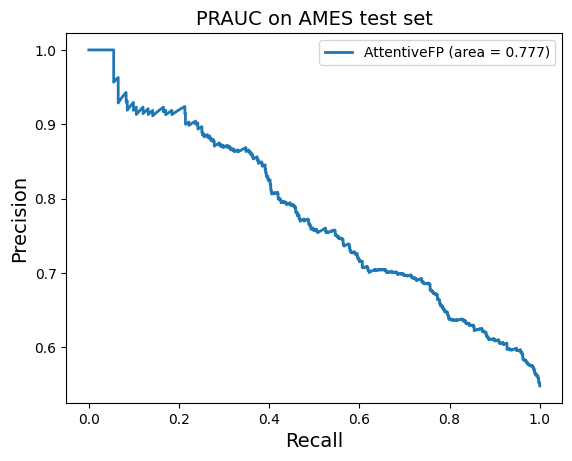


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.505  &0.452  &0.672  &0.494


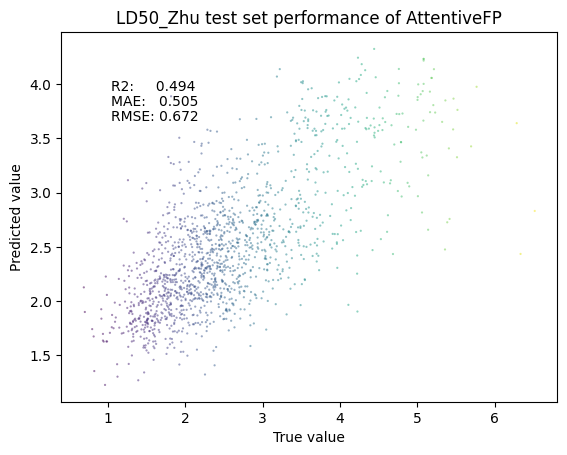


*************** Kp ***************
  MAE     MSE     RMSE    R2
&5.965  &141.923  &11.913  &0.249


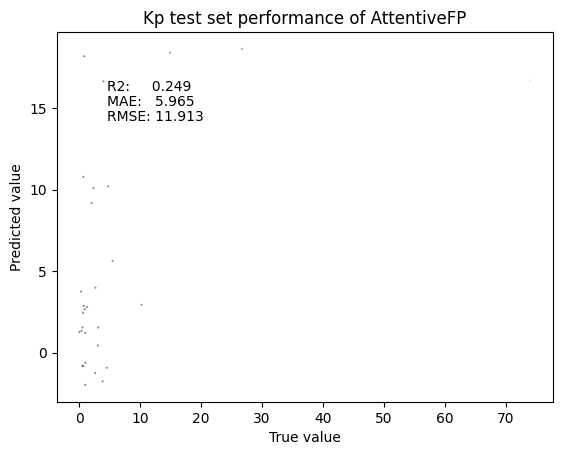



--> Train status saved at Kp+M5+AD4+T3/AttentiveFP_MT_0.yml
Finished evaluate test performance, outputs performance dict

Run # 1 for AttentiveFP MT	 | save dir:  Kp+M5+AD4+T3/AttentiveFP_MT_1 | 	cannot open Kp+M5+AD4+T3/AttentiveFP_MT_1.yml, retrain
Model type:  AttentiveFP | Model parameters:  3827119
Start training AttentiveFP...
Epoch:0 [Train] Loss: 0.446 | [Valid] Loss: 0.477	SAVE MODEL: loss: inf -> 0.477 | runtime: 0.345 ms
Epoch:1 [Train] Loss: 0.464 | [Valid] Loss: 0.021	SAVE MODEL: loss: 0.477 -> 0.021 | runtime: 0.348 ms
Epoch:2 [Train] Loss: 0.028 | [Valid] Loss: 0.016	SAVE MODEL: loss: 0.021 -> 0.016 | runtime: 0.345 ms
Epoch:3 [Train] Loss: 0.020 | [Valid] Loss: 0.015	SAVE MODEL: loss: 0.016 -> 0.015 | runtime: 0.345 ms
Epoch:4 [Train] Loss: 0.019 | [Valid] Loss: 0.016	EarlyStopping counter: 1 out of 30
Epoch:5 [Train] Loss: 0.017 | [Valid] Loss: 0.014	SAVE MODEL: loss: 0.015 -> 0.014 | runtime: 0.344 ms
Epoch:6 [Train] Loss: 0.016 | [Valid] Loss: 0.013	SAVE MODEL: los

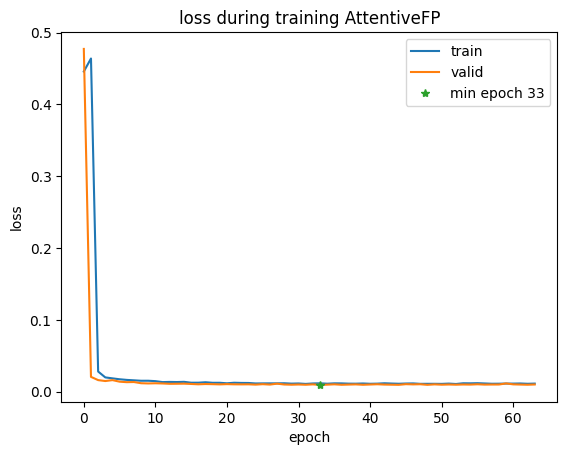

load pretrained model from  Kp+M5+AD4+T3/AttentiveFP_MT_1.pt
[Test] Loss: 0.116
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.724  &0.724  &0.692  &0.721  &0.728  &0.706 &0.790 &0.447 &0.712


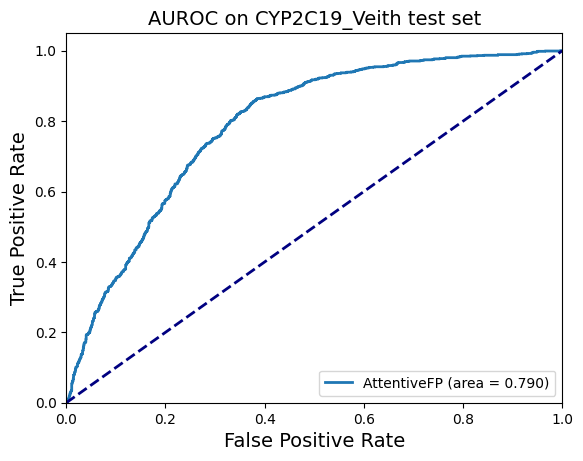

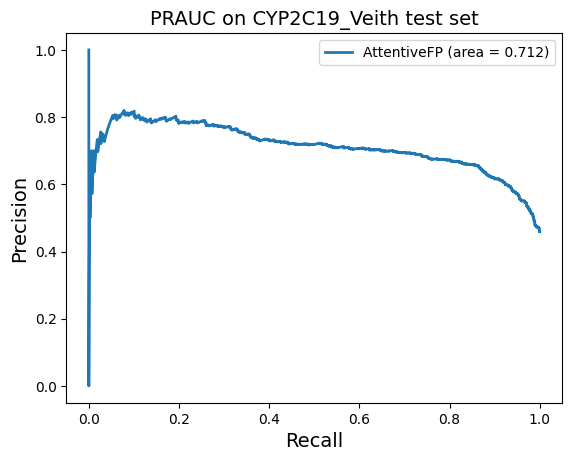


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.500  &  nan  &0.000  &1.000  &  nan &0.692 &  nan &0.315


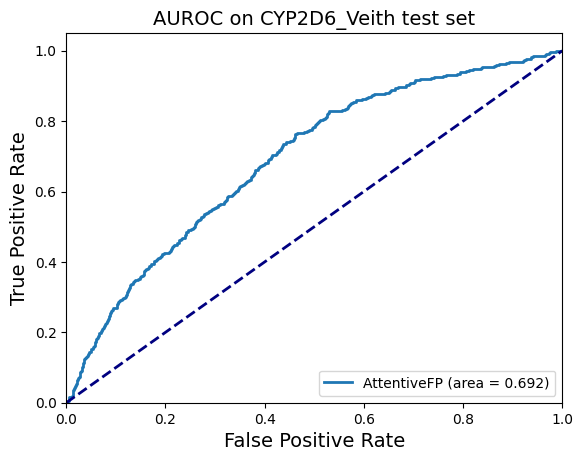

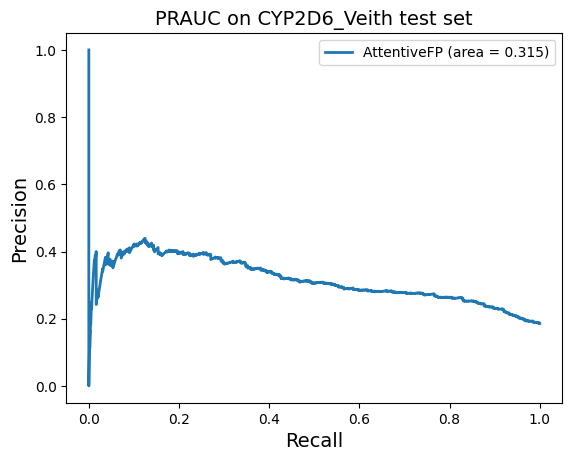


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.672  &0.651  &0.617  &0.535  &0.767  &0.573 &0.754 &0.311 &0.598


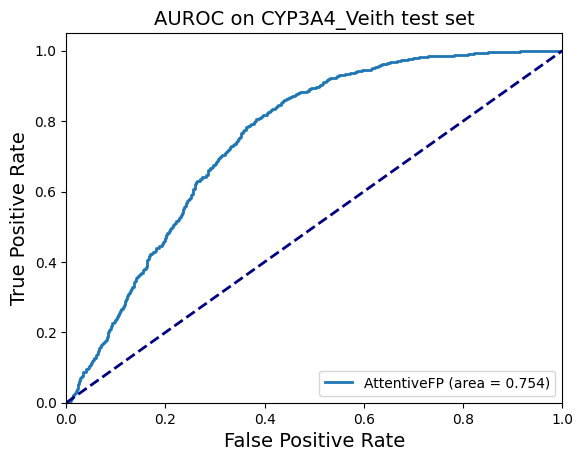

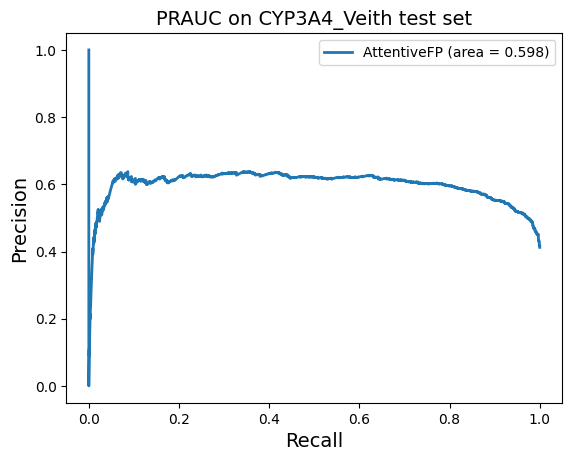


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.713  &0.714  &0.683  &0.731  &0.696  &0.706 &0.794 &0.427 &0.736


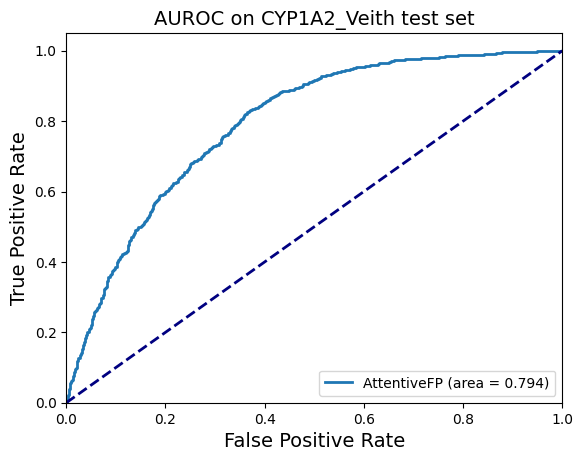

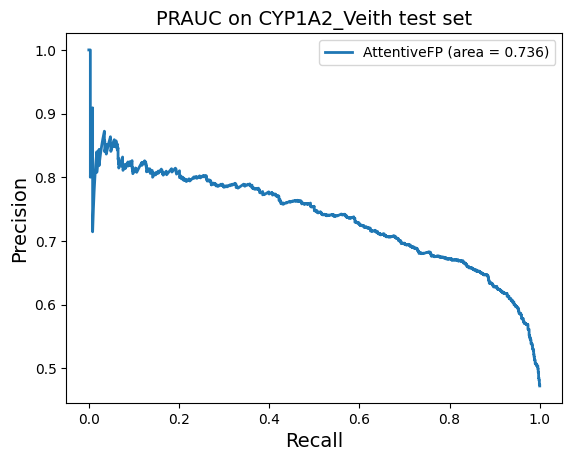


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.715  &0.612  &0.684  &0.293  &0.931  &0.410 &0.805 &0.300 &0.605


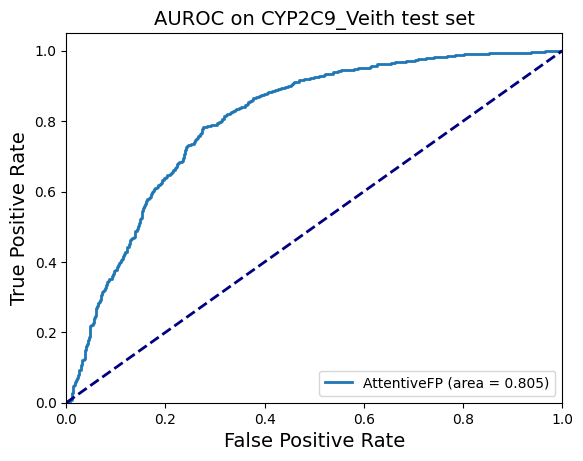

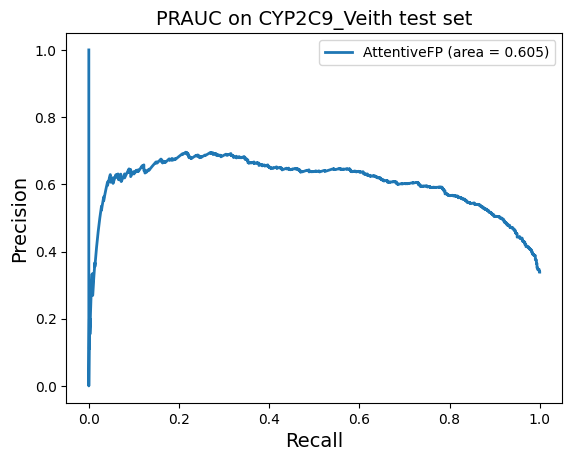


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.818  &0.663  &0.815  &0.977  &0.350  &0.889 &0.817 &0.462 &0.889


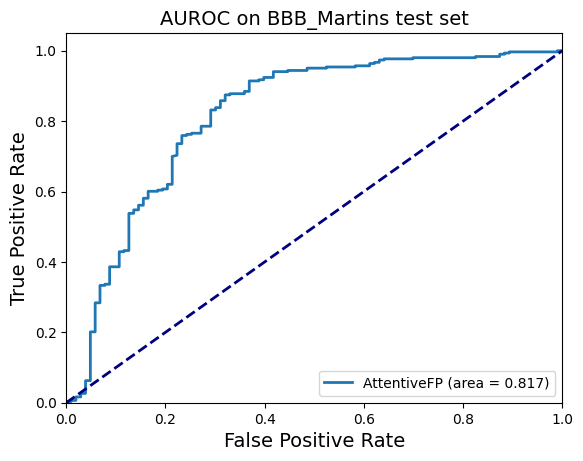

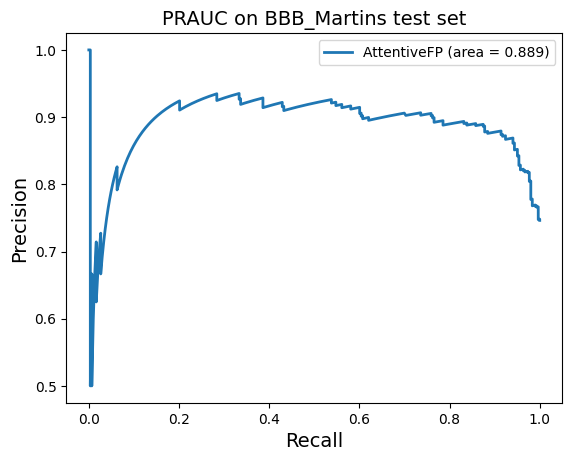


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.848  &0.508  &0.847  &1.000  &0.016  &0.917 &0.741 &0.116 &0.906


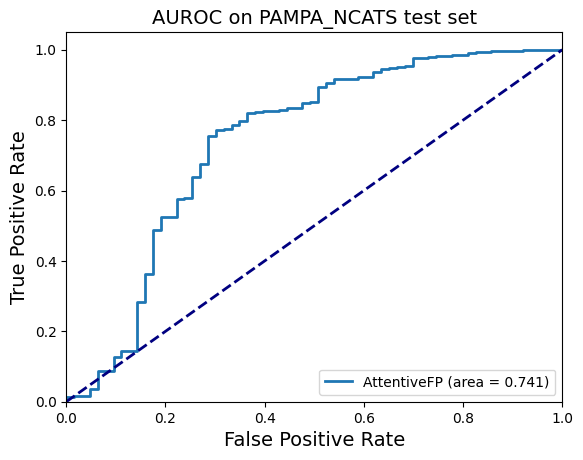

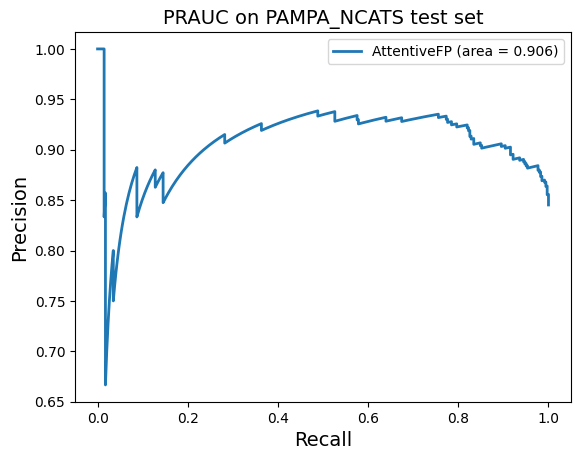


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.587  &0.542  &0.736  &0.634


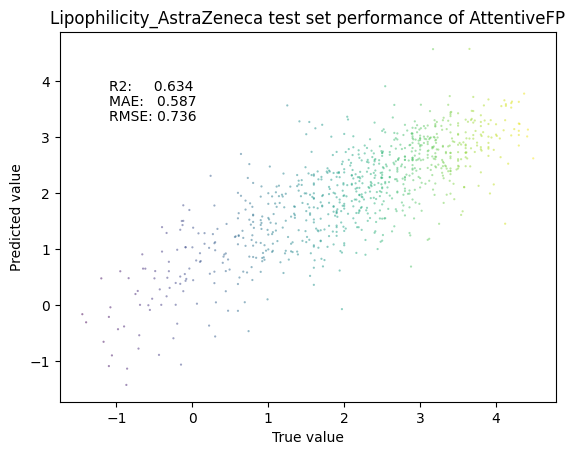


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&0.807  &1.183  &1.087  &0.782


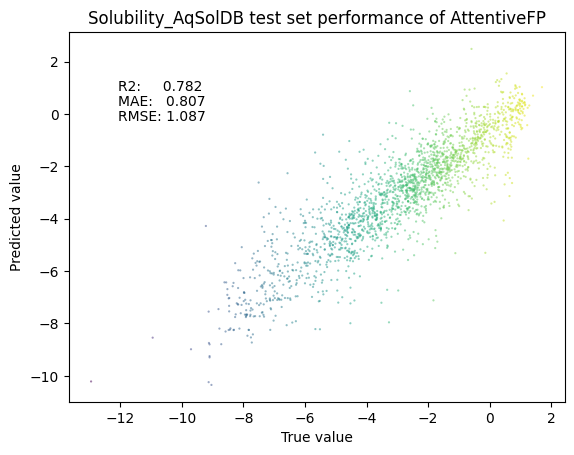


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.658  &0.658  &0.638  &0.727  &0.589  &0.680 &0.713 &0.319 &0.678


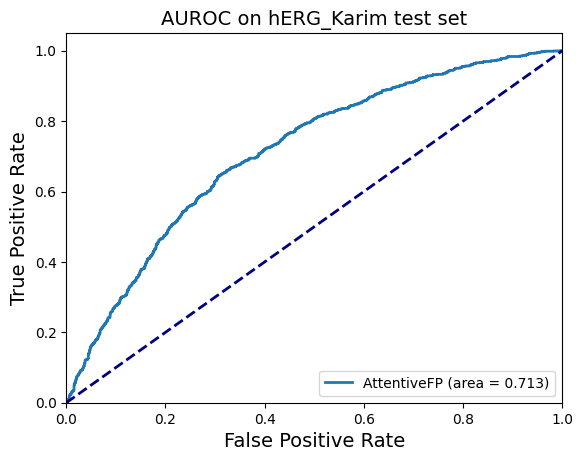

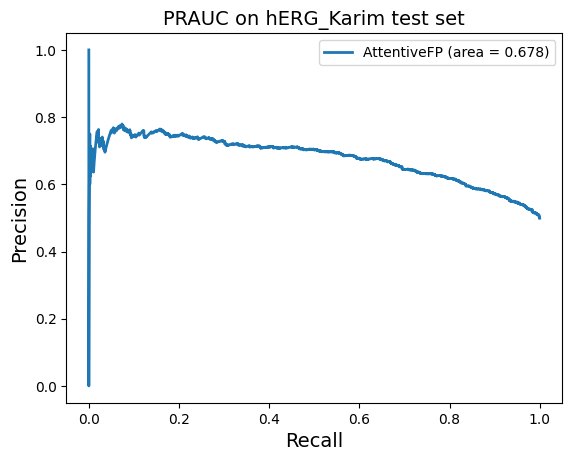


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.598  &0.573  &0.595  &0.836  &0.310  &0.695 &0.630 &0.172 &0.663


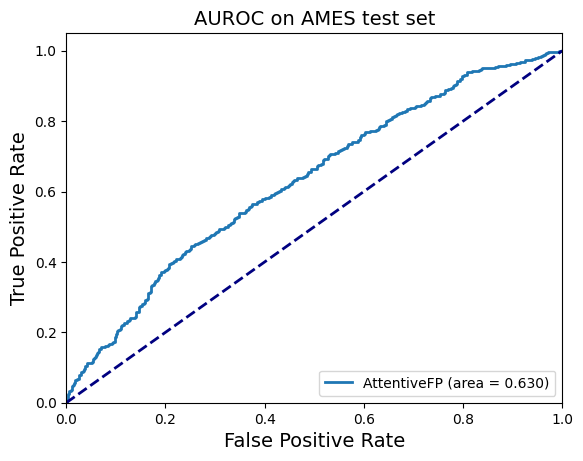

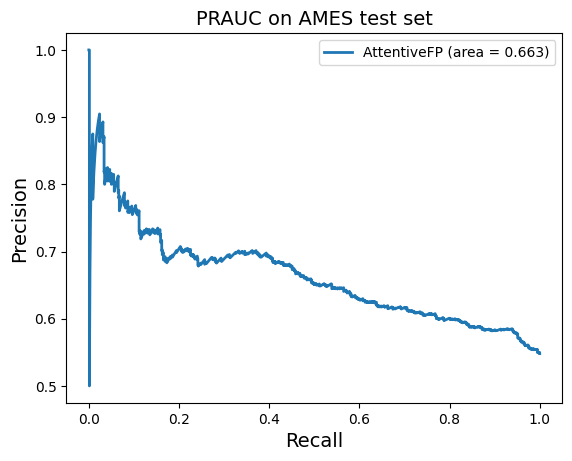


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.530  &0.496  &0.704  &0.445


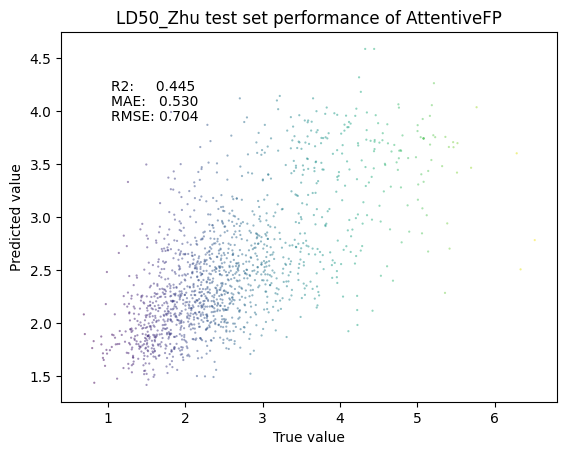


*************** Kp ***************
  MAE     MSE     RMSE    R2
&6.005  &137.067  &11.708  &0.274


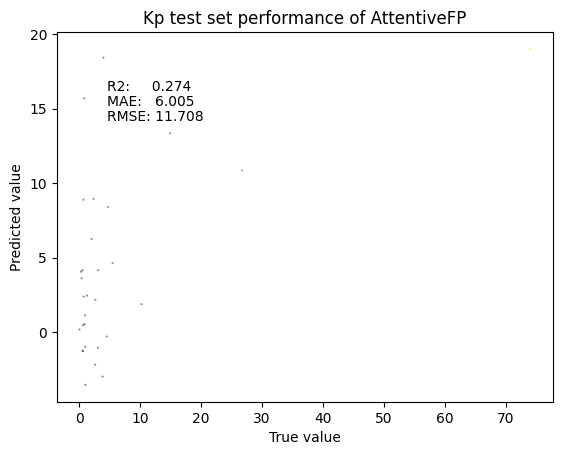



--> Train status saved at Kp+M5+AD4+T3/AttentiveFP_MT_1.yml
Finished evaluate test performance, outputs performance dict

Run # 2 for AttentiveFP MT	 | save dir:  Kp+M5+AD4+T3/AttentiveFP_MT_2 | 	cannot open Kp+M5+AD4+T3/AttentiveFP_MT_2.yml, retrain
Model type:  AttentiveFP | Model parameters:  3827119
Start training AttentiveFP...
Epoch:0 [Train] Loss: 0.450 | [Valid] Loss: 0.477	SAVE MODEL: loss: inf -> 0.477 | runtime: 0.345 ms
Epoch:1 [Train] Loss: 0.470 | [Valid] Loss: 0.020	SAVE MODEL: loss: 0.477 -> 0.020 | runtime: 0.347 ms
Epoch:2 [Train] Loss: 0.029 | [Valid] Loss: 0.018	SAVE MODEL: loss: 0.020 -> 0.018 | runtime: 0.346 ms
Epoch:3 [Train] Loss: 0.020 | [Valid] Loss: 0.015	SAVE MODEL: loss: 0.018 -> 0.015 | runtime: 0.343 ms
Epoch:4 [Train] Loss: 0.019 | [Valid] Loss: 0.014	SAVE MODEL: loss: 0.015 -> 0.014 | runtime: 0.343 ms
Epoch:5 [Train] Loss: 0.018 | [Valid] Loss: 0.016	EarlyStopping counter: 1 out of 30
Epoch:6 [Train] Loss: 0.017 | [Valid] Loss: 0.013	SAVE MODEL: los

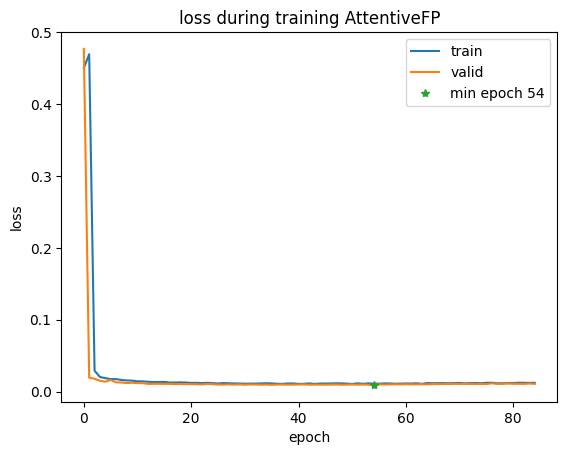

load pretrained model from  Kp+M5+AD4+T3/AttentiveFP_MT_2.pt
[Test] Loss: 0.103
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.748  &0.751  &0.698  &0.794  &0.709  &0.743 &0.814 &0.501 &0.745


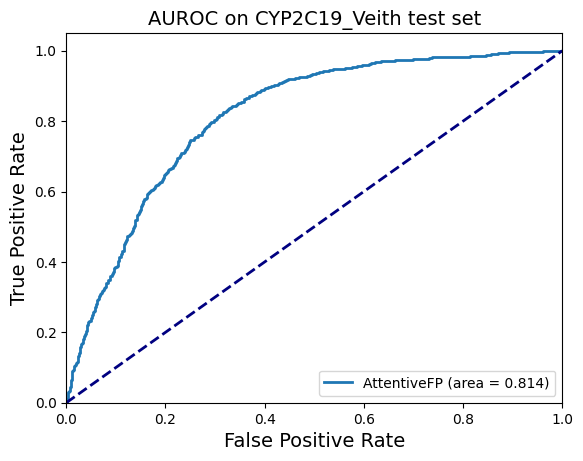

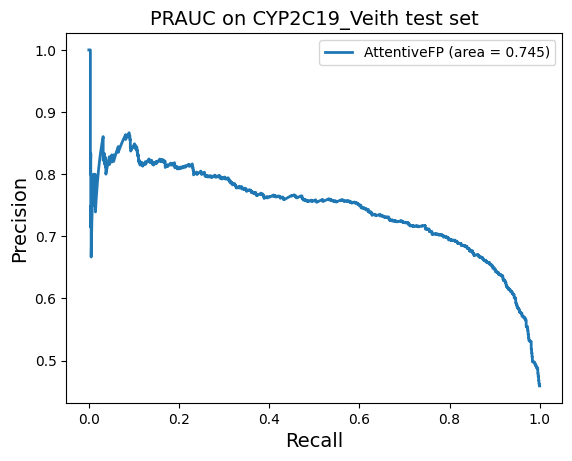


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.833  &0.565  &0.798  &0.137  &0.992  &0.234 &0.785 &0.286 &0.525


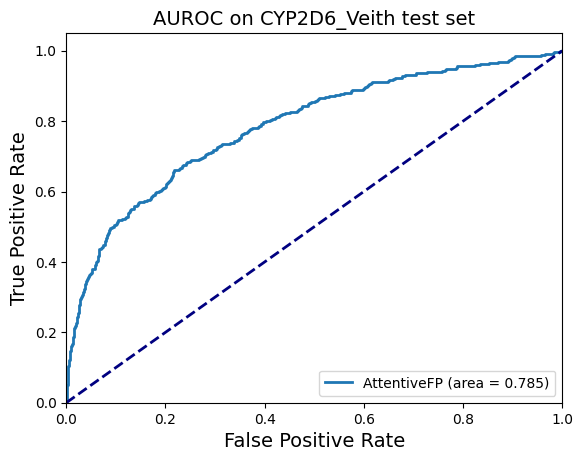

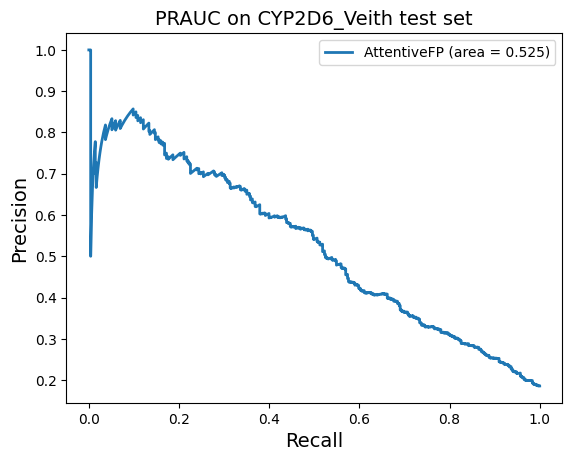


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.710  &0.703  &0.645  &0.660  &0.745  &0.652 &0.784 &0.404 &0.651


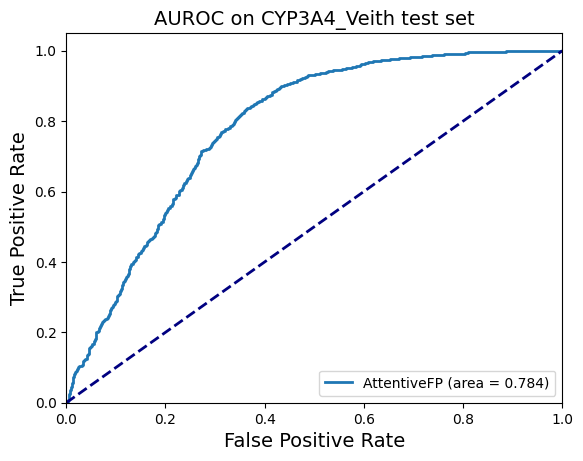

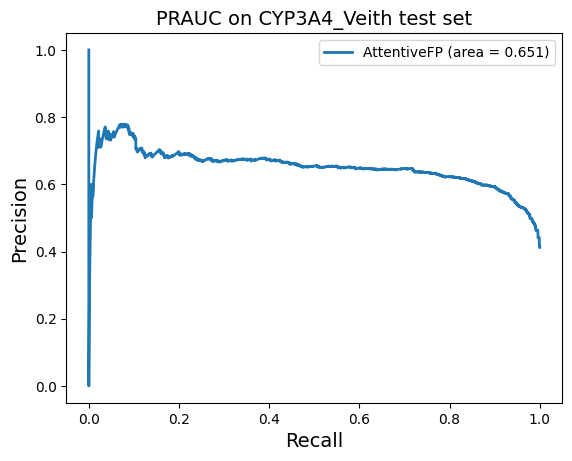


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.813  &0.803  &0.801  &0.825  &0.802 &0.889 &0.626 &0.869


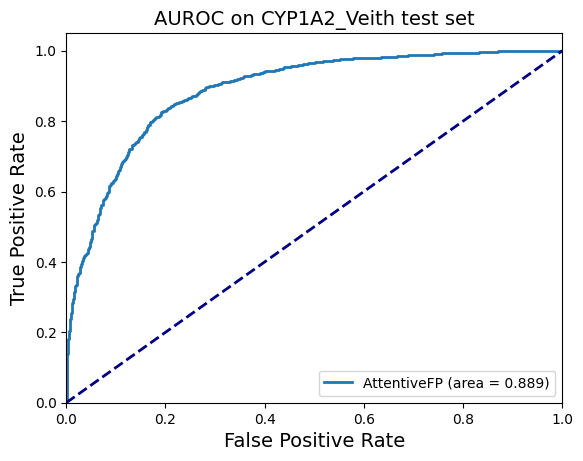

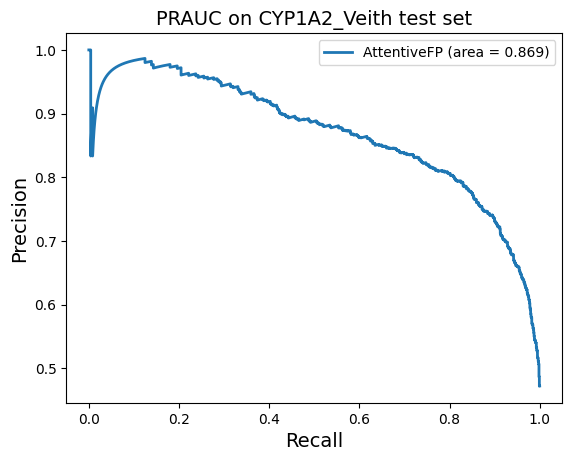


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.778  &0.745  &0.684  &0.641  &0.848  &0.662 &0.832 &0.497 &0.664


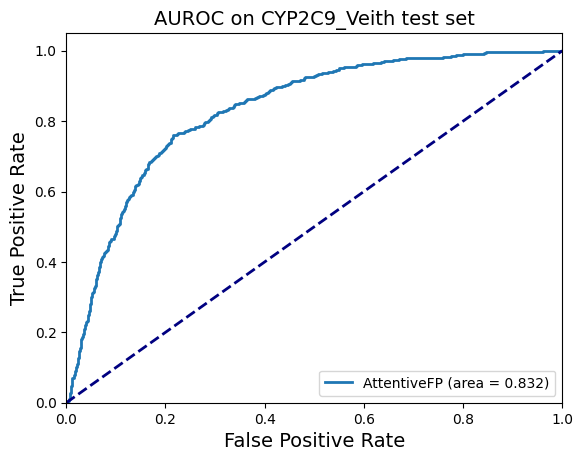

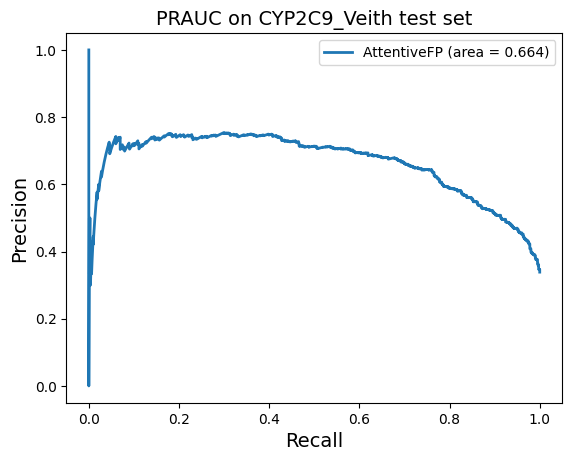


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.830  &0.703  &0.836  &0.960  &0.447  &0.894 &0.854 &0.506 &0.929


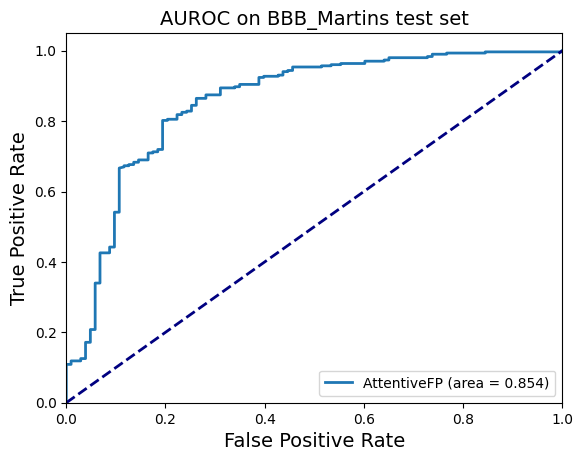

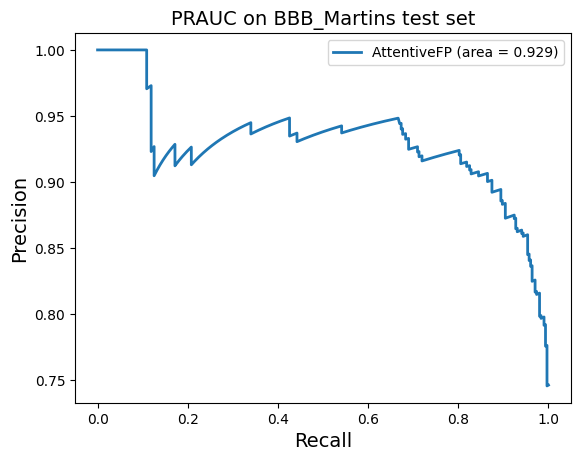


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.860  &0.574  &0.865  &0.988  &0.159  &0.923 &0.767 &0.292 &0.929


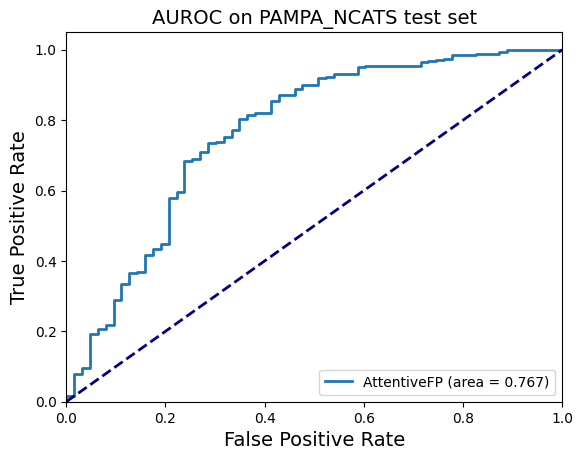

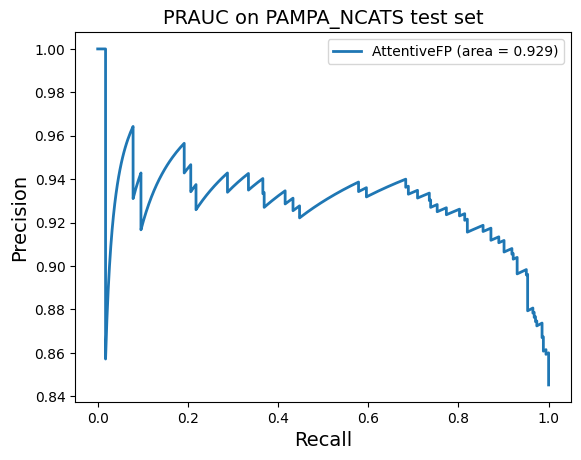


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.521  &0.455  &0.675  &0.693


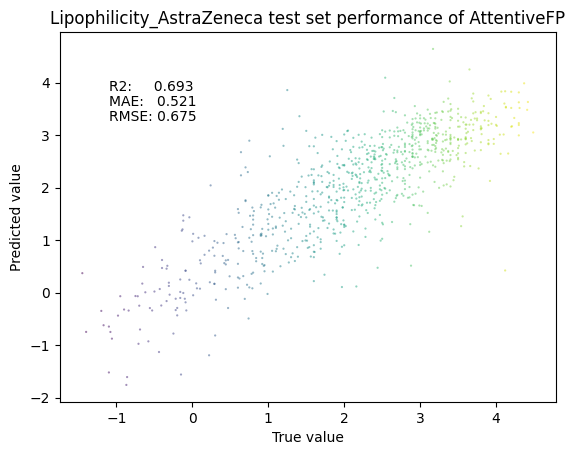


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&0.741  &1.100  &1.049  &0.797


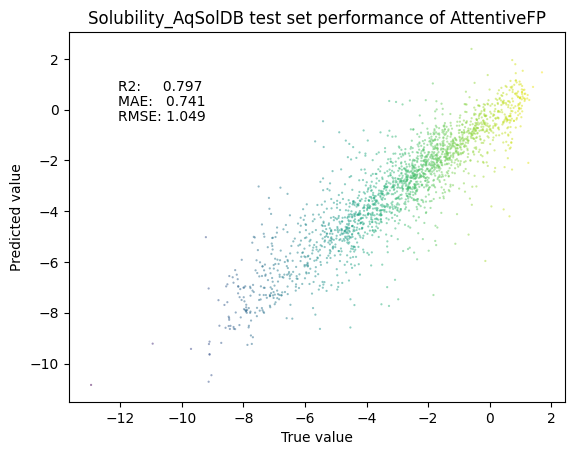


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.690  &0.690  &0.676  &0.728  &0.652  &0.701 &0.758 &0.381 &0.751


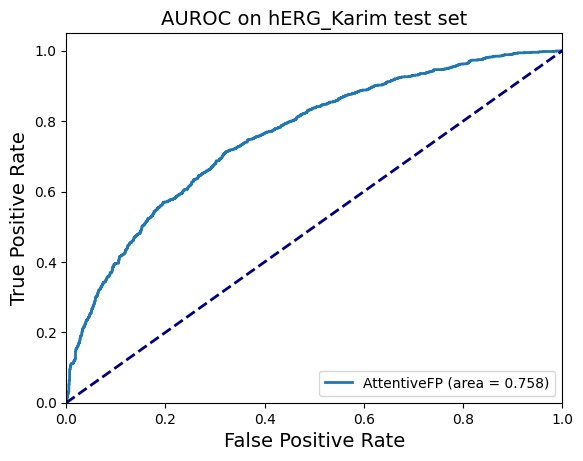

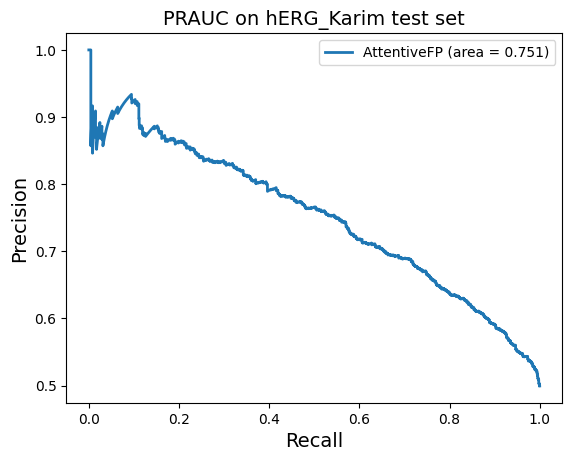


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.664  &0.657  &0.681  &0.729  &0.585  &0.704 &0.744 &0.318 &0.783


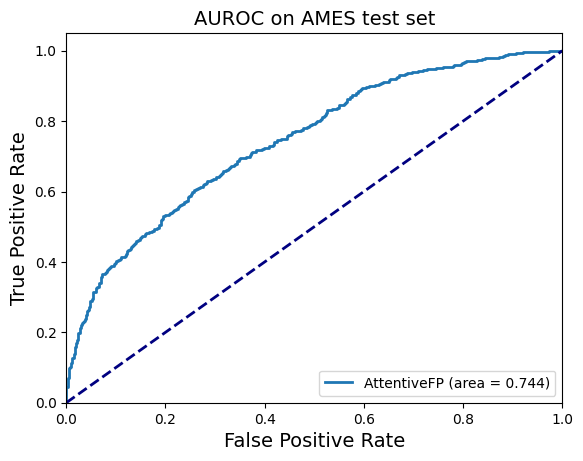

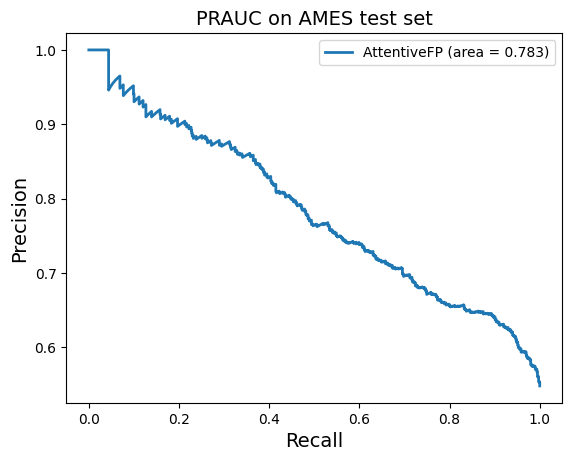


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.484  &0.420  &0.648  &0.530


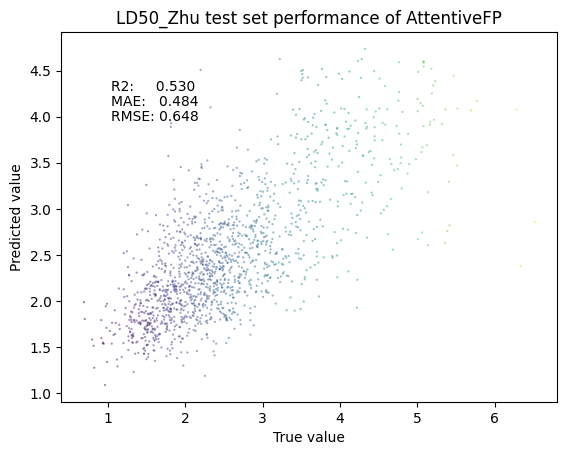


*************** Kp ***************
  MAE     MSE     RMSE    R2
&5.864  &117.310  &10.831  &0.379


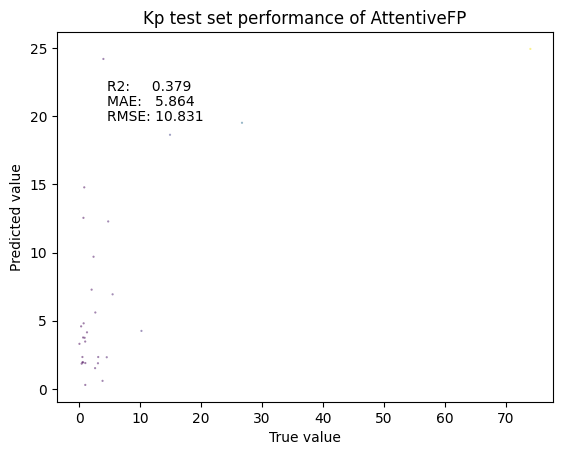



--> Train status saved at Kp+M5+AD4+T3/AttentiveFP_MT_2.yml
Finished evaluate test performance, outputs performance dict
repeated num # 3 idx 2 has the lowest loss
******************** CYP2C19_Veith ******************** 
	|       acc      |       w_acc      |       prec      |       recall      |       sp      |       f1      |       auc      |       mcc      |       ap      
	&0.734$\pm$0.010  &0.737$\pm$0.011  &0.686$\pm$0.013  &0.776$\pm$0.040  &0.698$\pm$0.030  &0.727$\pm$0.016  &0.802$\pm$0.010  &0.473$\pm$0.022  &0.730$\pm$0.014  
 idx 2: &0.748            &0.751            &0.698            &0.794            &0.709            &0.743            &0.814            &0.501            &0.745            

******************** CYP2D6_Veith ******************** 
	|       acc      |       w_acc      |       prec      |       recall      |       sp      |       f1      |       auc      |       mcc      |       ap      
	&0.823$\pm$0.008  &0.532$\pm$0.026  &nan$\pm$nan  &0.067$\pm$0.056  

Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...



Run # 0 for GIN MT	 | save dir:  Kp+M5+AD4+T3/GIN_MT_0 | 	cannot open Kp+M5+AD4+T3/GIN_MT_0.yml, retrain
collect data for:  ['CYP2C19_Veith', 'CYP2D6_Veith', 'CYP3A4_Veith', 'CYP1A2_Veith', 'CYP2C9_Veith', 'BBB_Martins', 'PAMPA_NCATS', 'Lipophilicity_AstraZeneca', 'Solubility_AqSolDB', 'hERG_Karim', 'AMES', 'LD50_Zhu', 'Kp']


Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!



START scaling train valid test data set: 
---> scale Lipophilicity_AstraZeneca | min -1.500 | max 4.500

START scaling train valid test data set: 
---> scale Solubility_AqSolDB | min -13.172 | max 2.138

START scaling train valid test data set: 
---> scale LD50_Zhu | min -0.343 | max 10.207

START scaling train valid test data set: 
---> scale Kp | min 0.014 | max 135.460
Finished scaling process | dict_scale: {'Lipophilicity_AstraZeneca': [-1.5, 4.5], 'Solubility_AqSolDB': [-13.1719, 2.1376816201], 'LD50_Zhu': [-0.3429999999999999, 10.207], 'Kp': [0.0139545499259114, 135.4599736770797]} 

---> loader for ['CYP2C19_Veith', 'CYP2D6_Veith', 'CYP3A4_Veith', 'CYP1A2_Veith', 'CYP2C9_Veith', 'BBB_Martins', 'PAMPA_NCATS', 'Lipophilicity_AstraZeneca', 'Solubility_AqSolDB', 'hERG_Karim', 'AMES', 'LD50_Zhu', 'Kp']
--> preparing data loader for model type  GIN
--> preparing data loader for model type  GIN
--> preparing data loader for model type  GIN


gin_supervised_contextpred_pre_trained.pth: 100%|██████████| 7.45M/7.45M [00:01<00:00, 5.90MB/s]


Pretrained model loaded
Model type:  GIN | Model parameters:  1978937
Start training GIN...
Epoch:0 [Train] Loss: 0.495 | [Valid] Loss: 0.542	SAVE MODEL: loss: inf -> 0.542 | runtime: 2.214 ms
Epoch:1 [Train] Loss: 0.527 | [Valid] Loss: 0.032	SAVE MODEL: loss: 0.542 -> 0.032 | runtime: 2.200 ms
Epoch:2 [Train] Loss: 0.028 | [Valid] Loss: 0.016	SAVE MODEL: loss: 0.032 -> 0.016 | runtime: 2.201 ms
Epoch:3 [Train] Loss: 0.020 | [Valid] Loss: 0.012	SAVE MODEL: loss: 0.016 -> 0.012 | runtime: 2.224 ms
Epoch:4 [Train] Loss: 0.018 | [Valid] Loss: 0.011	SAVE MODEL: loss: 0.012 -> 0.011 | runtime: 2.206 ms
Epoch:5 [Train] Loss: 0.017 | [Valid] Loss: 0.010	SAVE MODEL: loss: 0.011 -> 0.010 | runtime: 2.198 ms
Epoch:6 [Train] Loss: 0.015 | [Valid] Loss: 0.009	SAVE MODEL: loss: 0.010 -> 0.009 | runtime: 2.200 ms
Epoch:7 [Train] Loss: 0.015 | [Valid] Loss: 0.009	SAVE MODEL: loss: 0.009 -> 0.009 | runtime: 2.225 ms
Epoch:8 [Train] Loss: 0.014 | [Valid] Loss: 0.009	EarlyStopping counter: 1 out of 30
E

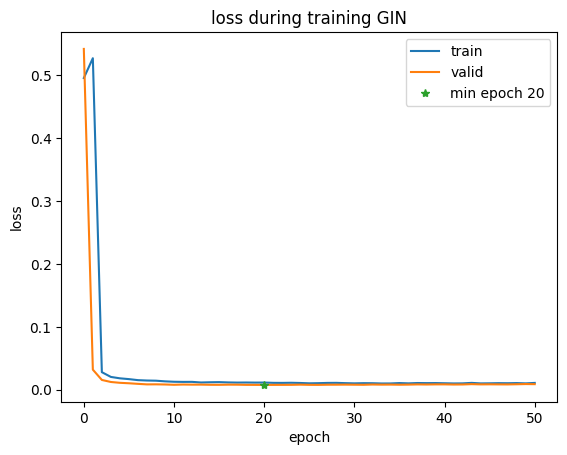

load pretrained model from  Kp+M5+AD4+T3/GIN_MT_0.pt
[Test] Loss: 0.128
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.600  &0.591  &0.577  &0.481  &0.701  &0.524 &0.673 &0.186 &0.559


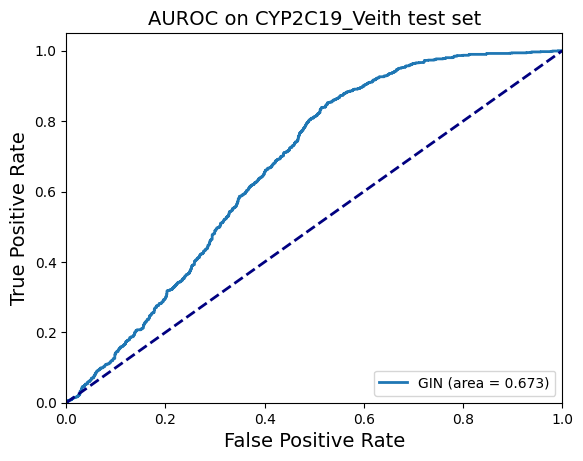

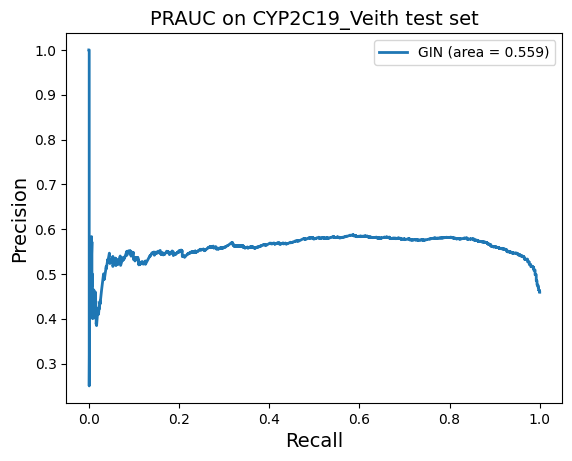


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.500  &  nan  &0.000  &1.000  &  nan &0.551 &  nan &0.204


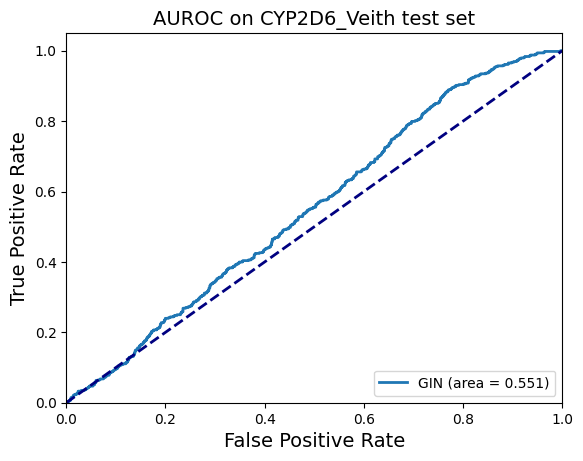

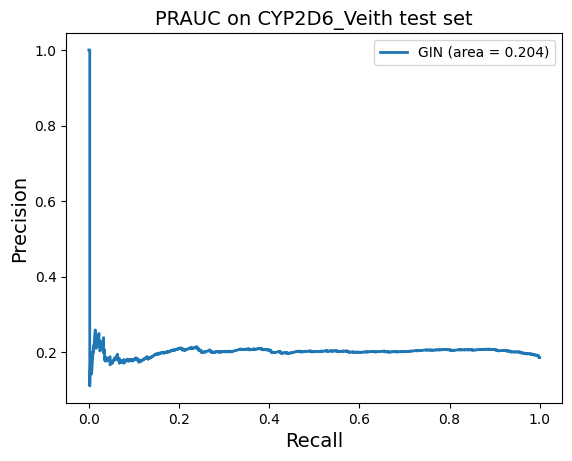


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.588  &0.501  &0.571  &0.004  &0.998  &0.008 &0.607 &0.017 &0.461


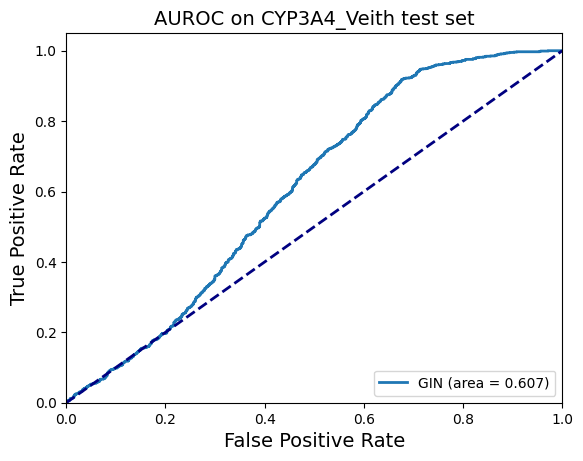

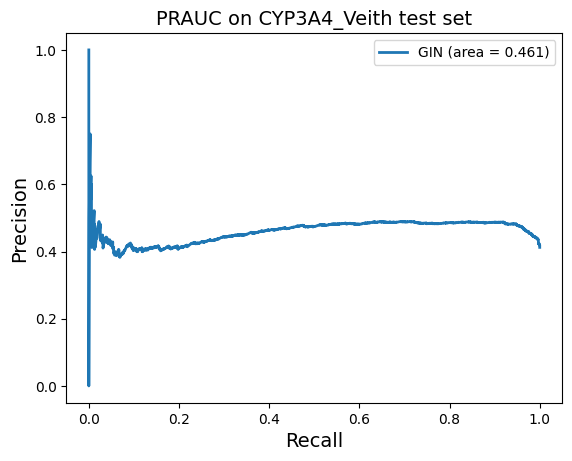


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.528  &0.500  &  nan  &0.000  &1.000  &  nan &0.713 &  nan &0.621


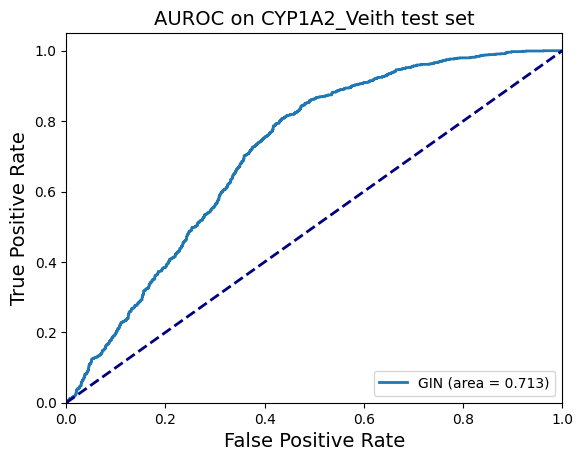

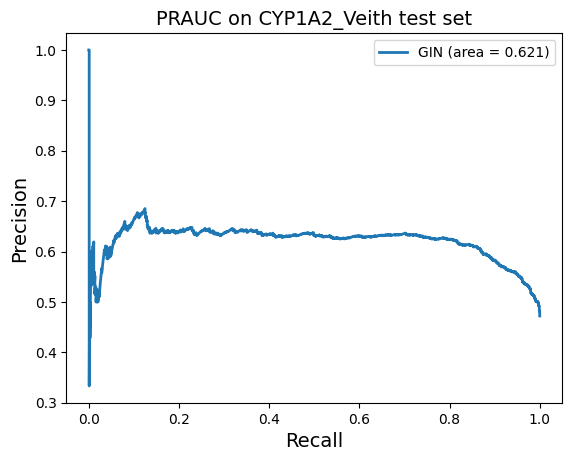


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.661  &0.500  &  nan  &0.000  &1.000  &  nan &0.793 &  nan &0.587


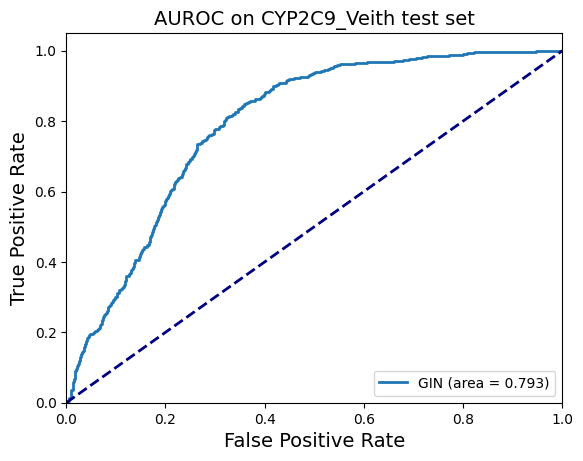

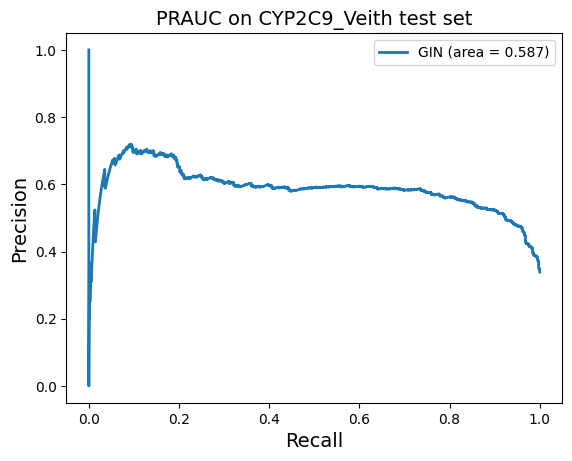


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.746  &0.500  &0.746  &1.000  &0.000  &0.855 &0.464 &  nan &0.728


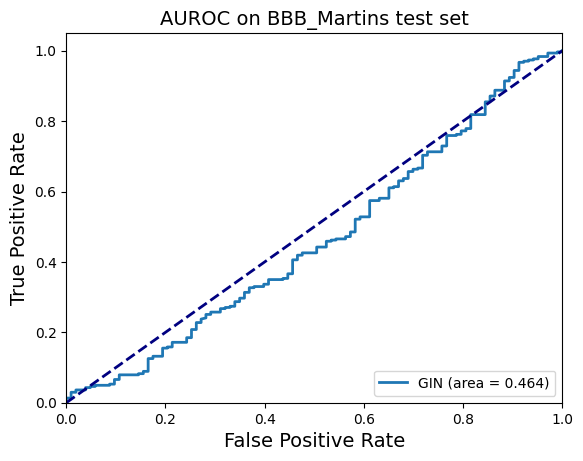

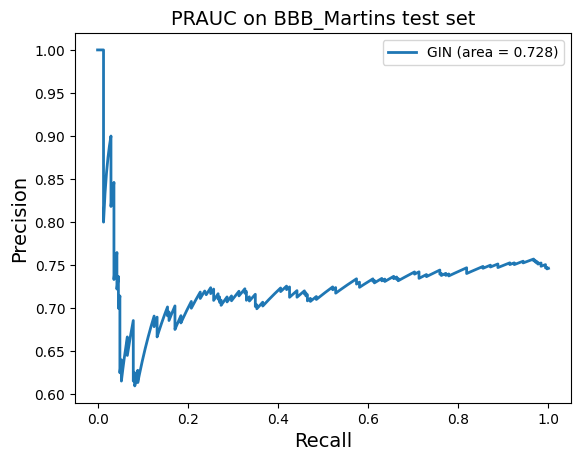


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.705  &0.670  &0.912  &0.721  &0.619  &0.805 &0.701 &0.261 &0.890


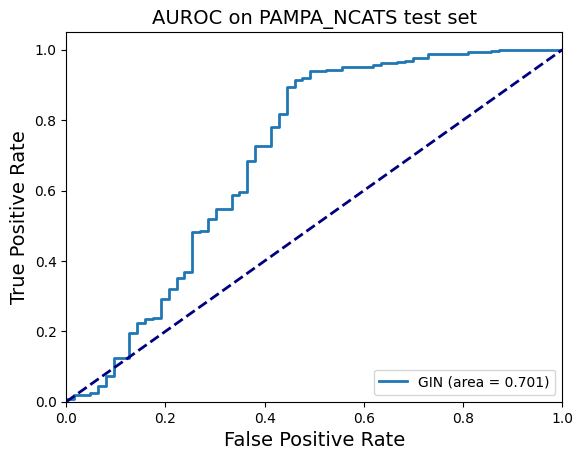

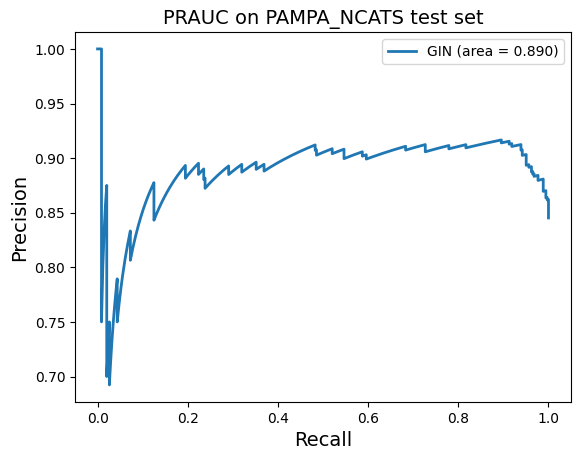


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.648  &0.656  &0.810  &0.557


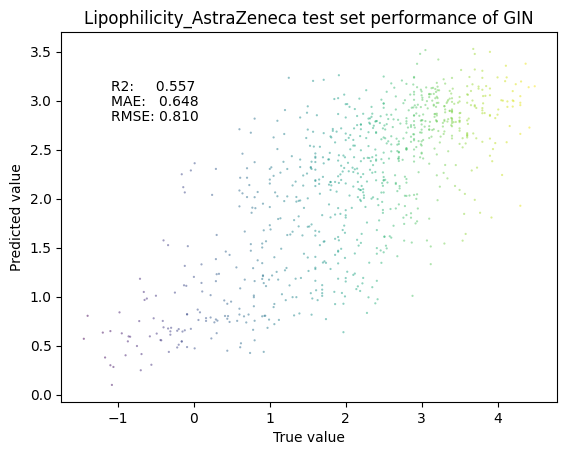


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&1.106  &2.321  &1.524  &0.572


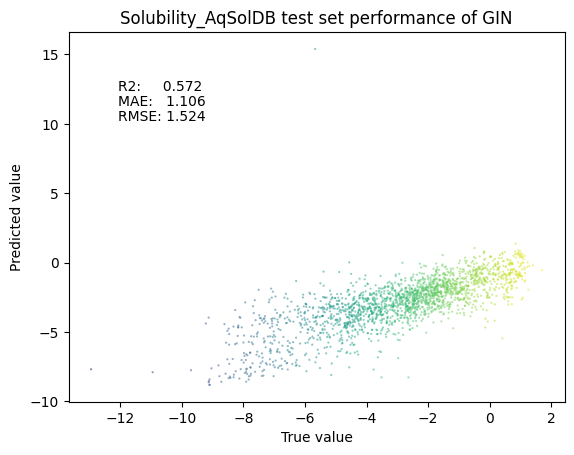


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.501  &0.500  &  nan  &0.000  &1.000  &  nan &0.571 &  nan &0.543


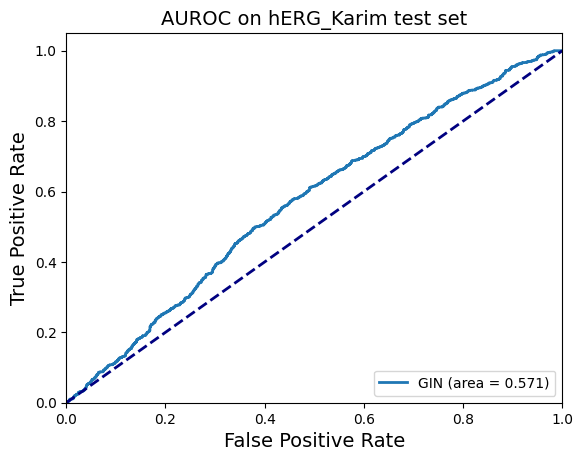

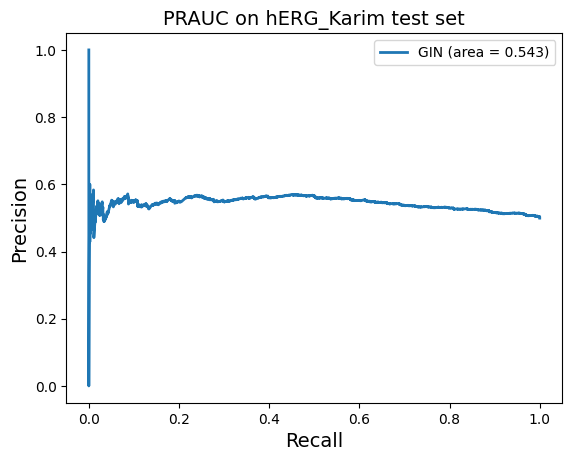


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.472  &0.515  &0.693  &0.065  &0.965  &0.119 &0.619 &0.068 &0.634


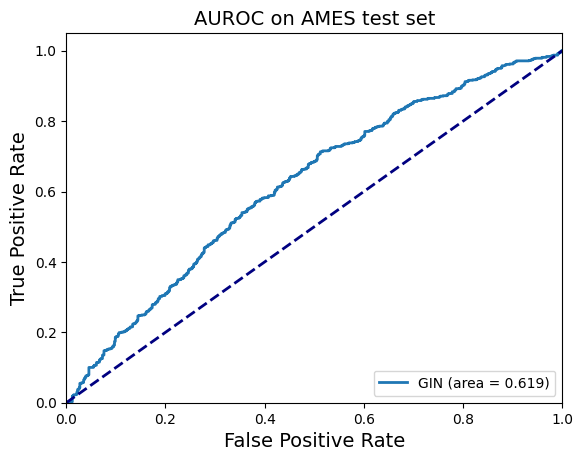

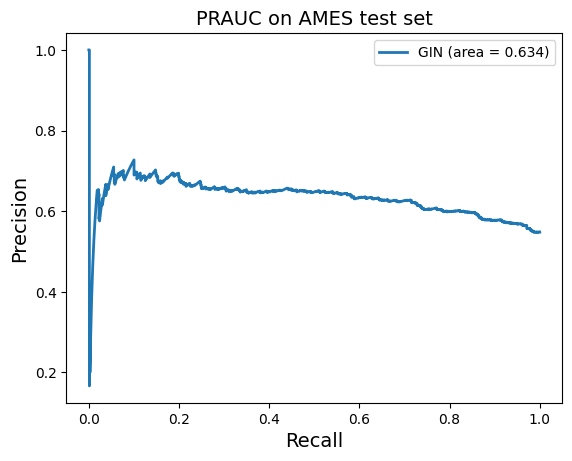


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.569  &0.554  &0.744  &0.380


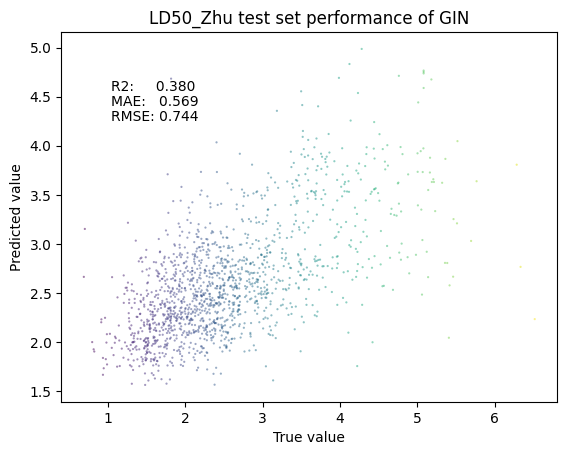


*************** Kp ***************
  MAE     MSE     RMSE    R2
&8.024  &167.551  &12.944  &0.113


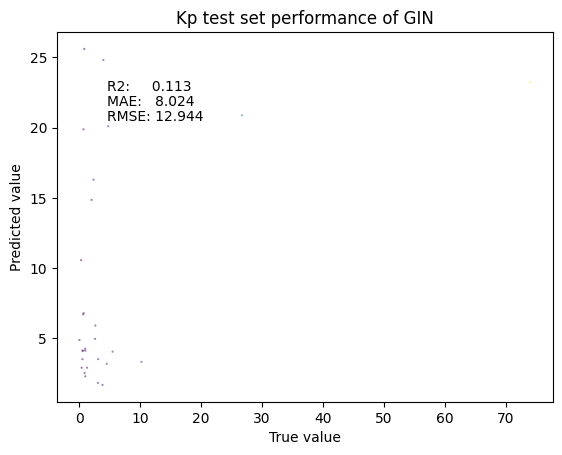



--> Train status saved at Kp+M5+AD4+T3/GIN_MT_0.yml
Finished evaluate test performance, outputs performance dict

Run # 1 for GIN MT	 | save dir:  Kp+M5+AD4+T3/GIN_MT_1 | 	cannot open Kp+M5+AD4+T3/GIN_MT_1.yml, retrain


gin_supervised_contextpred_pre_trained.pth: 100%|██████████| 7.45M/7.45M [00:01<00:00, 6.11MB/s]


Pretrained model loaded
Model type:  GIN | Model parameters:  1978937
Start training GIN...
Epoch:0 [Train] Loss: 0.521 | [Valid] Loss: 0.517	SAVE MODEL: loss: inf -> 0.517 | runtime: 2.215 ms
Epoch:1 [Train] Loss: 0.516 | [Valid] Loss: 0.021	SAVE MODEL: loss: 0.517 -> 0.021 | runtime: 2.219 ms
Epoch:2 [Train] Loss: 0.032 | [Valid] Loss: 0.015	SAVE MODEL: loss: 0.021 -> 0.015 | runtime: 2.217 ms
Epoch:3 [Train] Loss: 0.022 | [Valid] Loss: 0.013	SAVE MODEL: loss: 0.015 -> 0.013 | runtime: 2.220 ms
Epoch:4 [Train] Loss: 0.020 | [Valid] Loss: 0.012	SAVE MODEL: loss: 0.013 -> 0.012 | runtime: 2.212 ms
Epoch:5 [Train] Loss: 0.018 | [Valid] Loss: 0.010	SAVE MODEL: loss: 0.012 -> 0.010 | runtime: 2.216 ms
Epoch:6 [Train] Loss: 0.016 | [Valid] Loss: 0.010	SAVE MODEL: loss: 0.010 -> 0.010 | runtime: 2.219 ms
Epoch:7 [Train] Loss: 0.016 | [Valid] Loss: 0.009	SAVE MODEL: loss: 0.010 -> 0.009 | runtime: 2.206 ms
Epoch:8 [Train] Loss: 0.015 | [Valid] Loss: 0.009	EarlyStopping counter: 1 out of 30
E

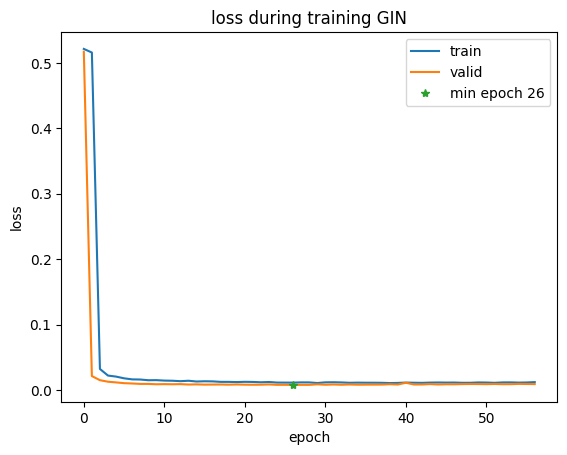

load pretrained model from  Kp+M5+AD4+T3/GIN_MT_1.pt
[Test] Loss: 0.132
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.687  &0.693  &0.628  &0.777  &0.609  &0.695 &0.744 &0.389 &0.660


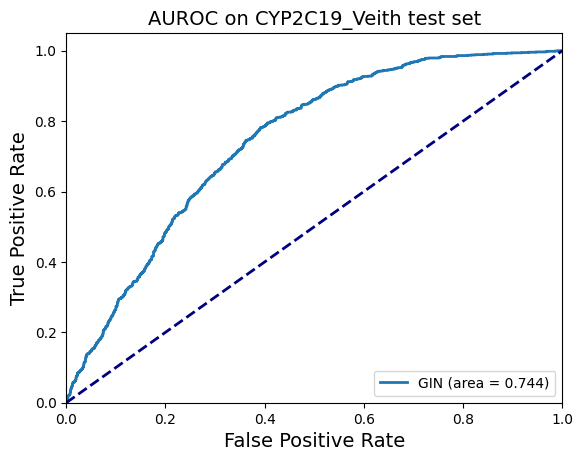

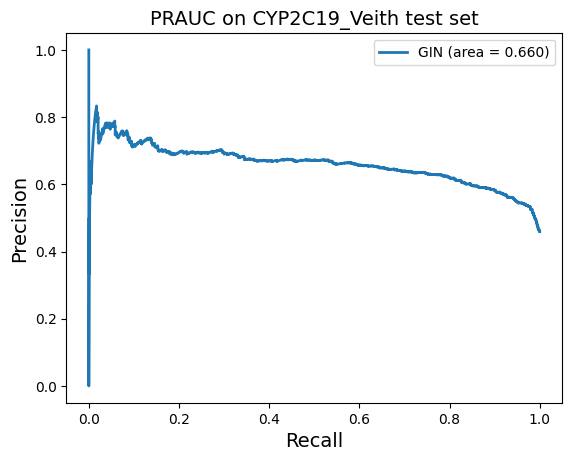


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.500  &  nan  &0.000  &1.000  &  nan &0.400 &  nan &0.147


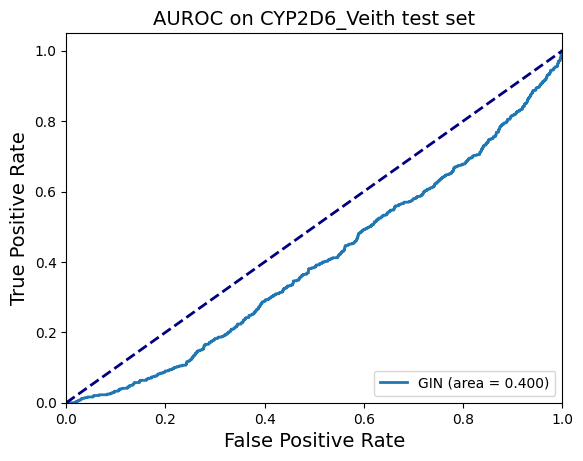

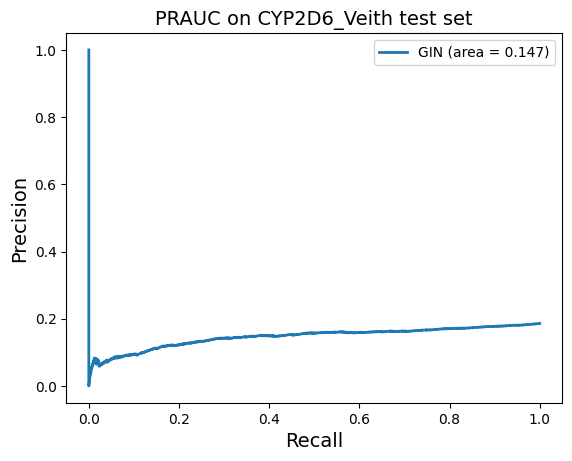


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.588  &0.500  &  nan  &0.000  &1.000  &  nan &0.649 &  nan &0.501


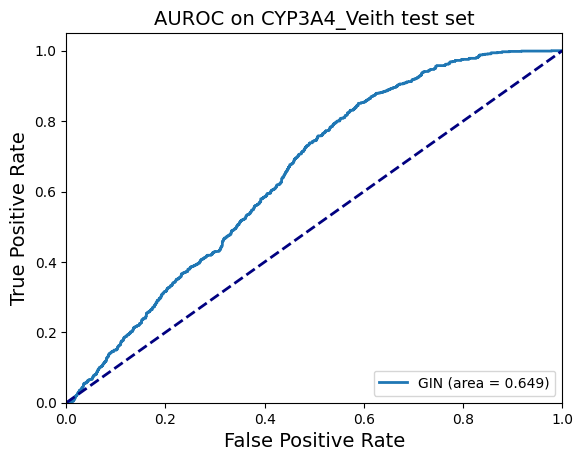

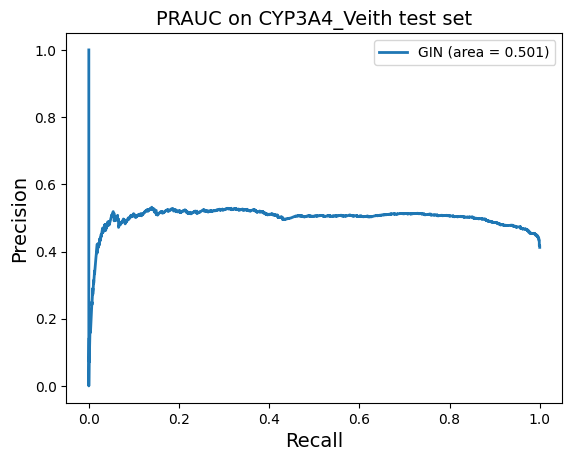


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.528  &0.500  &  nan  &0.000  &1.000  &  nan &0.268 &  nan &0.343


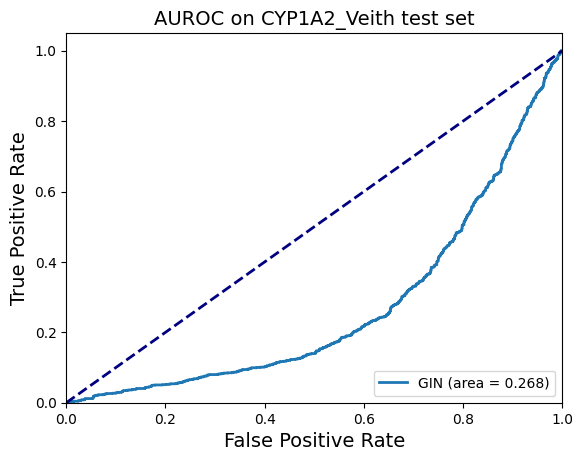

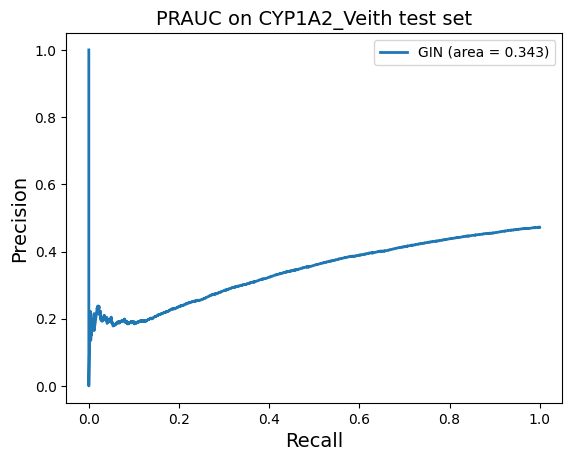


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.661  &0.500  &  nan  &0.000  &1.000  &  nan &0.310 &  nan &0.243


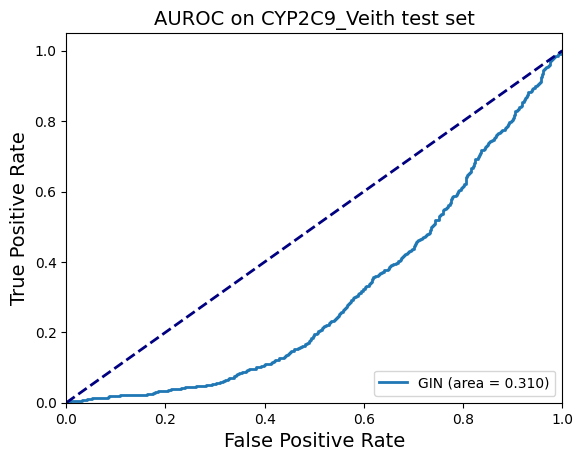

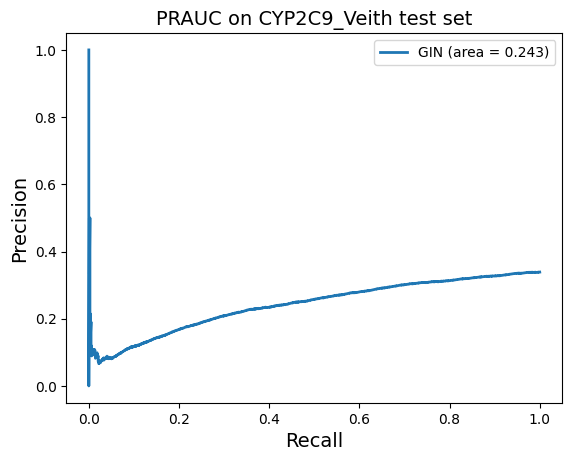


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.746  &0.500  &0.746  &1.000  &0.000  &0.855 &0.662 &  nan &0.823


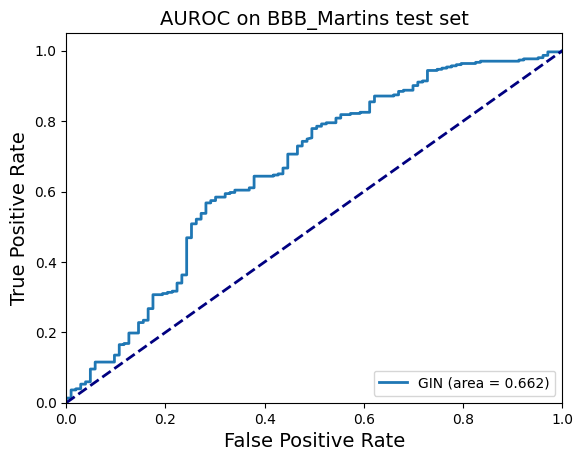

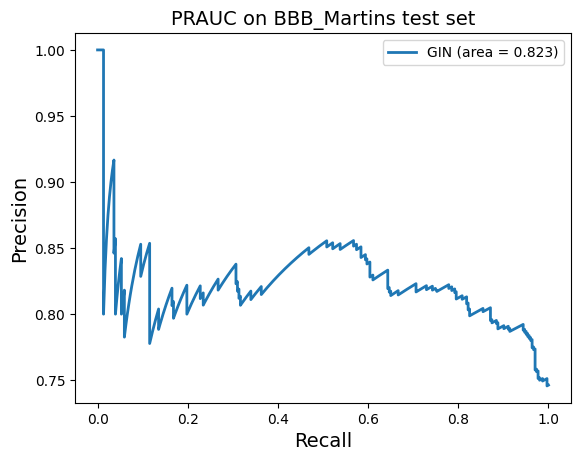


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.845  &0.500  &0.845  &1.000  &0.000  &0.916 &0.732 &  nan &0.910


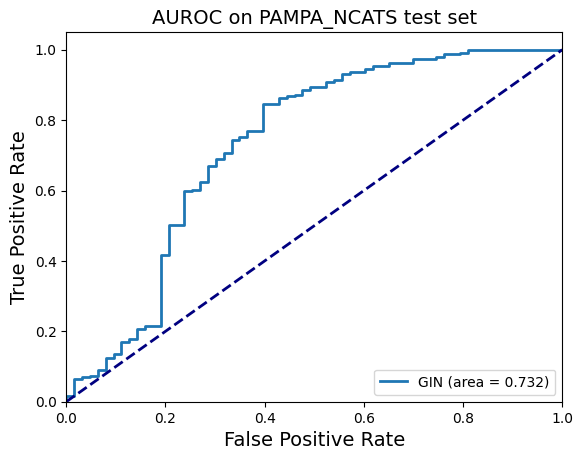

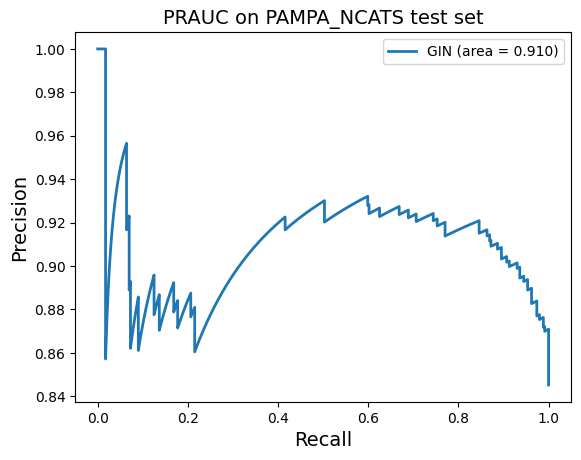


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.668  &0.676  &0.822  &0.544


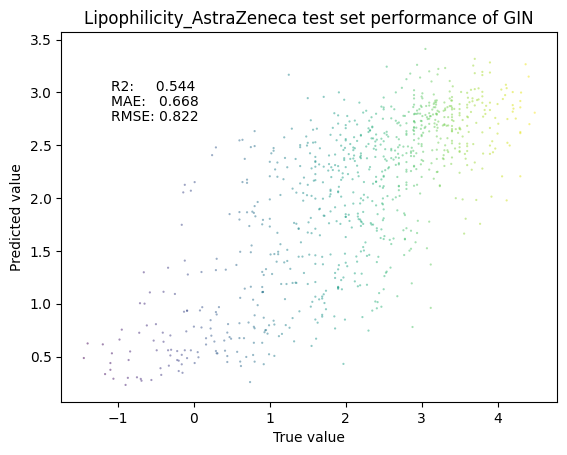


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&1.083  &2.372  &1.540  &0.563


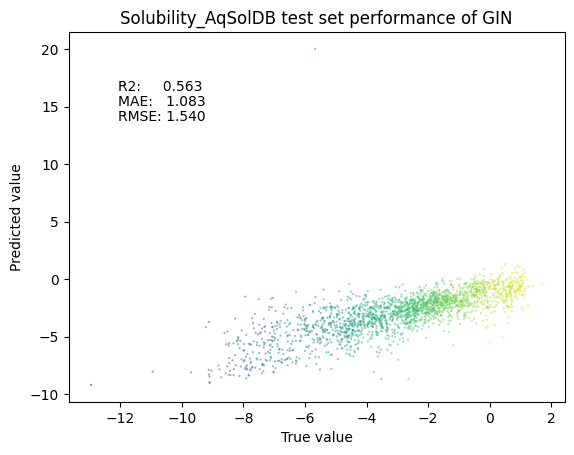


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.571  &0.571  &0.579  &0.516  &0.626  &0.546 &0.619 &0.142 &0.580


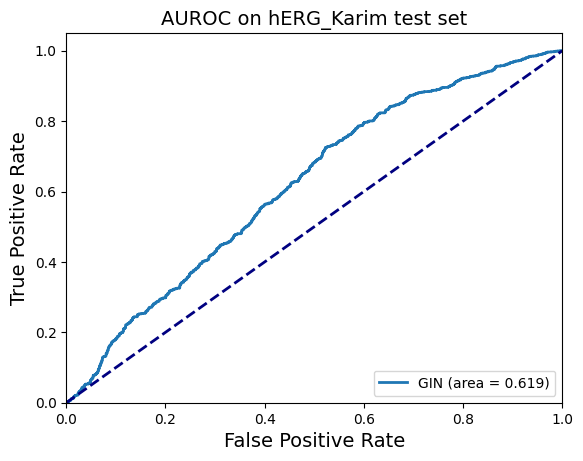

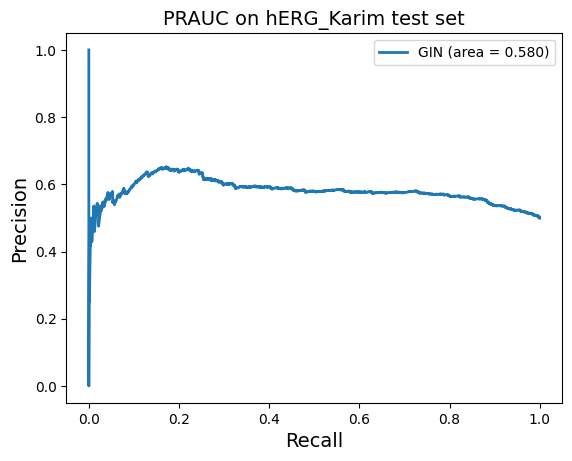


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.548  &0.500  &0.548  &1.000  &0.000  &0.708 &0.447 &  nan &0.498


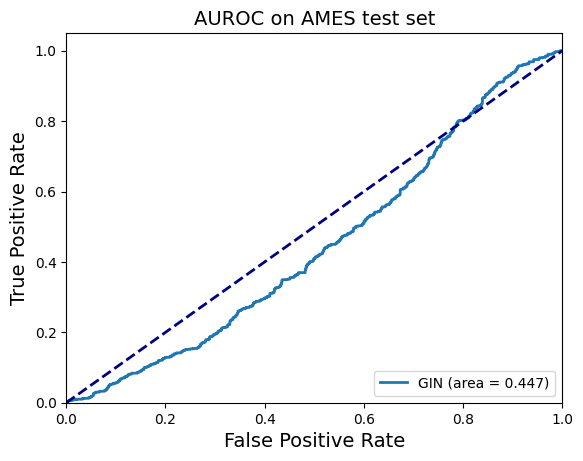

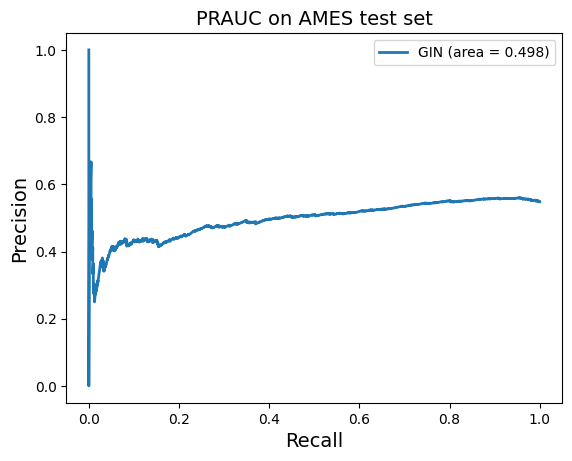


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.552  &0.537  &0.733  &0.399


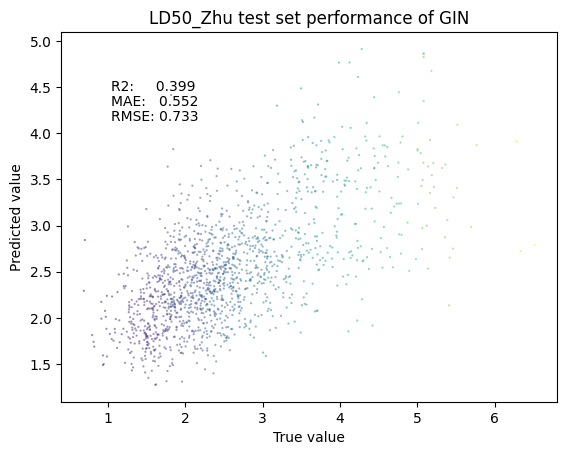


*************** Kp ***************
  MAE     MSE     RMSE    R2
&6.527  &135.016  &11.620  &0.285


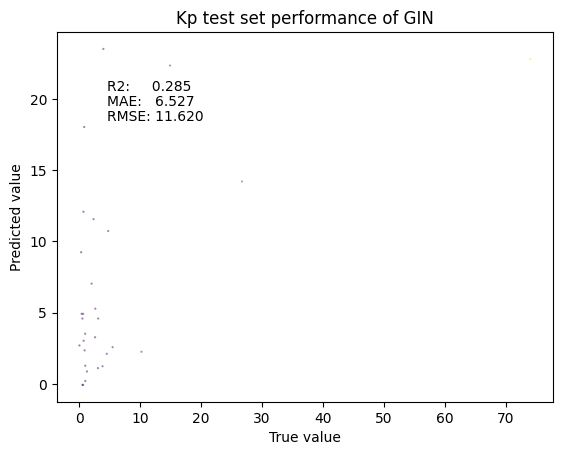



--> Train status saved at Kp+M5+AD4+T3/GIN_MT_1.yml
Finished evaluate test performance, outputs performance dict

Run # 2 for GIN MT	 | save dir:  Kp+M5+AD4+T3/GIN_MT_2 | 	cannot open Kp+M5+AD4+T3/GIN_MT_2.yml, retrain


gin_supervised_contextpred_pre_trained.pth: 100%|██████████| 7.45M/7.45M [00:01<00:00, 6.55MB/s]


Pretrained model loaded
Model type:  GIN | Model parameters:  1978937
Start training GIN...
Epoch:0 [Train] Loss: 0.487 | [Valid] Loss: 0.528	SAVE MODEL: loss: inf -> 0.528 | runtime: 2.214 ms
Epoch:1 [Train] Loss: 0.519 | [Valid] Loss: 0.036	SAVE MODEL: loss: 0.528 -> 0.036 | runtime: 2.212 ms
Epoch:2 [Train] Loss: 0.029 | [Valid] Loss: 0.015	SAVE MODEL: loss: 0.036 -> 0.015 | runtime: 2.213 ms
Epoch:3 [Train] Loss: 0.022 | [Valid] Loss: 0.014	SAVE MODEL: loss: 0.015 -> 0.014 | runtime: 2.213 ms
Epoch:4 [Train] Loss: 0.020 | [Valid] Loss: 0.012	SAVE MODEL: loss: 0.014 -> 0.012 | runtime: 2.216 ms
Epoch:5 [Train] Loss: 0.018 | [Valid] Loss: 0.011	SAVE MODEL: loss: 0.012 -> 0.011 | runtime: 2.205 ms
Epoch:6 [Train] Loss: 0.016 | [Valid] Loss: 0.010	SAVE MODEL: loss: 0.011 -> 0.010 | runtime: 2.218 ms
Epoch:7 [Train] Loss: 0.015 | [Valid] Loss: 0.010	SAVE MODEL: loss: 0.010 -> 0.010 | runtime: 2.218 ms
Epoch:8 [Train] Loss: 0.015 | [Valid] Loss: 0.009	SAVE MODEL: loss: 0.010 -> 0.009 | r

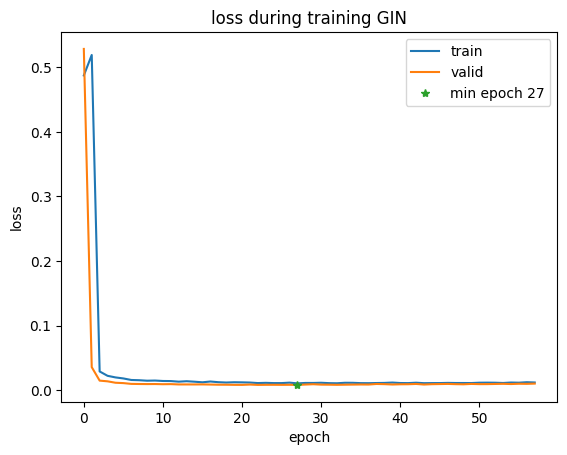

load pretrained model from  Kp+M5+AD4+T3/GIN_MT_2.pt
[Test] Loss: 0.128
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.715  &0.699  &0.793  &0.512  &0.887  &0.622 &0.812 &0.435 &0.745


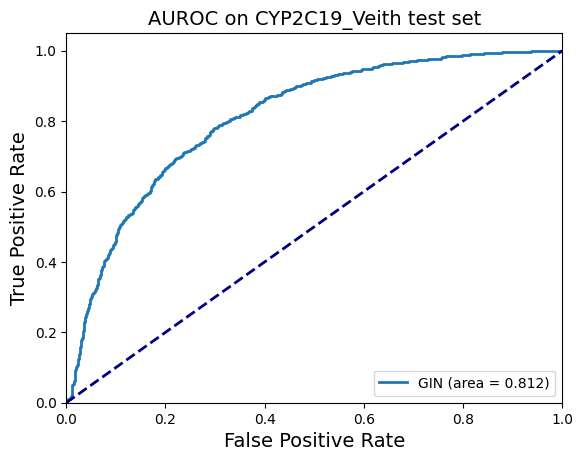

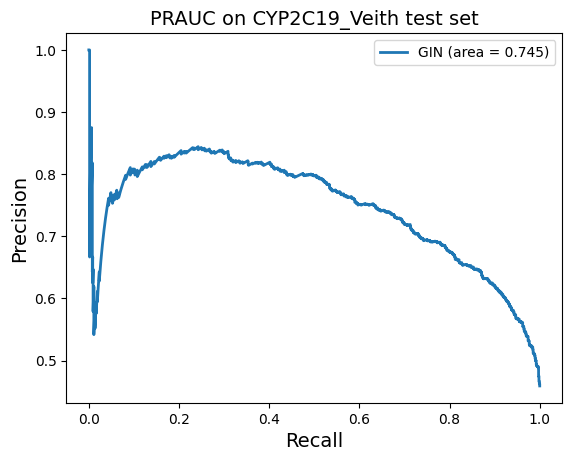


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.500  &  nan  &0.000  &1.000  &  nan &0.449 &  nan &0.167


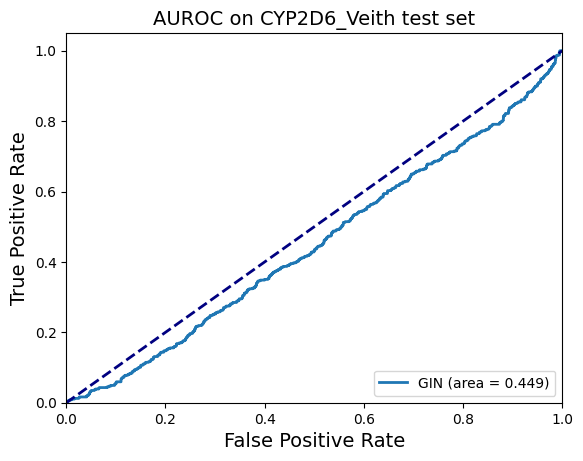

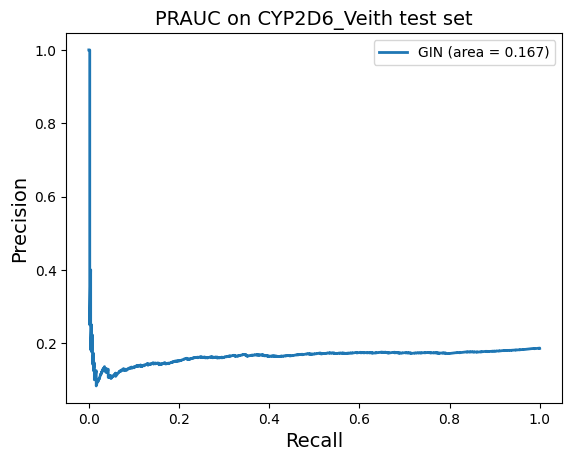


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.588  &0.500  &  nan  &0.000  &1.000  &  nan &0.775 &  nan &0.599


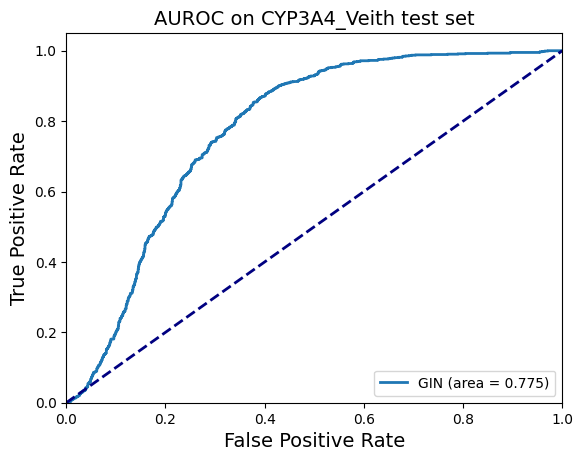

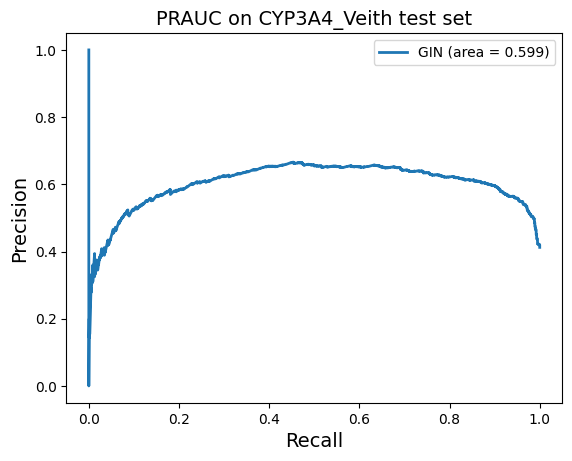


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.664  &0.651  &0.762  &0.420  &0.883  &0.542 &0.791 &0.344 &0.745


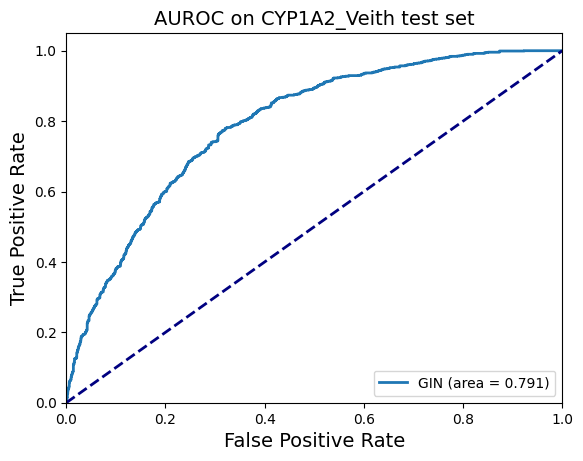

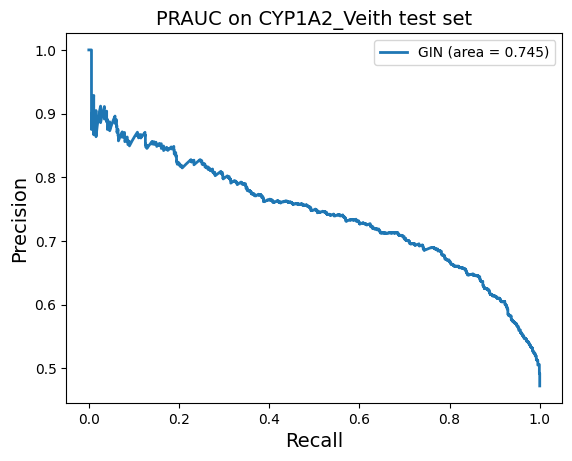


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.661  &0.500  &  nan  &0.000  &1.000  &  nan &0.807 &  nan &0.619


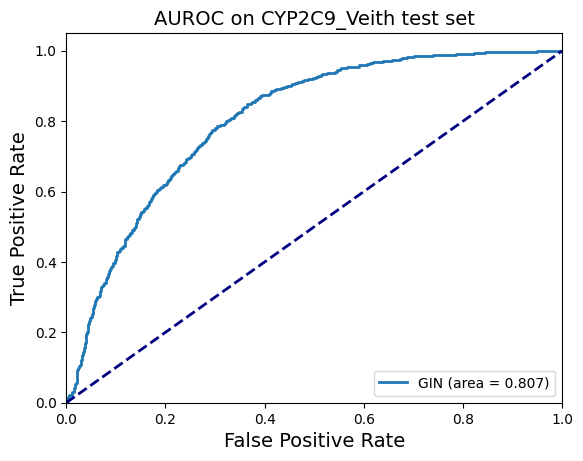

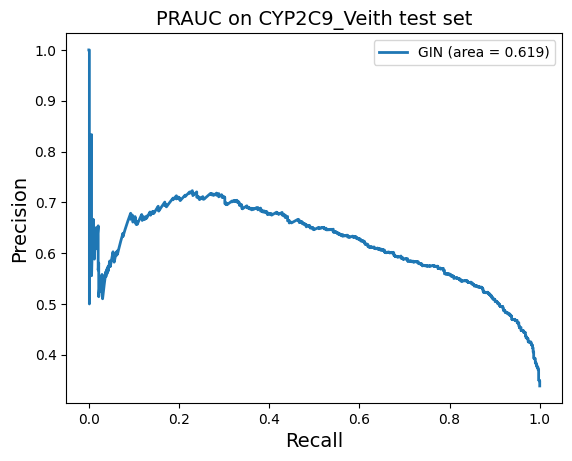


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.746  &0.500  &0.746  &1.000  &0.000  &0.855 &0.705 &  nan &0.842


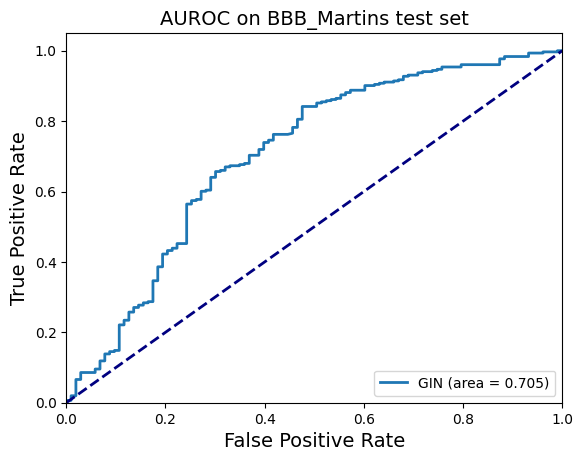

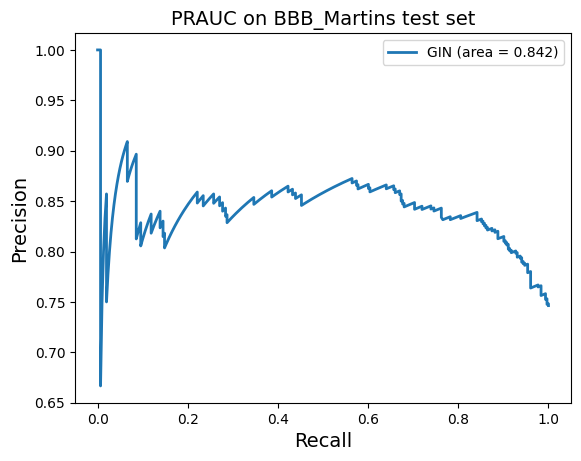


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.845  &0.500  &0.845  &1.000  &0.000  &0.916 &0.720 &  nan &0.905


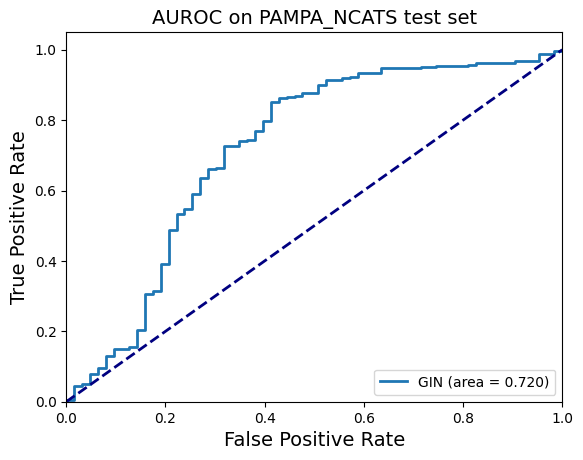

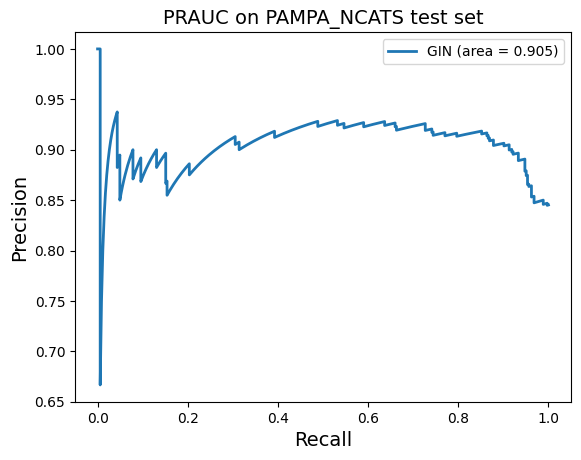


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.649  &0.658  &0.811  &0.556


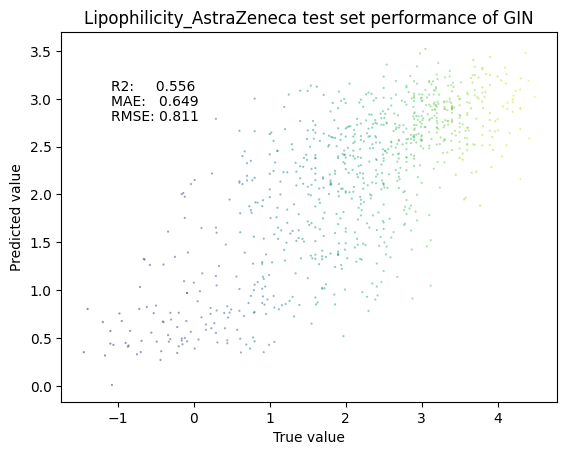


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&1.061  &2.085  &1.444  &0.616


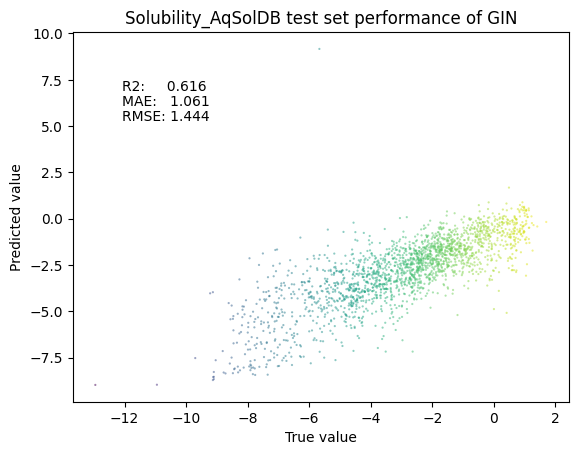


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.489  &0.489  &0.464  &0.147  &0.831  &0.223 &0.424 &-0.031 &0.459


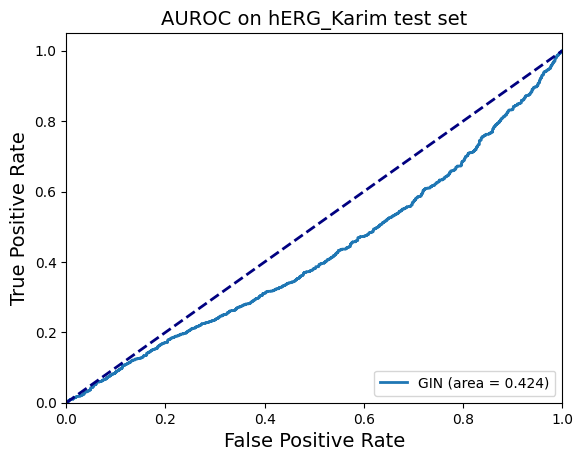

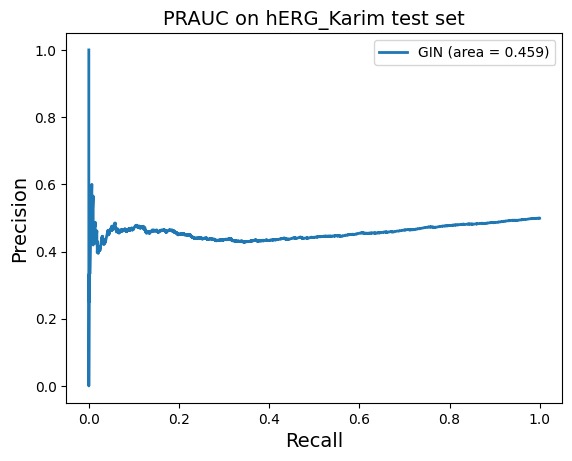


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.534  &0.554  &0.636  &0.351  &0.757  &0.452 &0.581 &0.117 &0.601


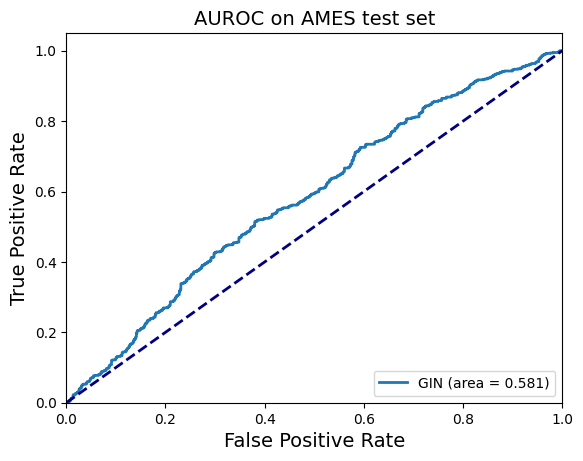

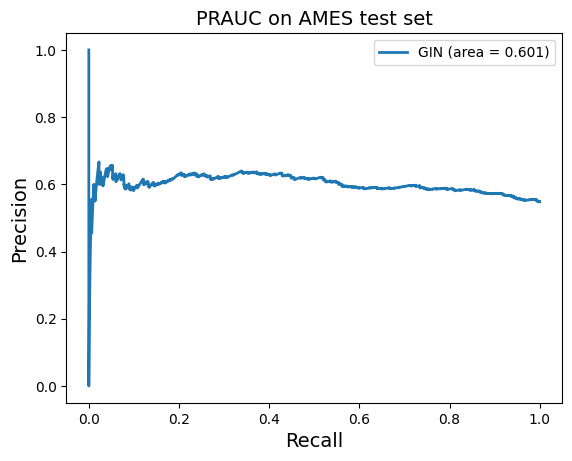


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.565  &0.557  &0.746  &0.377


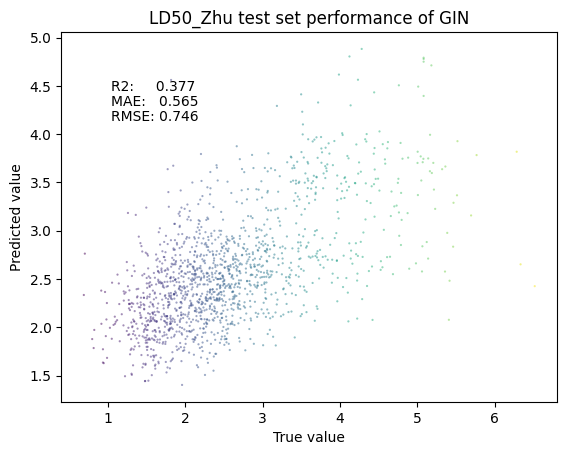


*************** Kp ***************
  MAE     MSE     RMSE    R2
&6.540  &131.721  &11.477  &0.303


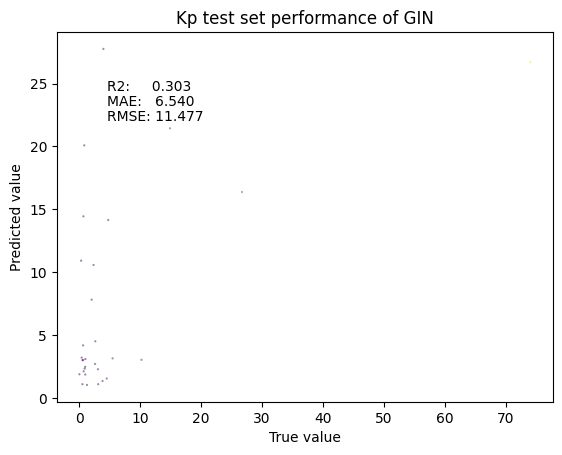

Found local copy...
Loading...




--> Train status saved at Kp+M5+AD4+T3/GIN_MT_2.yml
Finished evaluate test performance, outputs performance dict
repeated num # 3 idx 2 has the lowest loss
******************** CYP2C19_Veith ******************** 
	|       acc      |       w_acc      |       prec      |       recall      |       sp      |       f1      |       auc      |       mcc      |       ap      
	&0.667$\pm$0.049  &0.661$\pm$0.050  &0.666$\pm$0.092  &0.590$\pm$0.133  &0.732$\pm$0.115  &0.614$\pm$0.070  &0.743$\pm$0.057  &0.337$\pm$0.108  &0.655$\pm$0.076  
 idx 2: &0.715            &0.699            &0.793            &0.512            &0.887            &0.622            &0.812            &0.435            &0.745            

******************** CYP2D6_Veith ******************** 
	|       acc      |       w_acc      |       prec      |       recall      |       sp      |       f1      |       auc      |       mcc      |       ap      
	&0.814$\pm$0.000  &0.500$\pm$0.000  &nan$\pm$nan  &0.000$\pm$0.000  &1.000$\

Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!
Found local copy...
Loading...
Done!



START scaling train valid test data set: 
---> scale Lipophilicity_AstraZeneca | min -1.500 | max 4.500

START scaling train valid test data set: 
---> scale Solubility_AqSolDB | min -13.172 | max 2.138

START scaling train valid test data set: 
---> scale LD50_Zhu | min -0.343 | max 10.207

START scaling train valid test data set: 
---> scale Kp | min 0.014 | max 135.460
Finished scaling process | dict_scale: {'Lipophilicity_AstraZeneca': [-1.5, 4.5], 'Solubility_AqSolDB': [-13.1719, 2.1376816201], 'LD50_Zhu': [-0.3429999999999999, 10.207], 'Kp': [0.0139545499259114, 135.4599736770797]} 

---> loader for ['CYP2C19_Veith', 'CYP2D6_Veith', 'CYP3A4_Veith', 'CYP1A2_Veith', 'CYP2C9_Veith', 'BBB_Martins', 'PAMPA_NCATS', 'Lipophilicity_AstraZeneca', 'Solubility_AqSolDB', 'hERG_Karim', 'AMES', 'LD50_Zhu', 'Kp']
--> preparing data loader for model type  RNN
--> preparing data loader for model type  RNN
--> preparing data loader for model type  RNN
Model type:  RNN | Model parameters:  2982289

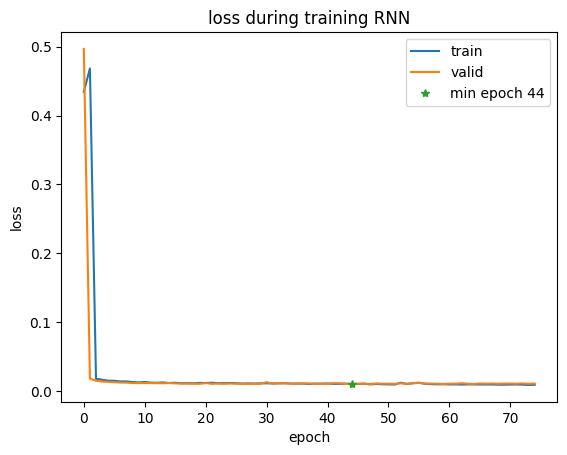

load pretrained model from  Kp+M5+AD4+T3/RNN_MT_0.pt
[Test] Loss: 0.116
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.674  &0.673  &0.643  &0.653  &0.692  &0.648 &0.746 &0.345 &0.672


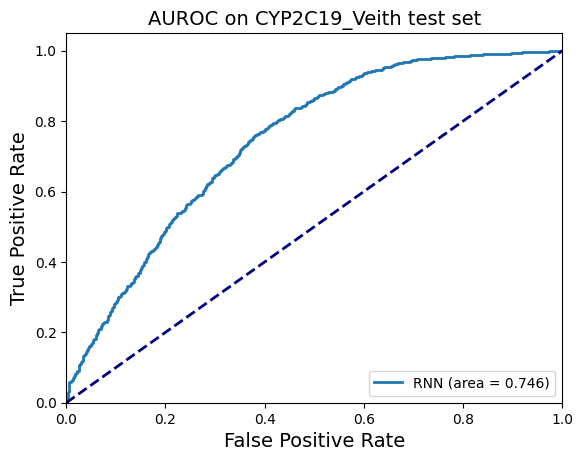

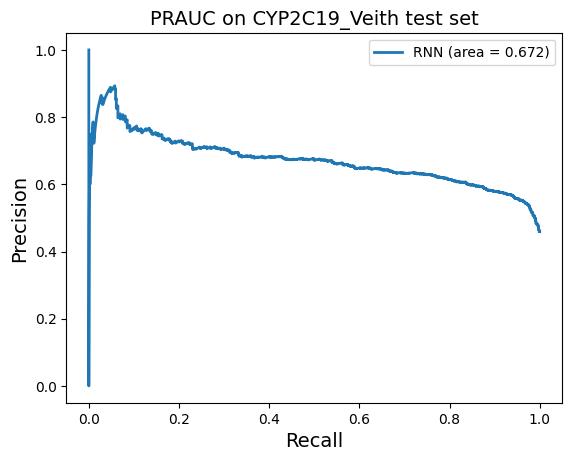


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.500  &  nan  &0.000  &1.000  &  nan &0.698 &  nan &0.369


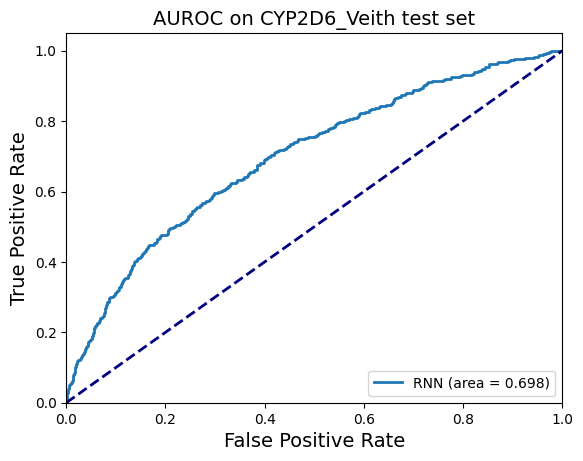

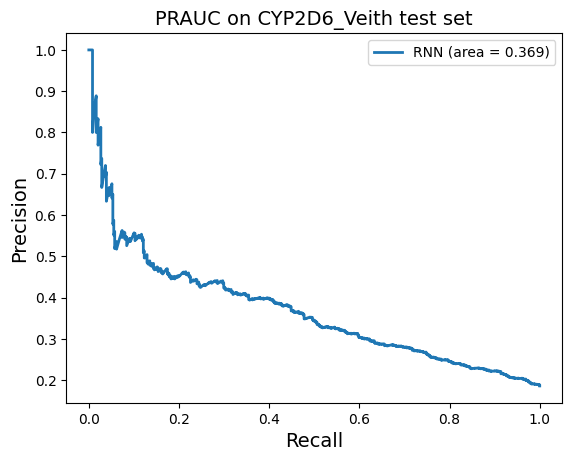


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.687  &0.671  &0.630  &0.582  &0.761  &0.605 &0.753 &0.347 &0.607


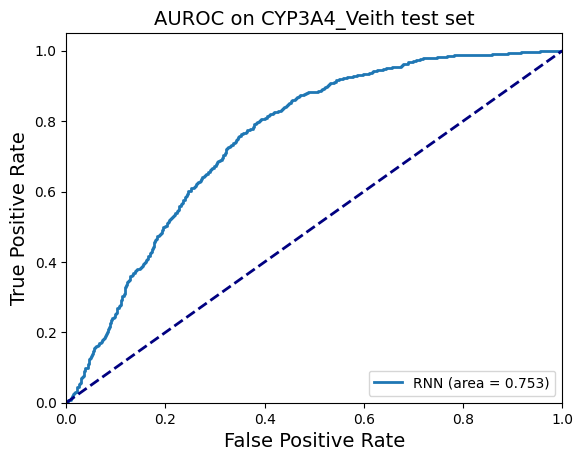

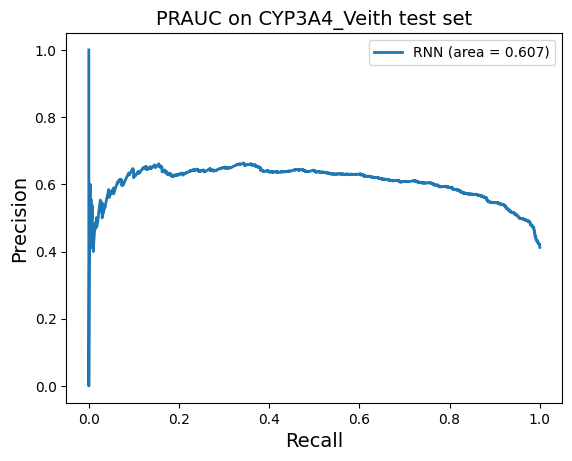


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.748  &0.750  &0.717  &0.773  &0.727  &0.744 &0.819 &0.499 &0.794


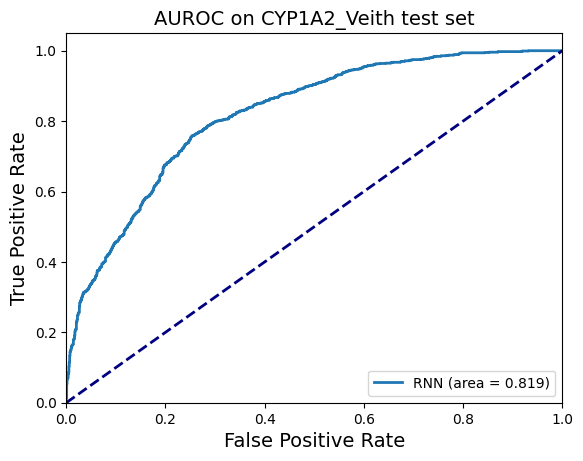

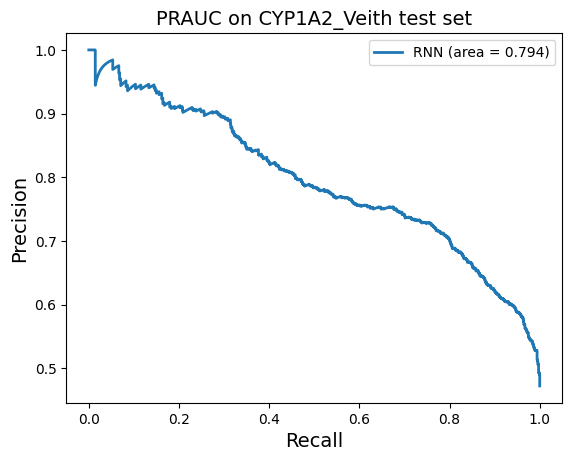


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.713  &0.625  &0.641  &0.350  &0.899  &0.453 &0.793 &0.304 &0.610


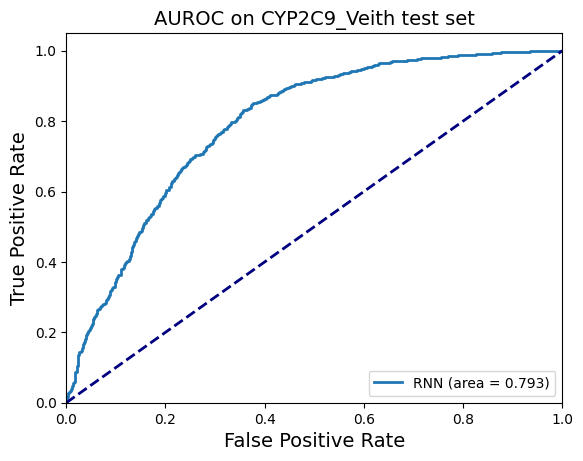

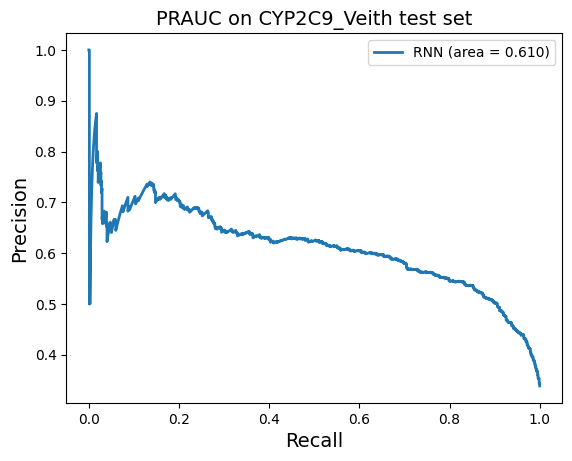


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.837  &0.721  &0.845  &0.957  &0.485  &0.898 &0.824 &0.532 &0.926


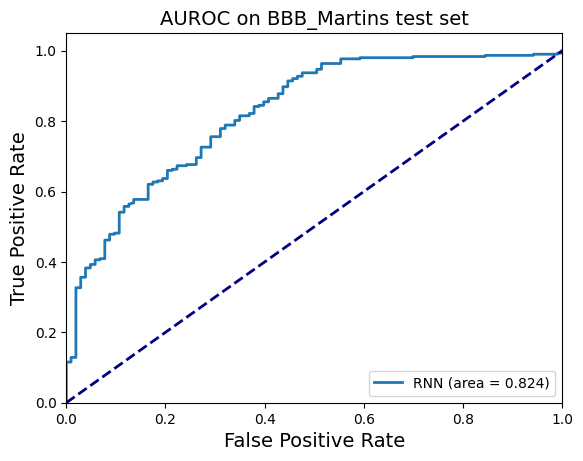

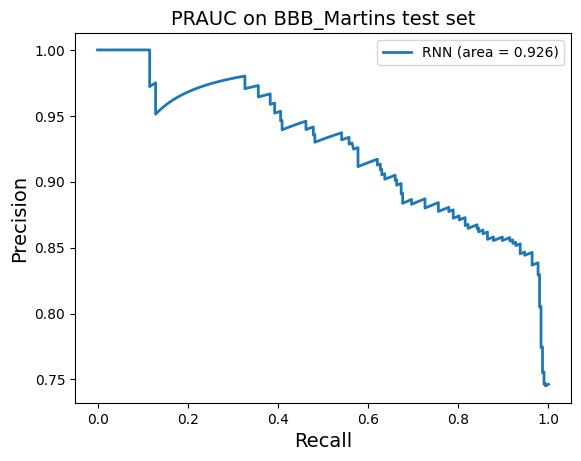


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.845  &0.500  &0.845  &1.000  &0.000  &0.916 &0.698 &  nan &0.914


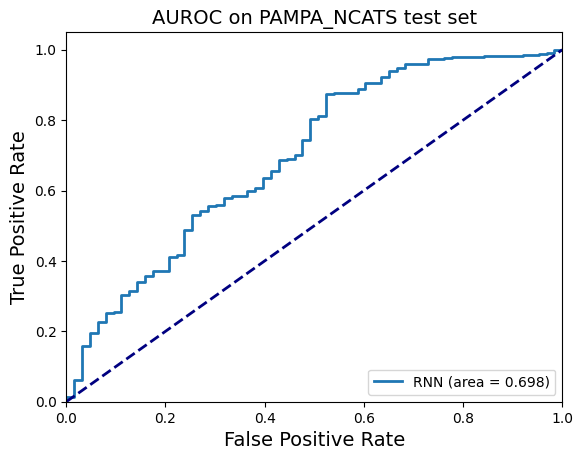

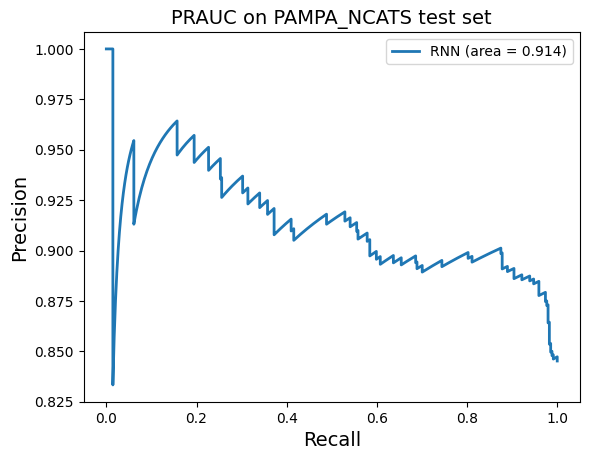


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.687  &0.763  &0.873  &0.485


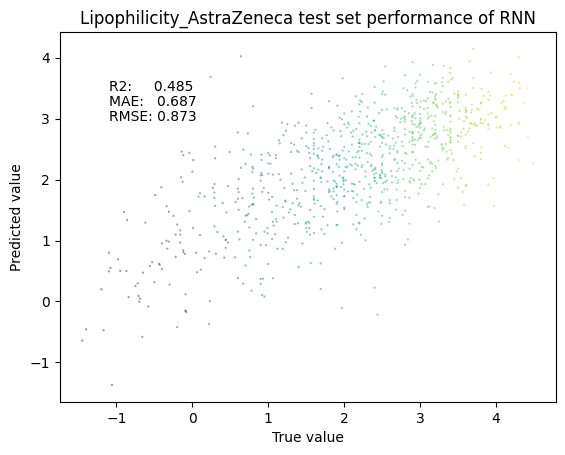


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&0.857  &1.370  &1.171  &0.747


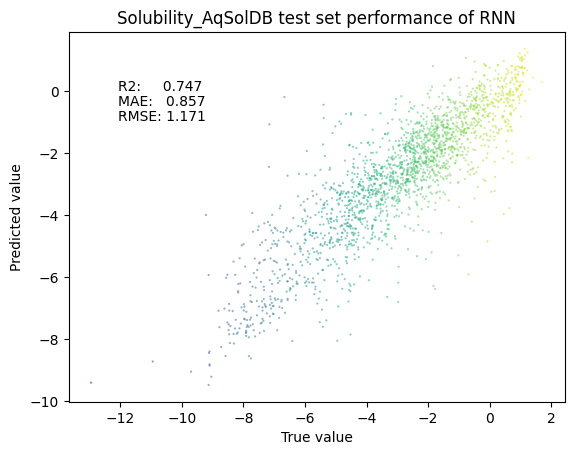


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.653  &0.653  &0.648  &0.670  &0.637  &0.659 &0.698 &0.307 &0.678


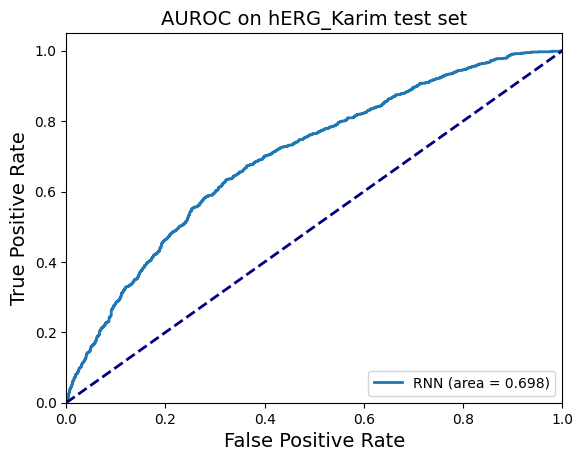

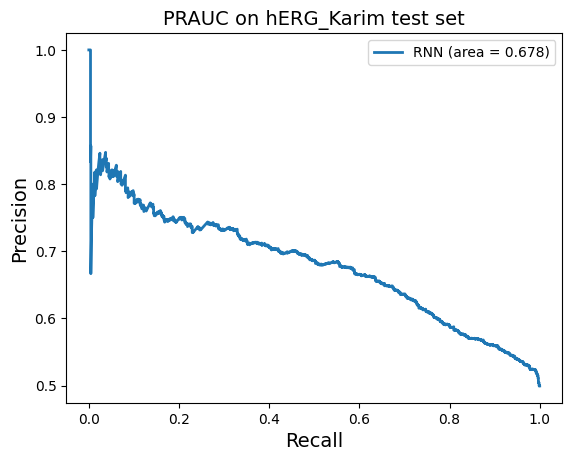


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.607  &0.595  &0.622  &0.723  &0.467  &0.669 &0.675 &0.196 &0.720


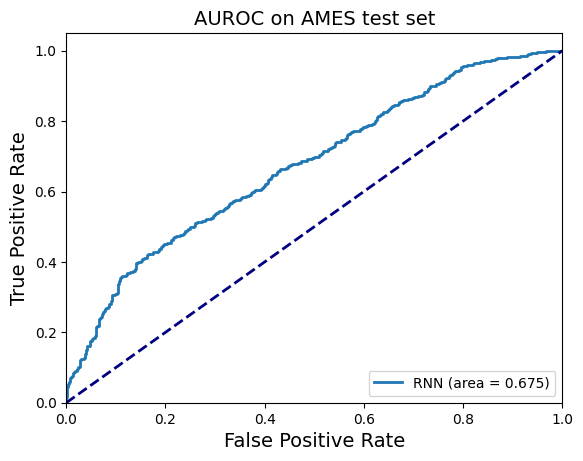

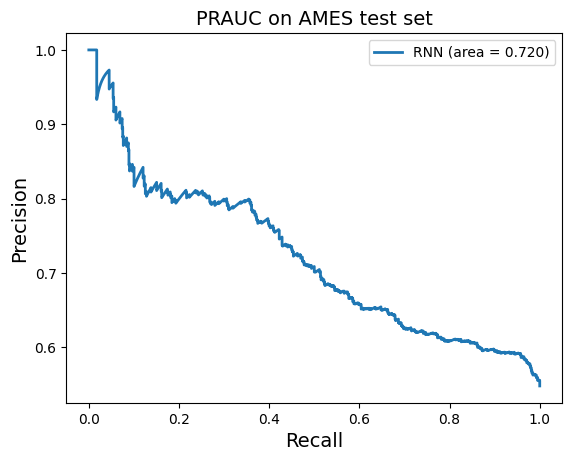


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.523  &0.466  &0.683  &0.478


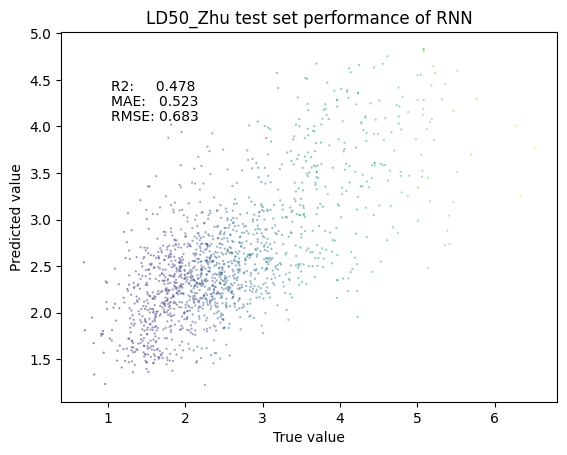


*************** Kp ***************
  MAE     MSE     RMSE    R2
&6.723  &193.881  &13.924  &-0.027


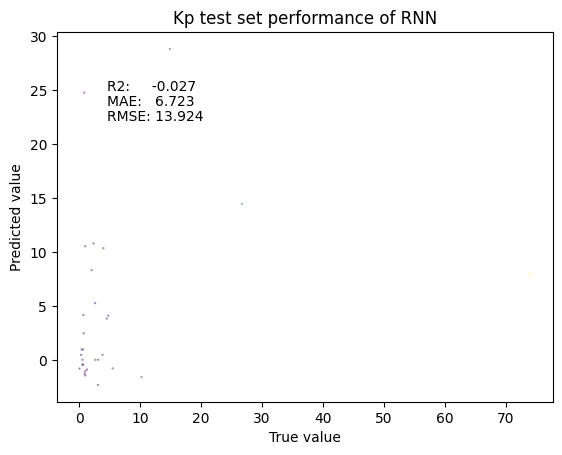



--> Train status saved at Kp+M5+AD4+T3/RNN_MT_0.yml
Finished evaluate test performance, outputs performance dict

Run # 1 for RNN MT	 | save dir:  Kp+M5+AD4+T3/RNN_MT_1 | 	cannot open Kp+M5+AD4+T3/RNN_MT_1.yml, retrain
Model type:  RNN | Model parameters:  2982289
Start training RNN...
Epoch:0 [Train] Loss: 0.437 | [Valid] Loss: 0.485	SAVE MODEL: loss: inf -> 0.485 | runtime: 1.221 ms
Epoch:1 [Train] Loss: 0.469 | [Valid] Loss: 0.021	SAVE MODEL: loss: 0.485 -> 0.021 | runtime: 1.234 ms
Epoch:2 [Train] Loss: 0.018 | [Valid] Loss: 0.016	SAVE MODEL: loss: 0.021 -> 0.016 | runtime: 1.225 ms
Epoch:3 [Train] Loss: 0.016 | [Valid] Loss: 0.014	SAVE MODEL: loss: 0.016 -> 0.014 | runtime: 1.229 ms
Epoch:4 [Train] Loss: 0.015 | [Valid] Loss: 0.013	SAVE MODEL: loss: 0.014 -> 0.013 | runtime: 1.229 ms
Epoch:5 [Train] Loss: 0.015 | [Valid] Loss: 0.013	EarlyStopping counter: 1 out of 30
Epoch:6 [Train] Loss: 0.014 | [Valid] Loss: 0.012	SAVE MODEL: loss: 0.013 -> 0.012 | runtime: 1.217 ms
Epoch:7 [T

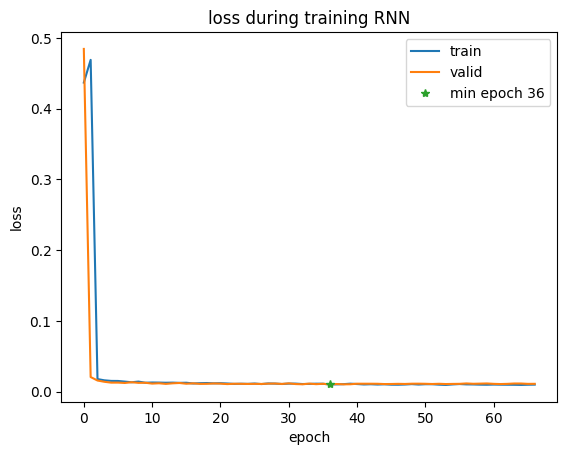

load pretrained model from  Kp+M5+AD4+T3/RNN_MT_1.pt
[Test] Loss: 0.119
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.655  &0.654  &0.619  &0.642  &0.665  &0.631 &0.725 &0.307 &0.651


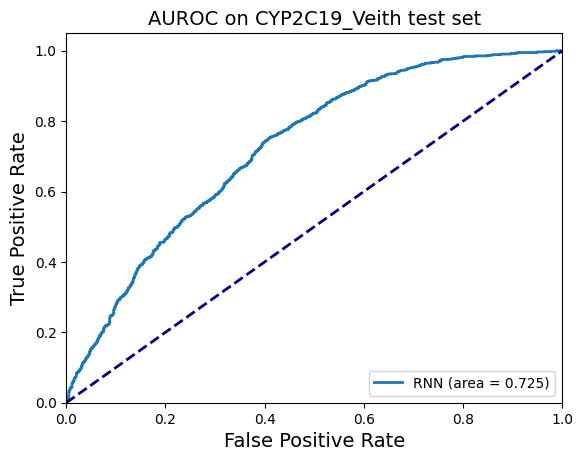

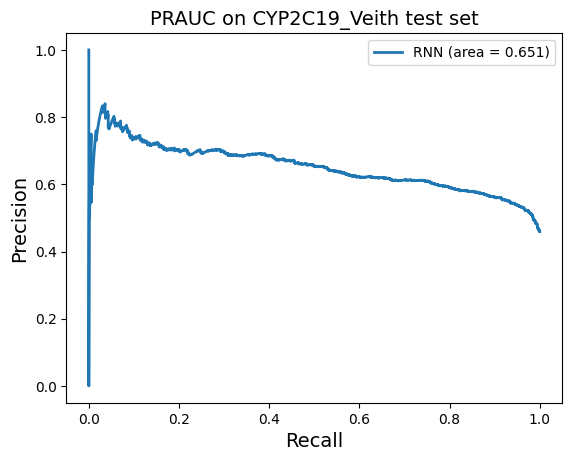


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.500  &  nan  &0.000  &1.000  &  nan &0.655 &  nan &0.290


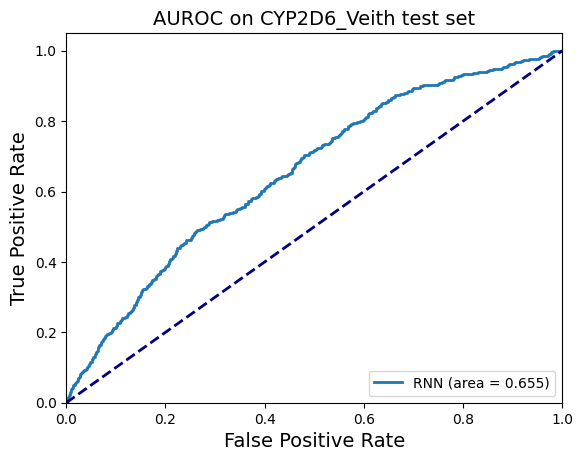

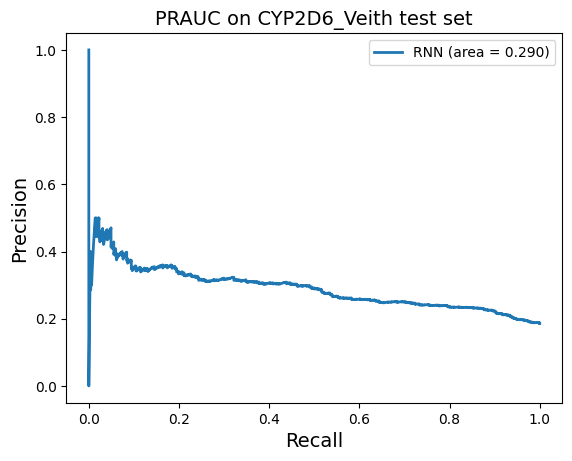


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.655  &0.632  &0.597  &0.503  &0.761  &0.546 &0.725 &0.274 &0.578


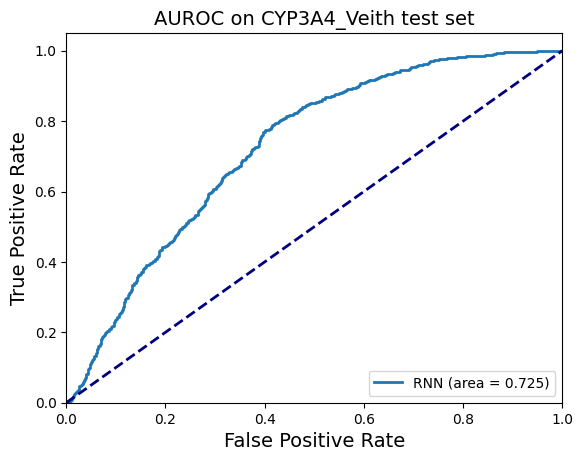

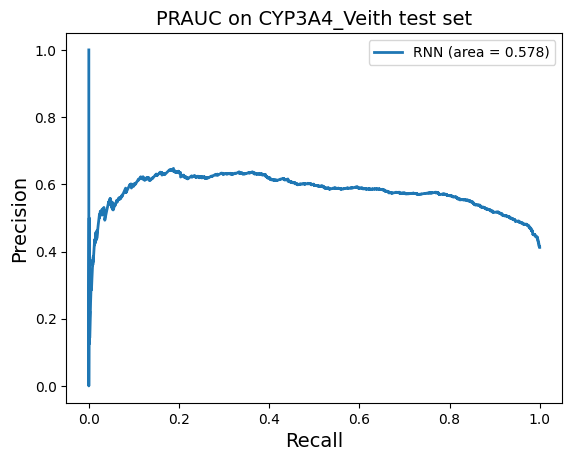


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.710  &0.710  &0.691  &0.698  &0.721  &0.695 &0.786 &0.419 &0.737


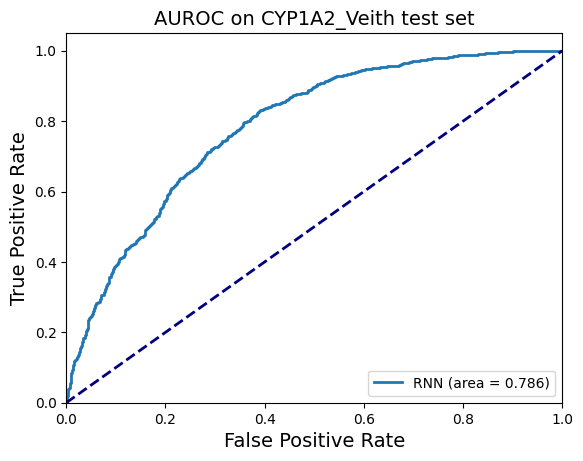

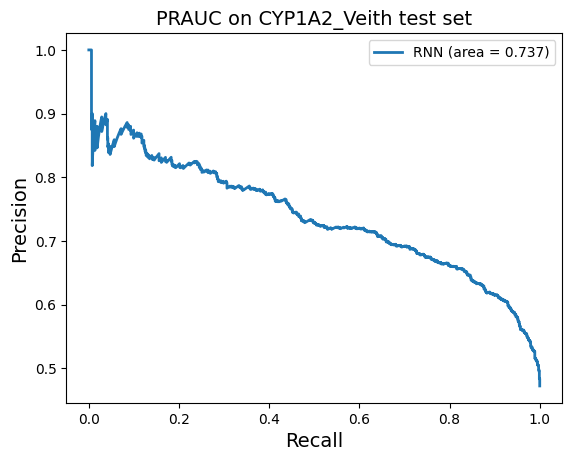


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.695  &0.581  &0.642  &0.226  &0.936  &0.334 &0.761 &0.236 &0.563


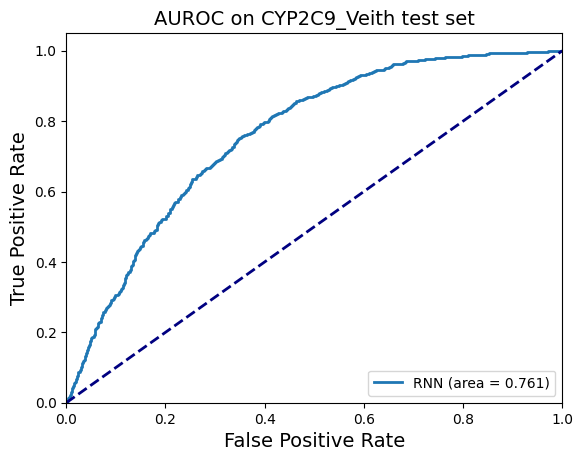

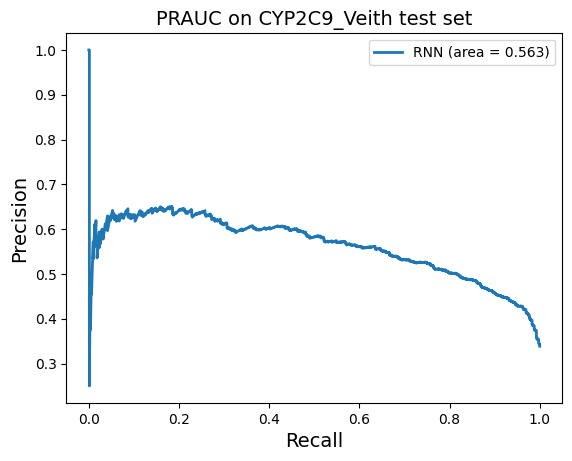


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.813  &0.660  &0.814  &0.970  &0.350  &0.886 &0.804 &0.443 &0.904


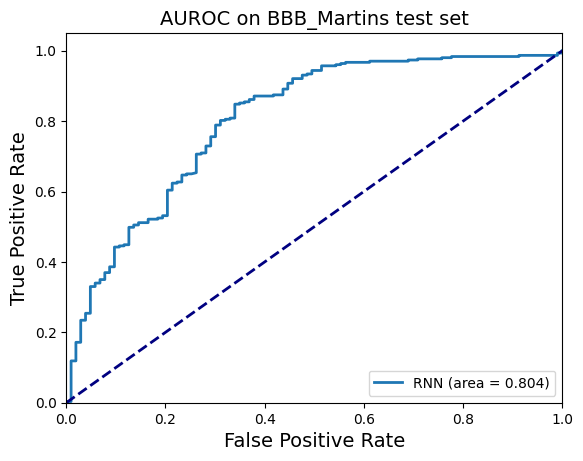

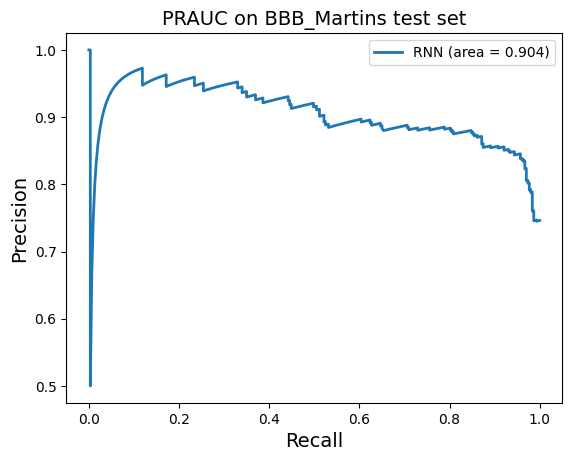


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.845  &0.500  &0.845  &1.000  &0.000  &0.916 &0.691 &  nan &0.903


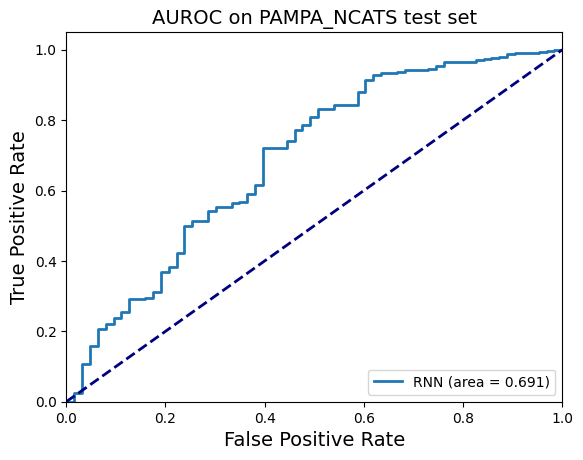

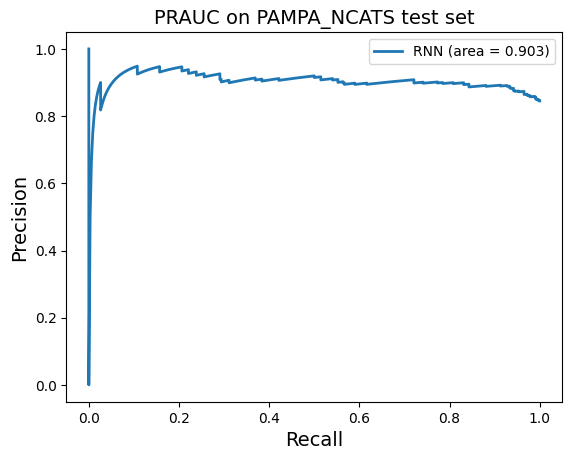


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.731  &0.837  &0.915  &0.435


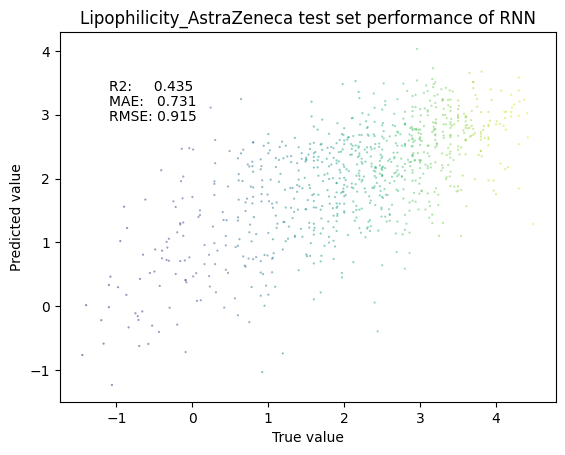


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&0.872  &1.422  &1.192  &0.738


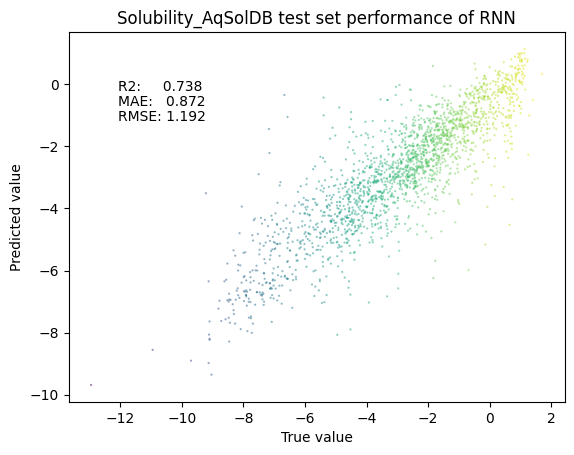


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.620  &0.620  &0.622  &0.606  &0.633  &0.614 &0.679 &0.239 &0.658


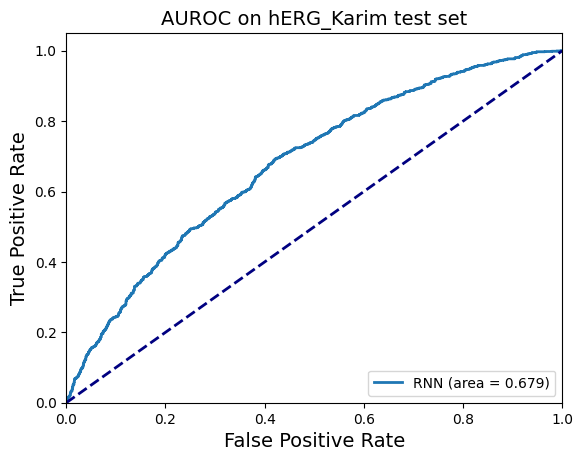

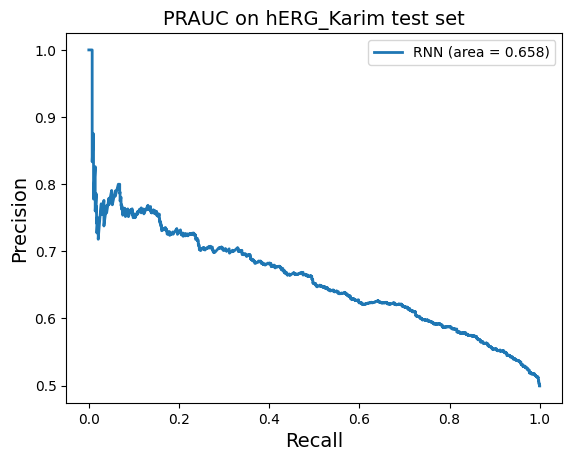


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.618  &0.609  &0.637  &0.704  &0.514  &0.669 &0.667 &0.222 &0.716


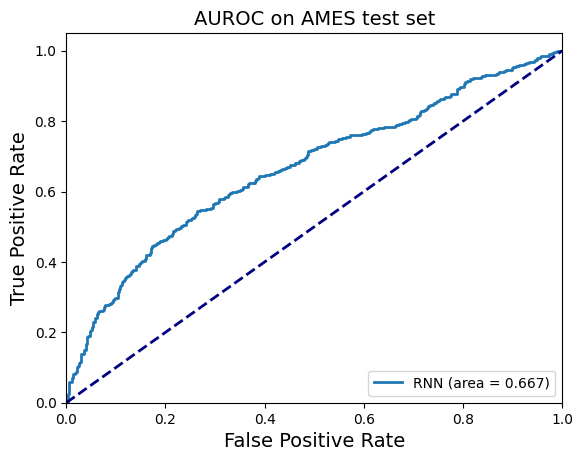

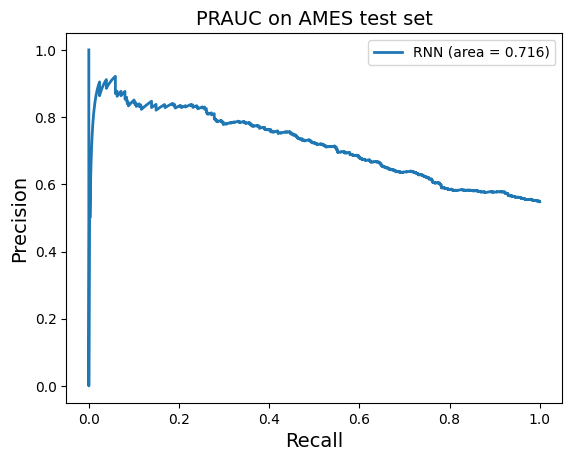


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.527  &0.494  &0.703  &0.447


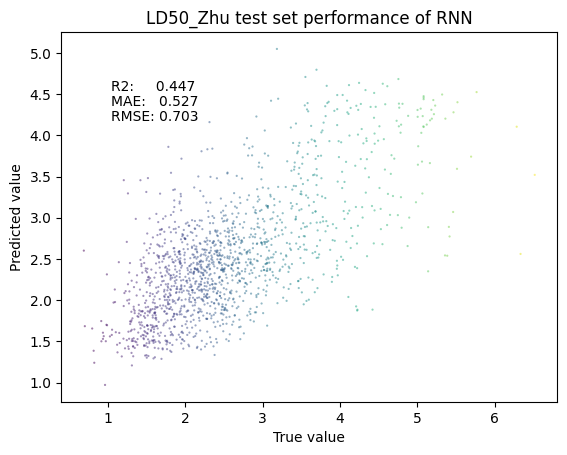


*************** Kp ***************
  MAE     MSE     RMSE    R2
&6.090  &181.440  &13.470  &0.039


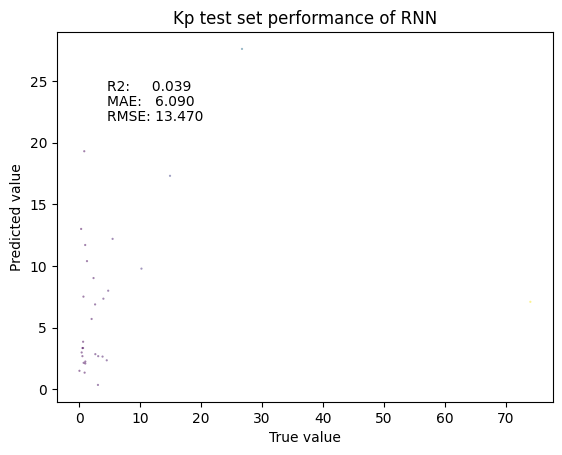



--> Train status saved at Kp+M5+AD4+T3/RNN_MT_1.yml
Finished evaluate test performance, outputs performance dict

Run # 2 for RNN MT	 | save dir:  Kp+M5+AD4+T3/RNN_MT_2 | 	cannot open Kp+M5+AD4+T3/RNN_MT_2.yml, retrain
Model type:  RNN | Model parameters:  2982289
Start training RNN...
Epoch:0 [Train] Loss: 0.437 | [Valid] Loss: 0.483	SAVE MODEL: loss: inf -> 0.483 | runtime: 1.233 ms
Epoch:1 [Train] Loss: 0.465 | [Valid] Loss: 0.018	SAVE MODEL: loss: 0.483 -> 0.018 | runtime: 1.221 ms
Epoch:2 [Train] Loss: 0.018 | [Valid] Loss: 0.018	EarlyStopping counter: 1 out of 30
Epoch:3 [Train] Loss: 0.016 | [Valid] Loss: 0.014	SAVE MODEL: loss: 0.018 -> 0.014 | runtime: 1.215 ms
Epoch:4 [Train] Loss: 0.015 | [Valid] Loss: 0.013	SAVE MODEL: loss: 0.014 -> 0.013 | runtime: 1.222 ms
Epoch:5 [Train] Loss: 0.015 | [Valid] Loss: 0.015	EarlyStopping counter: 1 out of 30
Epoch:6 [Train] Loss: 0.015 | [Valid] Loss: 0.013	SAVE MODEL: loss: 0.013 -> 0.013 | runtime: 1.221 ms
Epoch:7 [Train] Loss: 0.013 

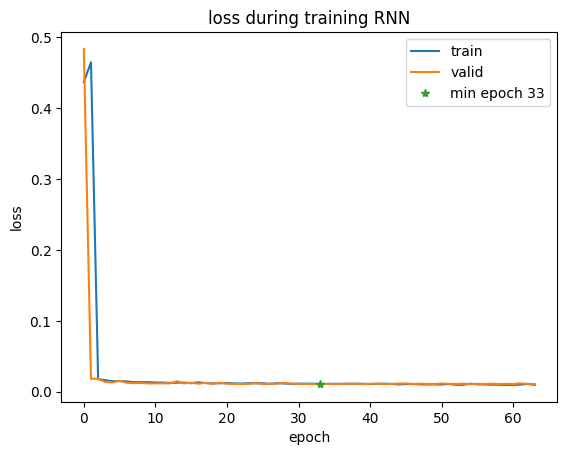

load pretrained model from  Kp+M5+AD4+T3/RNN_MT_2.pt
[Test] Loss: 0.120
*************** CYP2C19_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.655  &0.650  &0.632  &0.593  &0.707  &0.612 &0.730 &0.302 &0.659


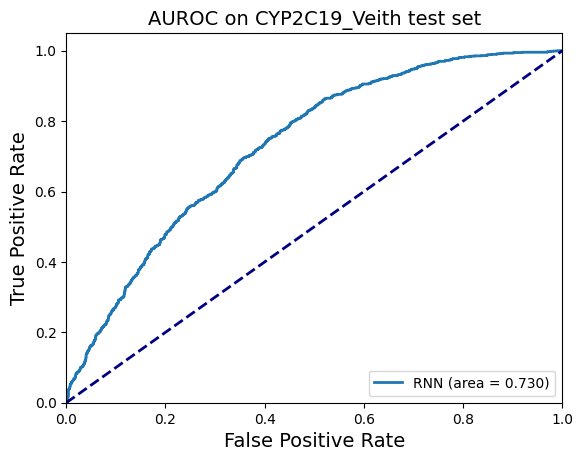

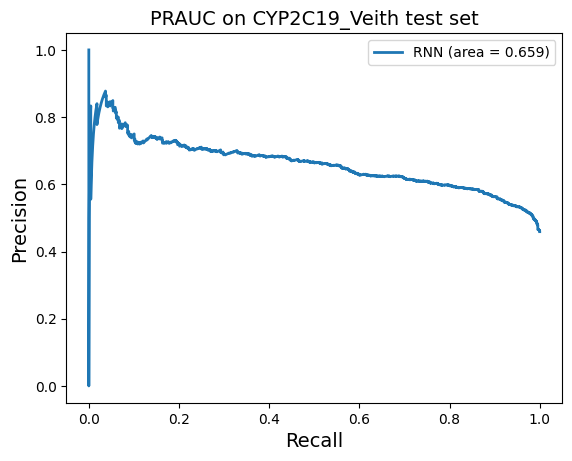


*************** CYP2D6_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.814  &0.500  &  nan  &0.000  &1.000  &  nan &0.641 &  nan &0.269


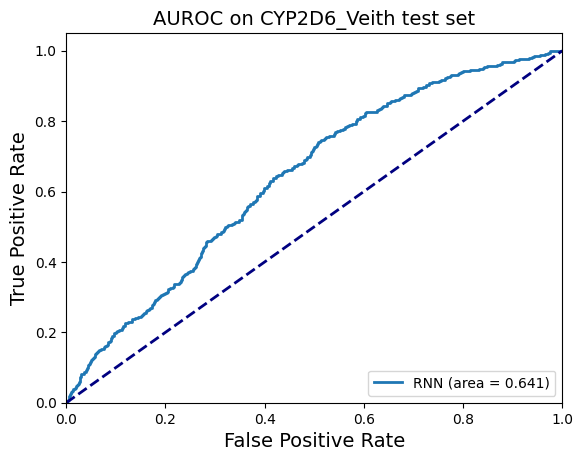

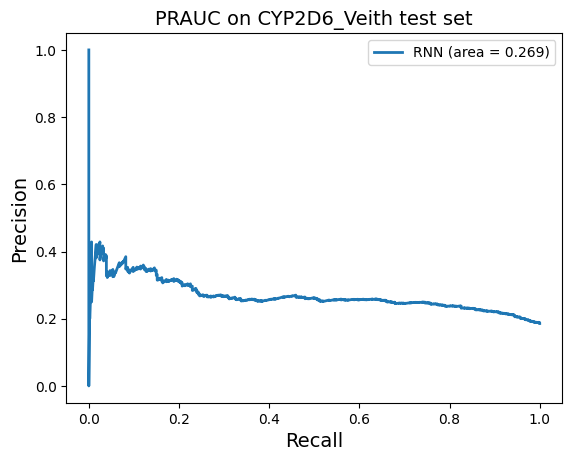


*************** CYP3A4_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.646  &0.612  &0.603  &0.417  &0.807  &0.493 &0.722 &0.245 &0.581


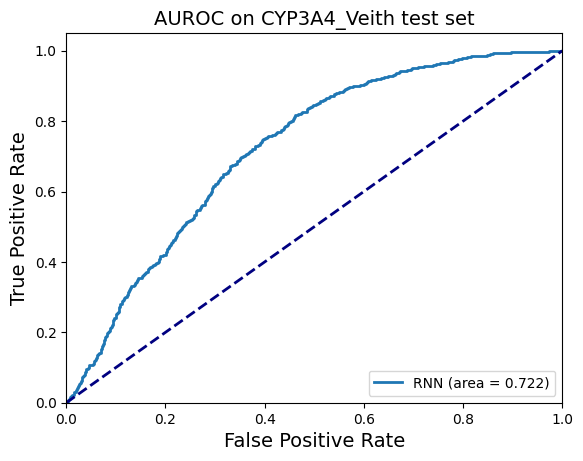

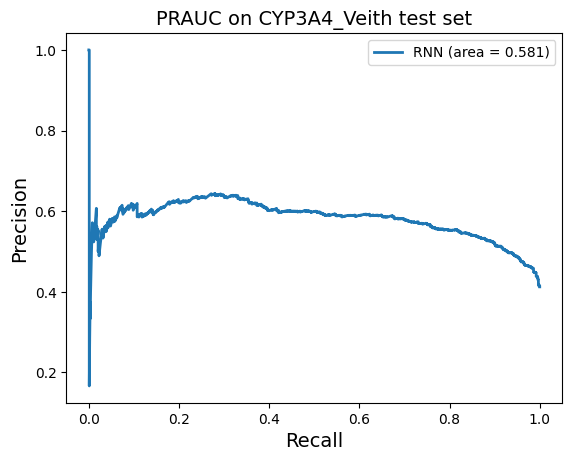


*************** CYP1A2_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.719  &0.717  &0.708  &0.688  &0.746  &0.698 &0.799 &0.435 &0.775


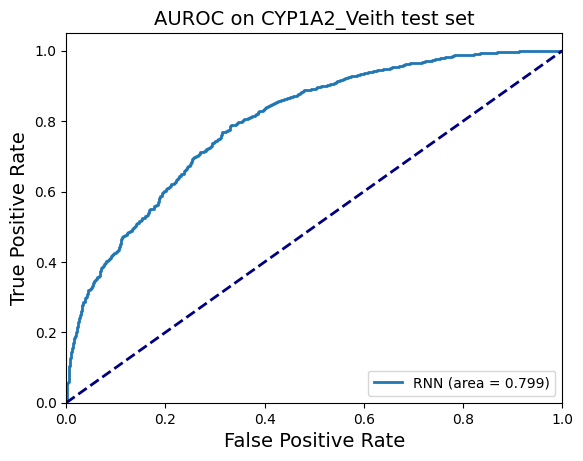

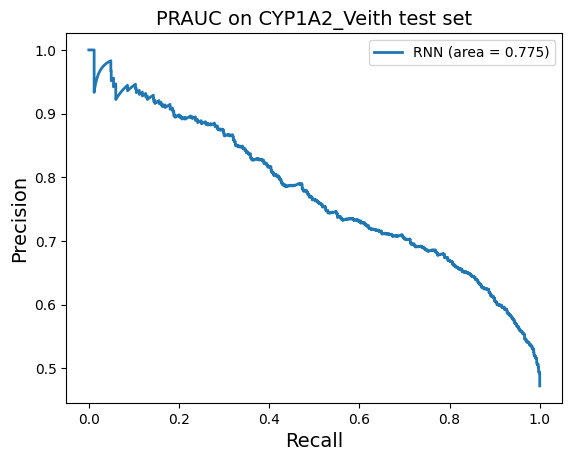


*************** CYP2C9_Veith ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.683  &0.553  &0.640  &0.148  &0.957  &0.240 &0.743 &0.186 &0.545


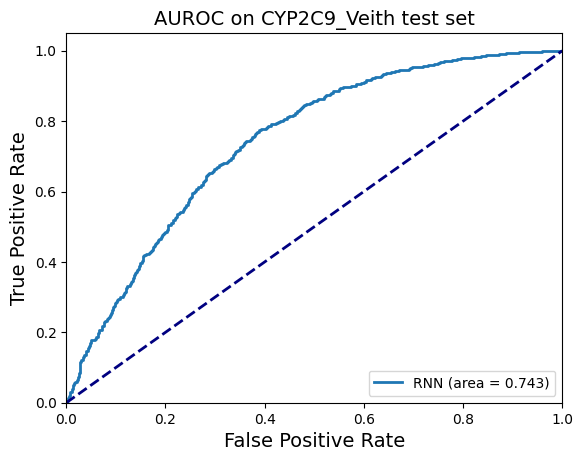

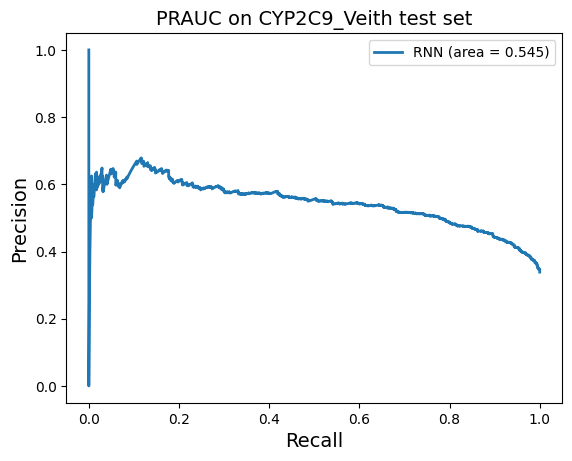


*************** BBB_Martins ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.771  &0.568  &0.773  &0.980  &0.155  &0.865 &0.780 &0.261 &0.898


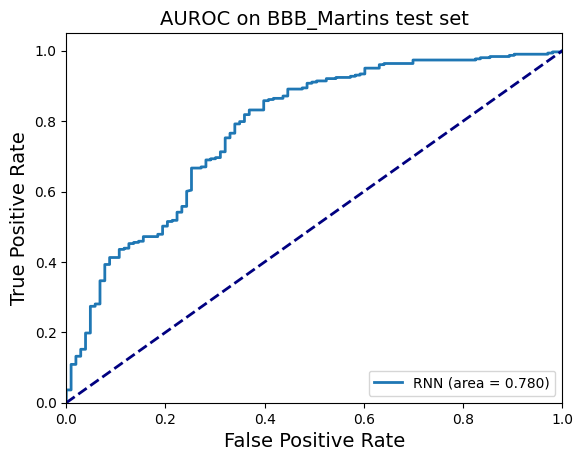

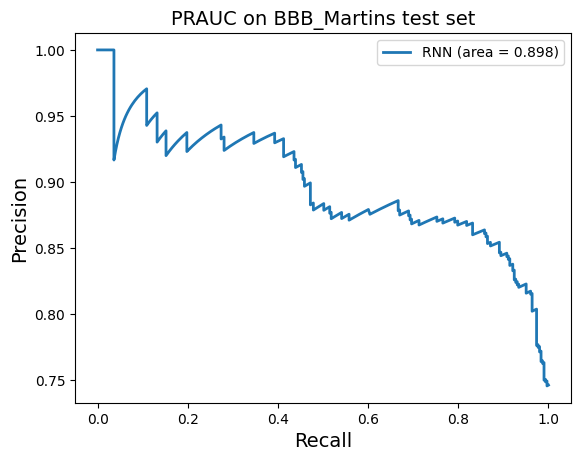


*************** PAMPA_NCATS ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.845  &0.500  &0.845  &1.000  &0.000  &0.916 &0.638 &  nan &0.888


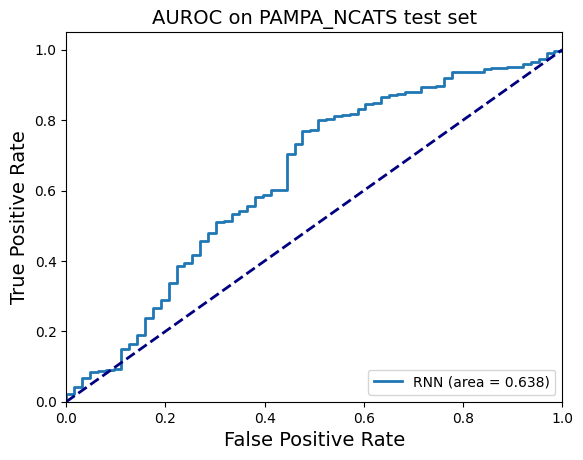

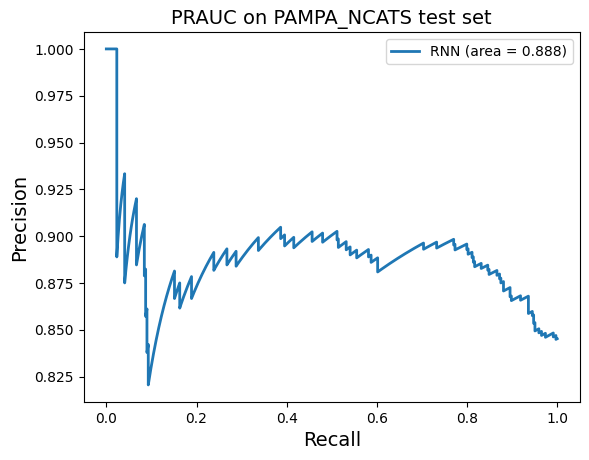


*************** Lipophilicity_AstraZeneca ***************
  MAE     MSE     RMSE    R2
&0.749  &0.872  &0.934  &0.411


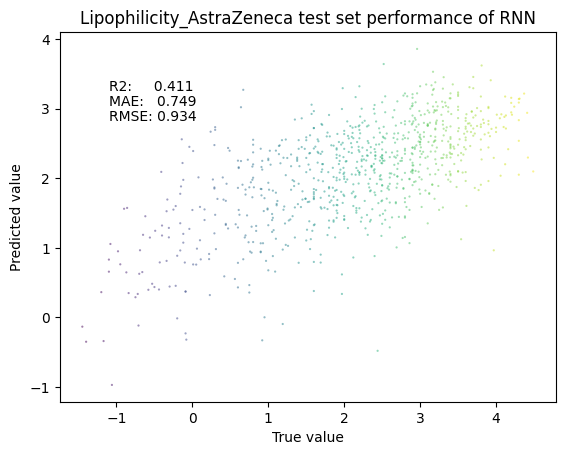


*************** Solubility_AqSolDB ***************
  MAE     MSE     RMSE    R2
&0.880  &1.429  &1.195  &0.737


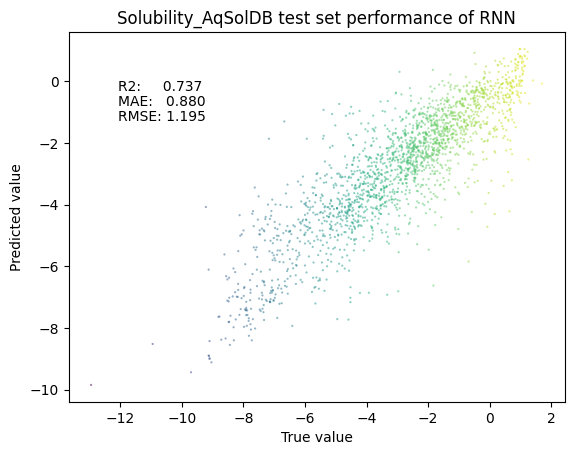


*************** hERG_Karim ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.619  &0.619  &0.623  &0.601  &0.637  &0.612 &0.674 &0.238 &0.642


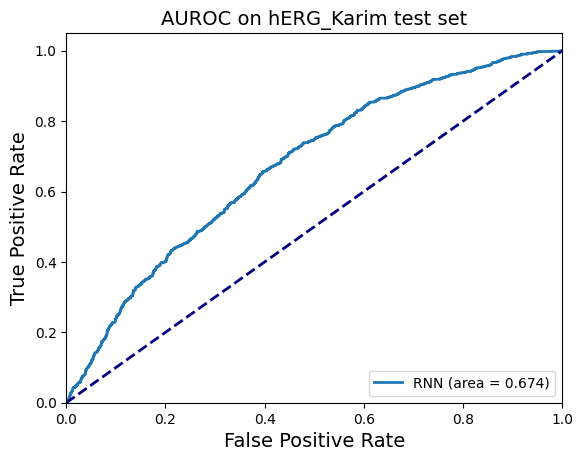

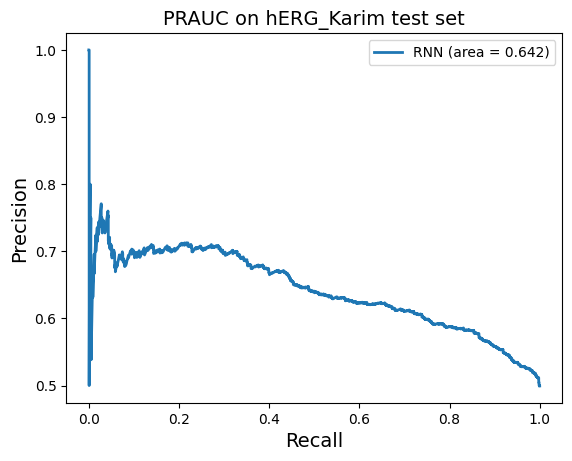


*************** AMES ***************
  Acc,  w_acc,   prec,  recall,   SP,     F1,    AUC,   MCC,   AP
&0.607  &0.599  &0.632  &0.679  &0.520  &0.655 &0.661 &0.201 &0.706


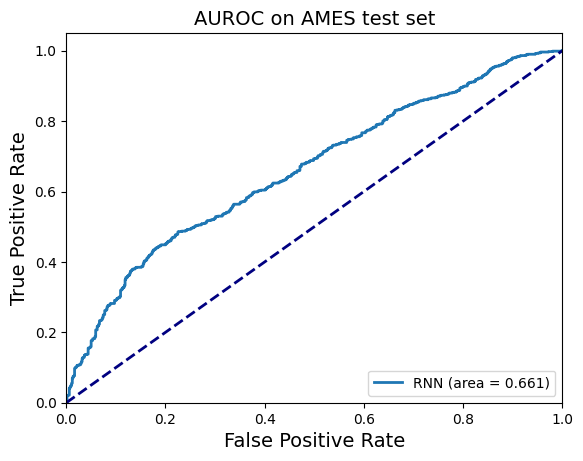

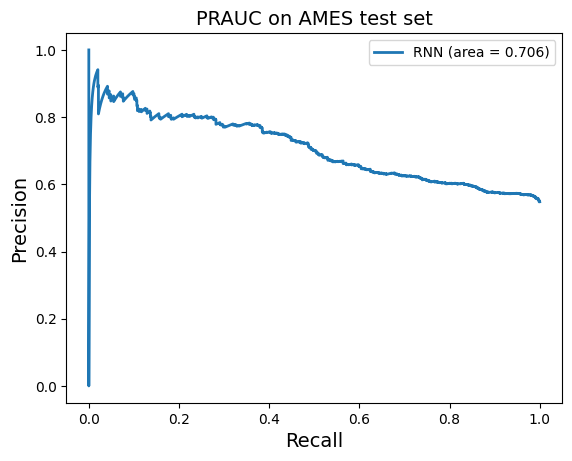


*************** LD50_Zhu ***************
  MAE     MSE     RMSE    R2
&0.541  &0.504  &0.710  &0.436


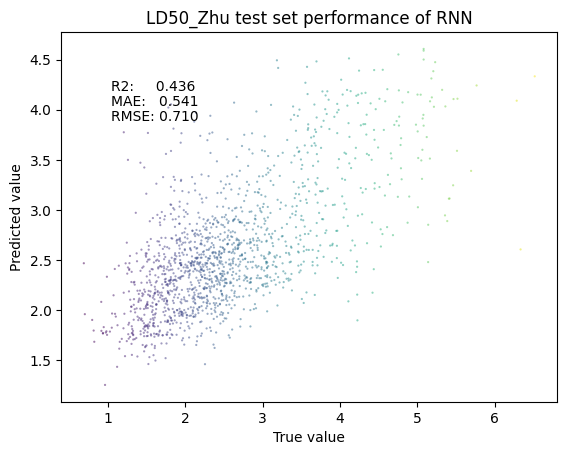


*************** Kp ***************
  MAE     MSE     RMSE    R2
&6.412  &186.792  &13.667  &0.011


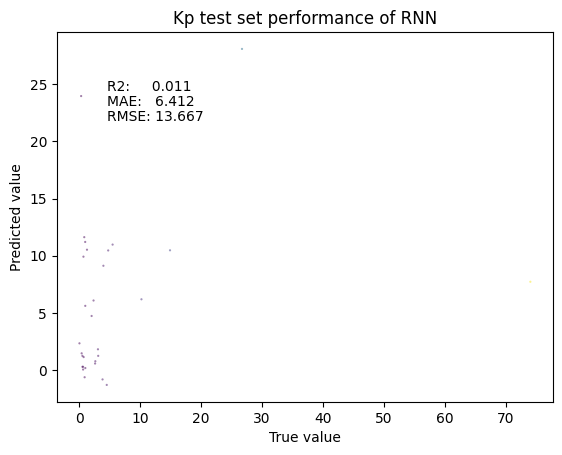



--> Train status saved at Kp+M5+AD4+T3/RNN_MT_2.yml
Finished evaluate test performance, outputs performance dict
repeated num # 3 idx 0 has the lowest loss
******************** CYP2C19_Veith ******************** 
	|       acc      |       w_acc      |       prec      |       recall      |       sp      |       f1      |       auc      |       mcc      |       ap      
	&0.661$\pm$0.009  &0.659$\pm$0.010  &0.631$\pm$0.010  &0.630$\pm$0.026  &0.688$\pm$0.017  &0.630$\pm$0.015  &0.734$\pm$0.009  &0.318$\pm$0.019  &0.660$\pm$0.009  
 idx 0: &0.674            &0.673            &0.643            &0.653            &0.692            &0.648            &0.746            &0.345            &0.672            

******************** CYP2D6_Veith ******************** 
	|       acc      |       w_acc      |       prec      |       recall      |       sp      |       f1      |       auc      |       mcc      |       ap      
	&0.814$\pm$0.000  &0.500$\pm$0.000  &nan$\pm$nan  &0.000$\pm$0.000  &1.000$\

In [ ]:
for model_type in ['MLP', 'AttentiveFP', 'GIN', 'RNN']:
    p = train_mt(names, model_type, 'Kp+M5+AD4+T3', repeat_time=3, retrain=False, uw=True)